In [1]:
# This file runs a "Leave One Out Cross Validation" by
# -looping through each individual,
# -training a KNN model with remaining individuals,
# -finding best k for highest accuracy and f1-score,
# -validate the model with left-out individual
# -print the confusion matrix and graph the overall accuracy and precision

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import accuracy_score, f1_score, precision_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns

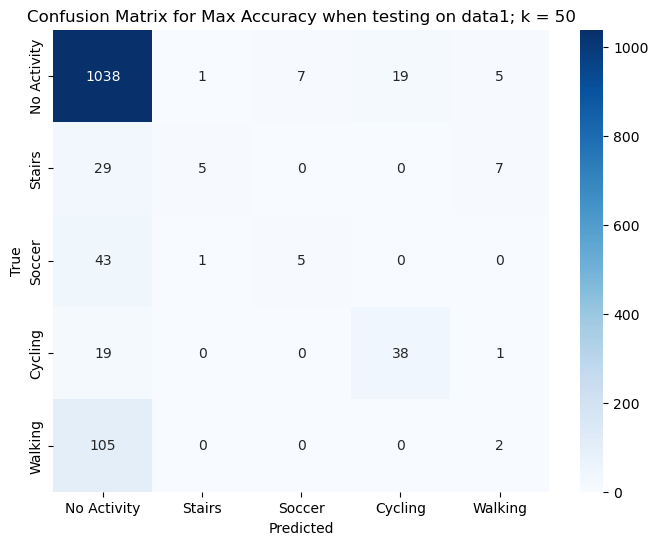

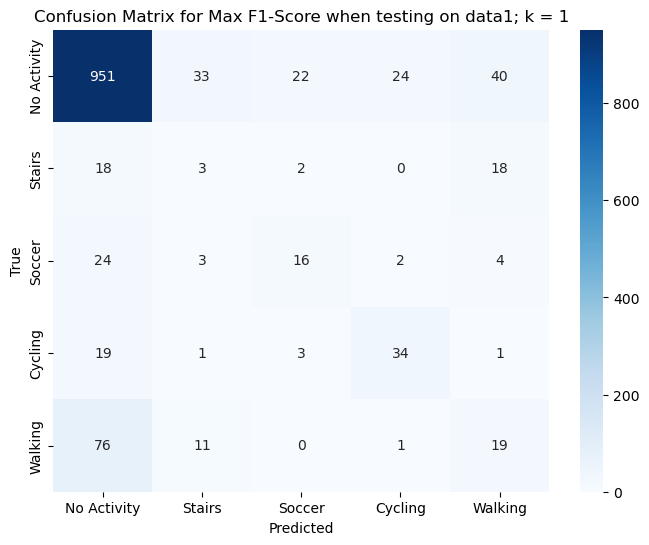

data1 has been tested on everyone


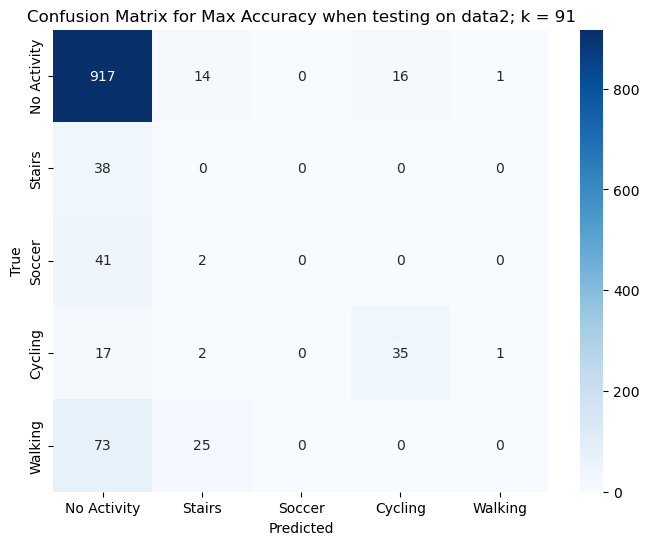

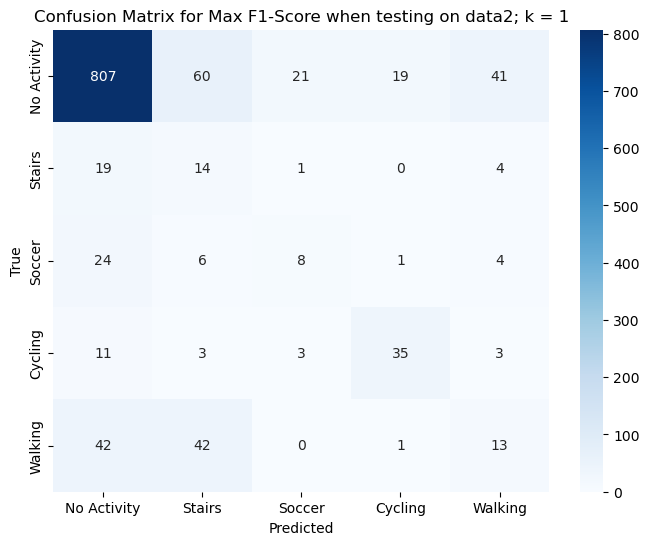

data2 has been tested on everyone


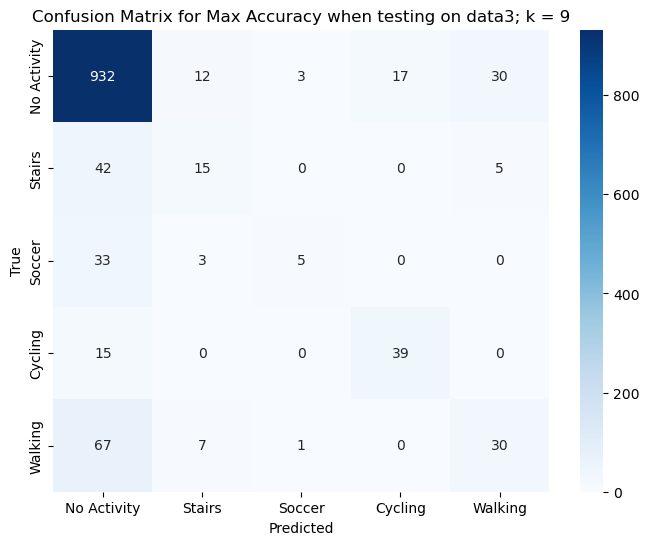

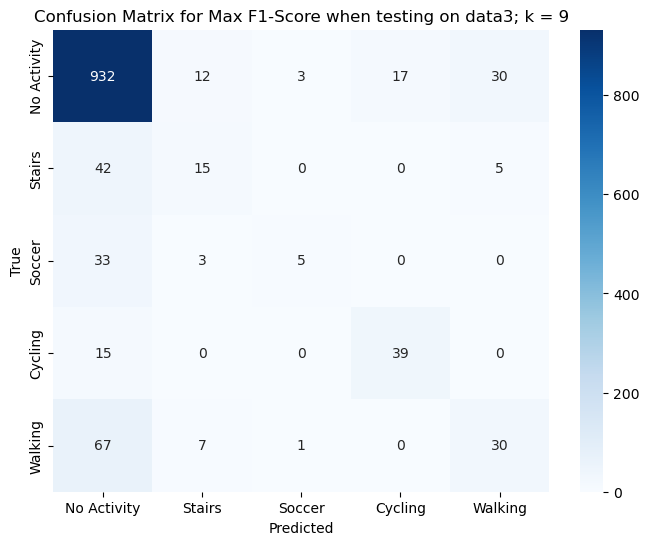

data3 has been tested on everyone


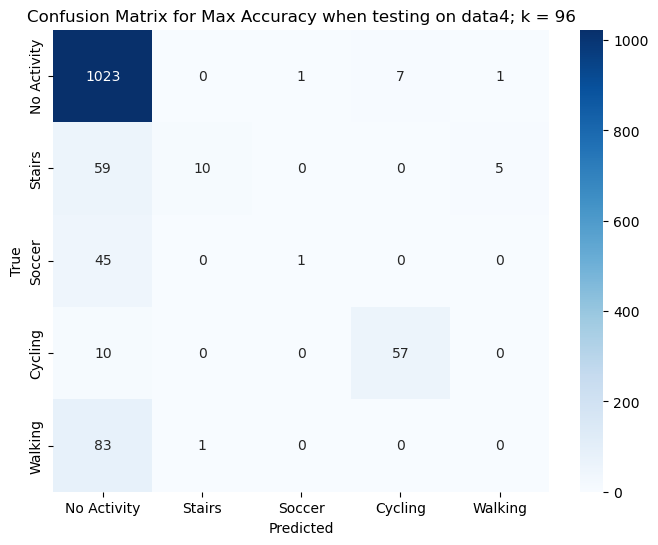

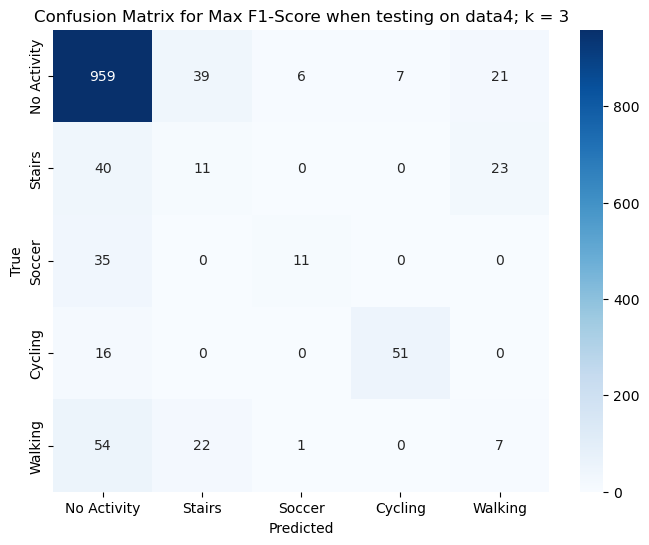

data4 has been tested on everyone


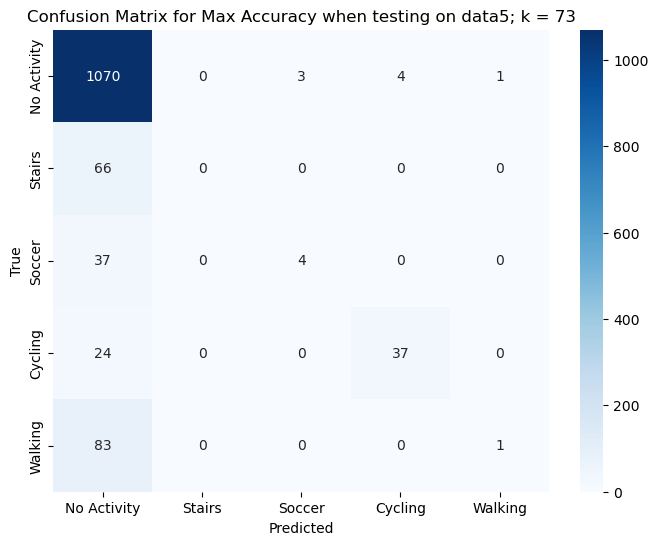

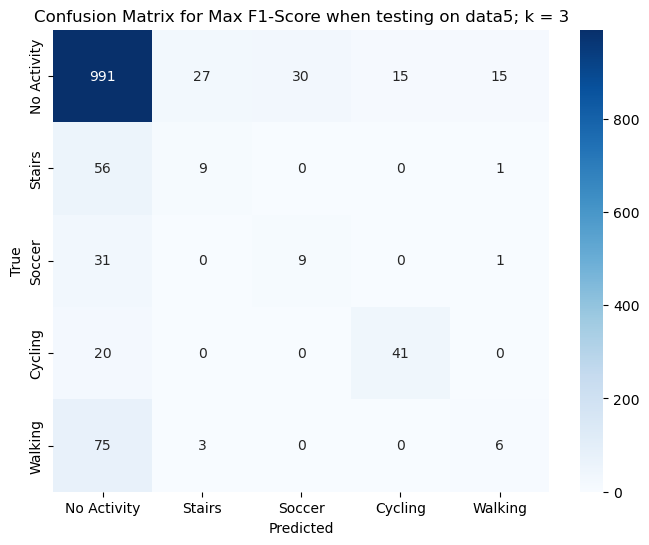

data5 has been tested on everyone


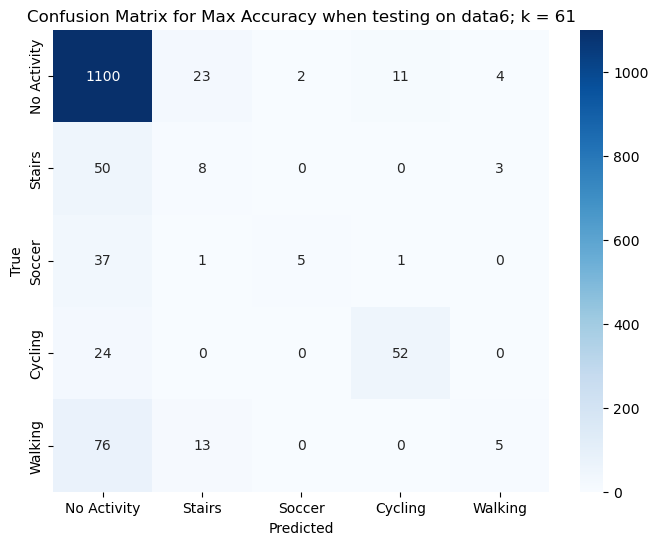

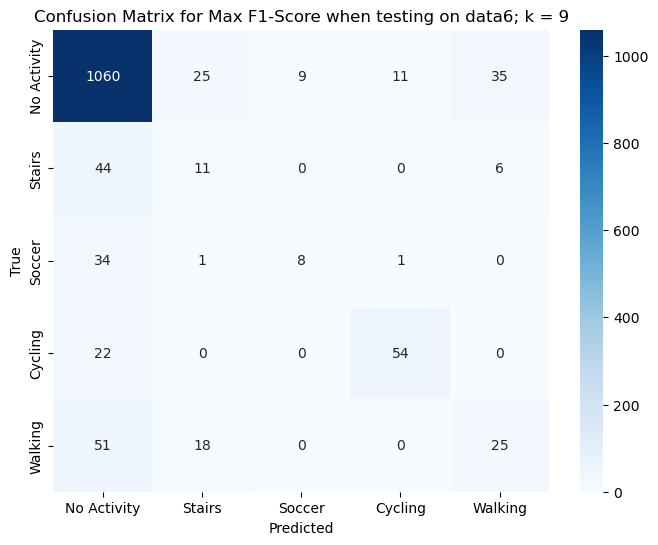

data6 has been tested on everyone


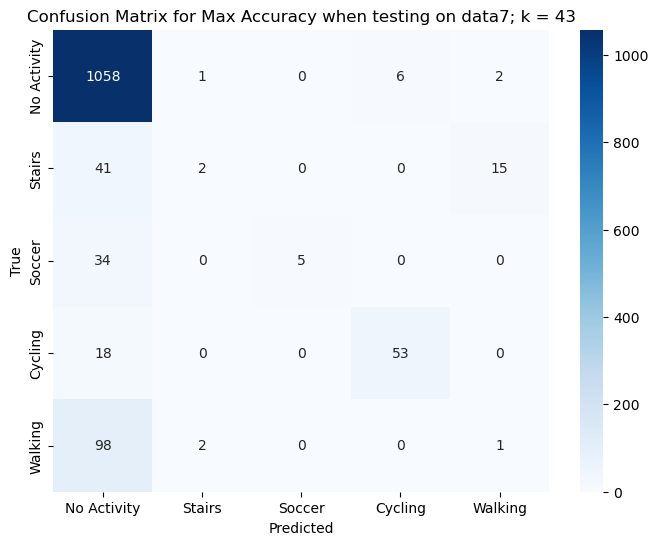

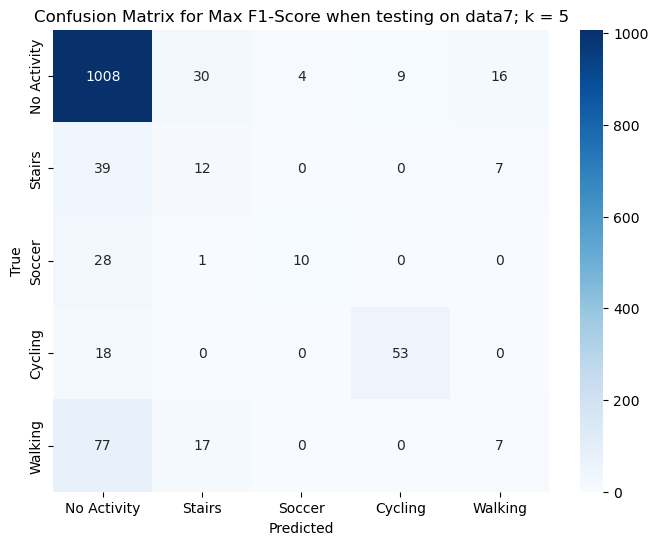

data7 has been tested on everyone


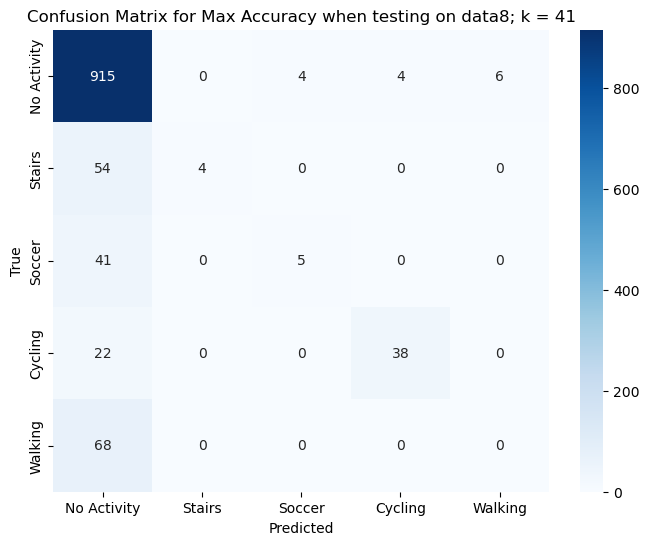

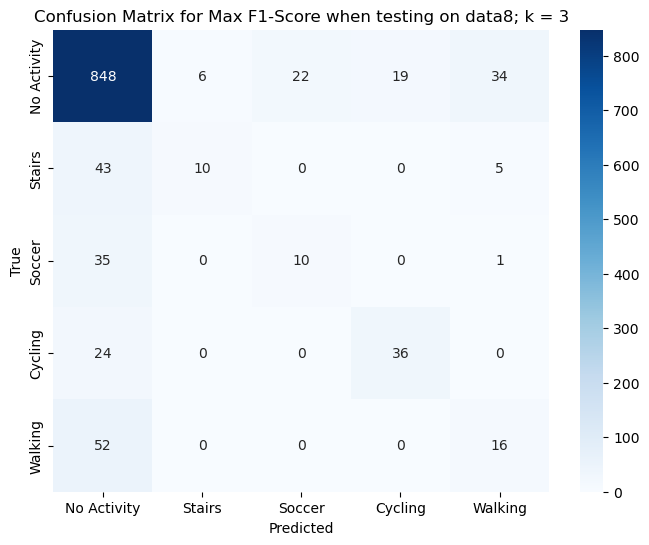

data8 has been tested on everyone


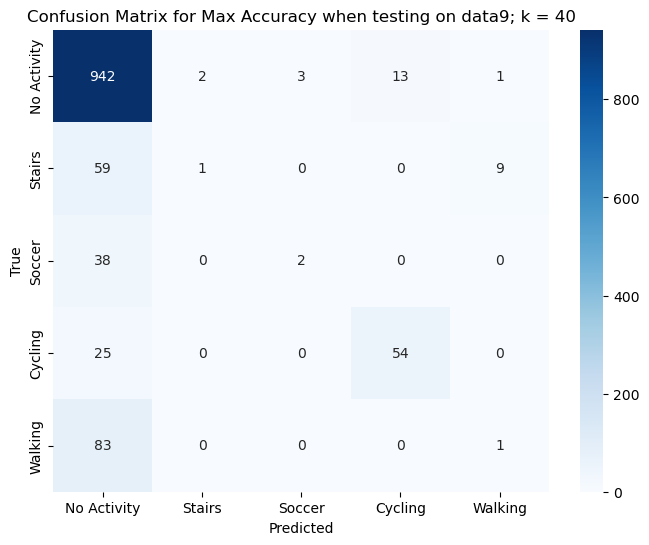

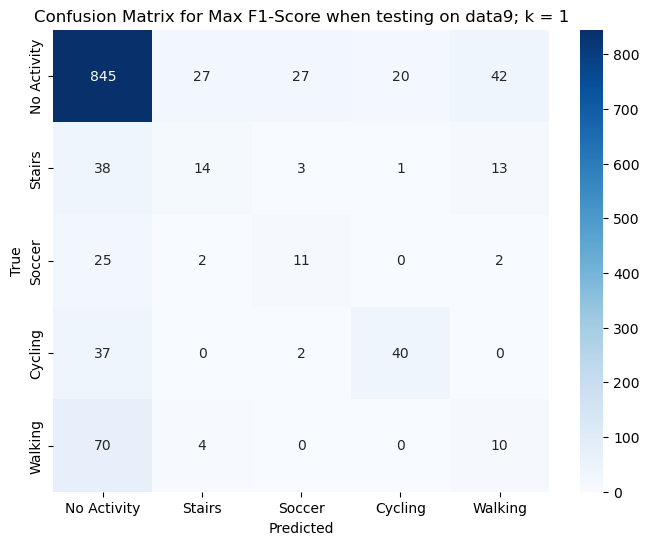

data9 has been tested on everyone


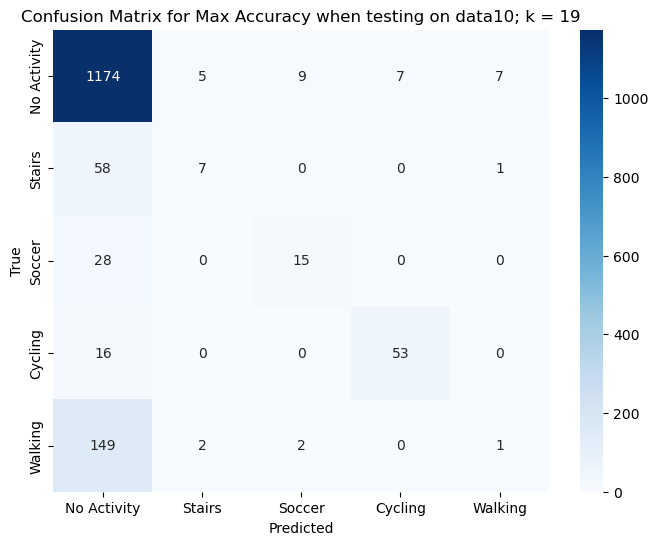

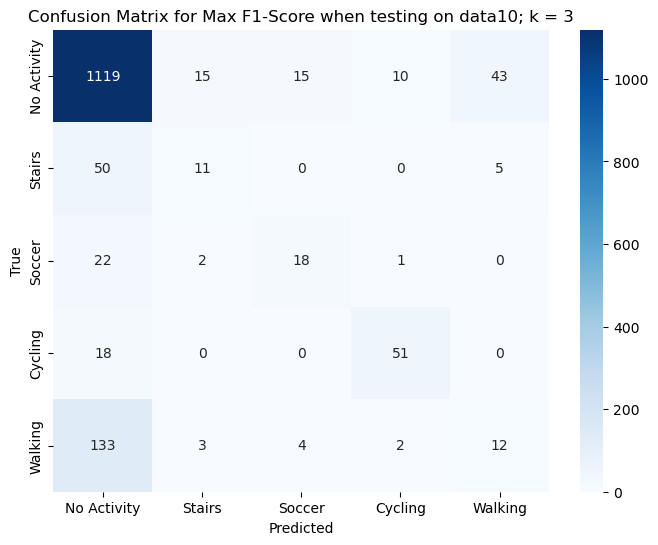

data10 has been tested on everyone


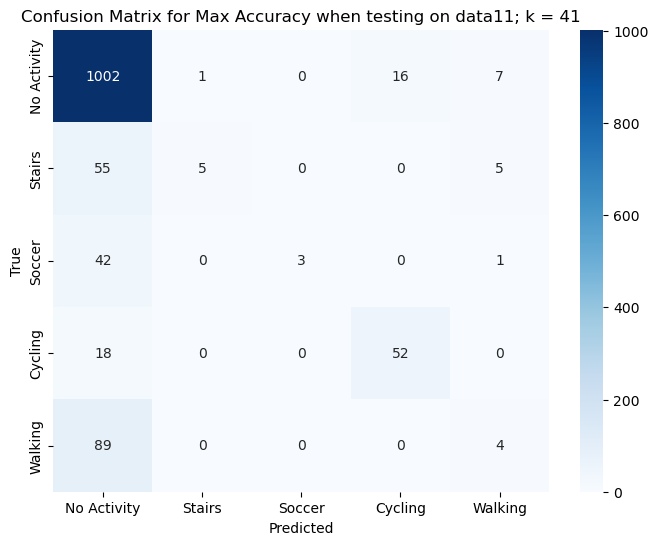

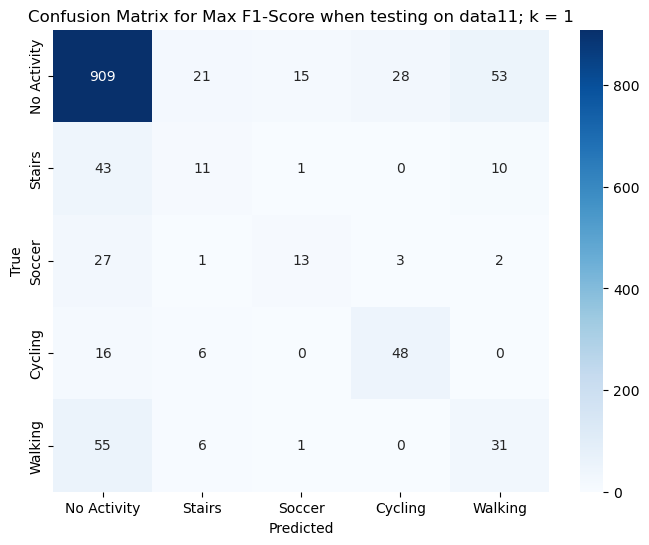

data11 has been tested on everyone


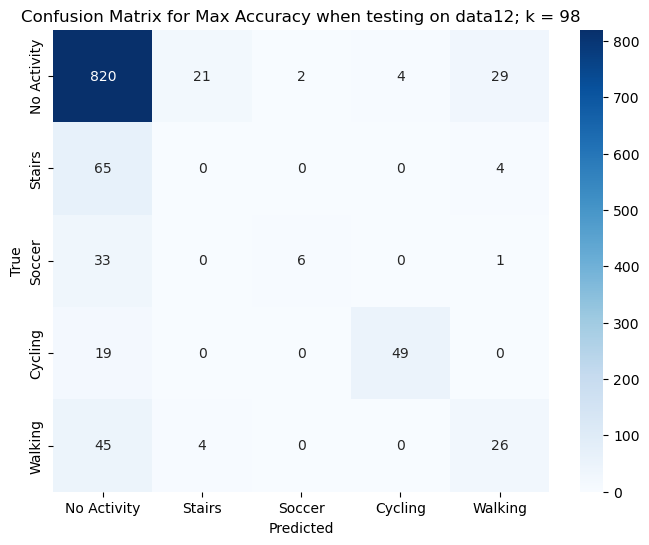

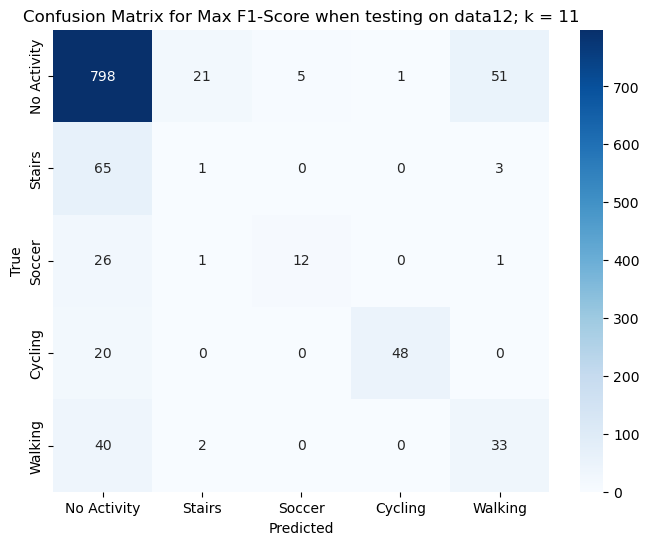

data12 has been tested on everyone


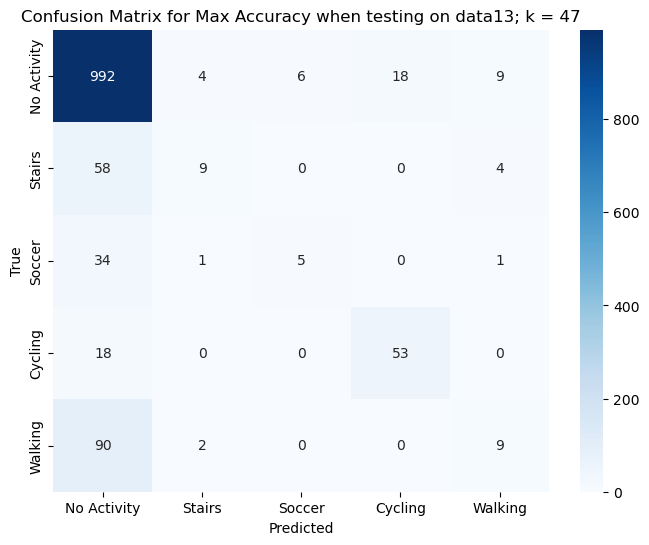

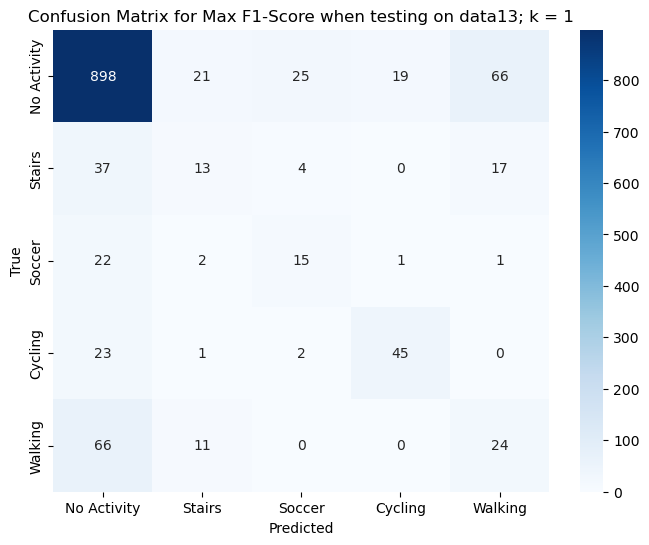

data13 has been tested on everyone


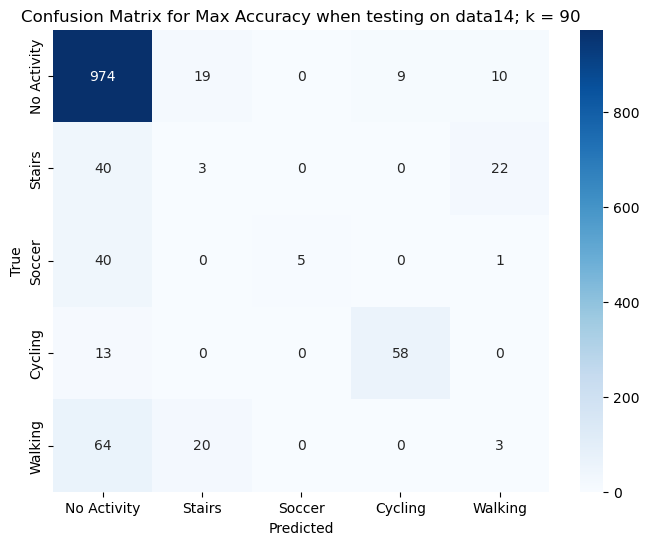

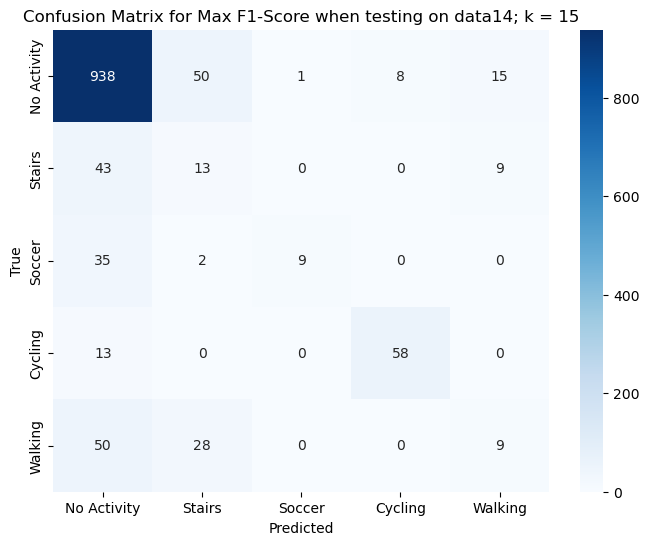

data14 has been tested on everyone


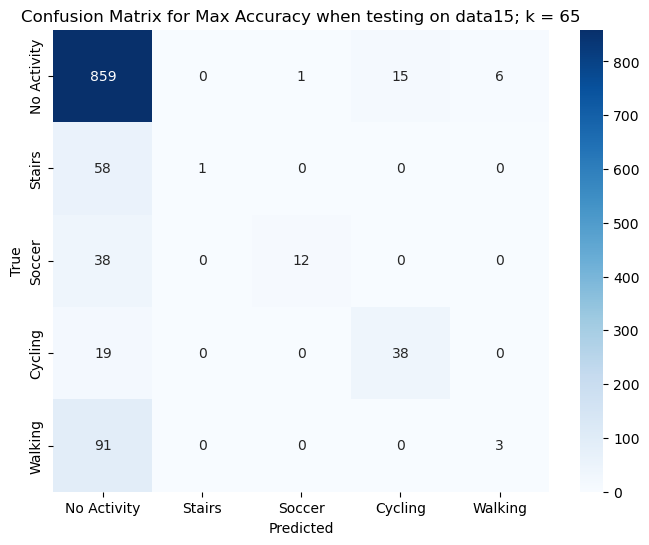

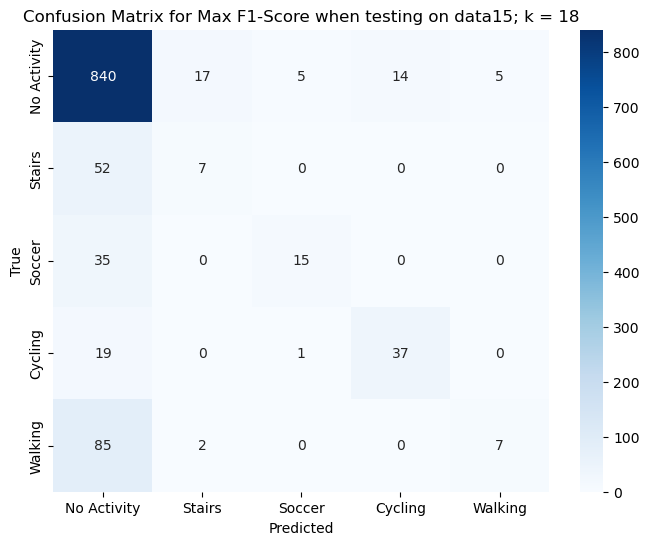

data15 has been tested on everyone


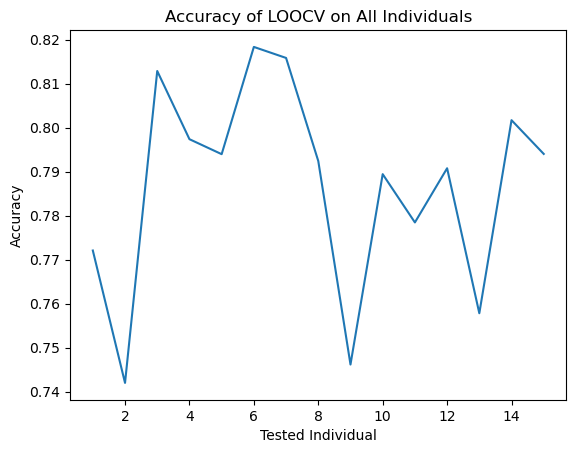

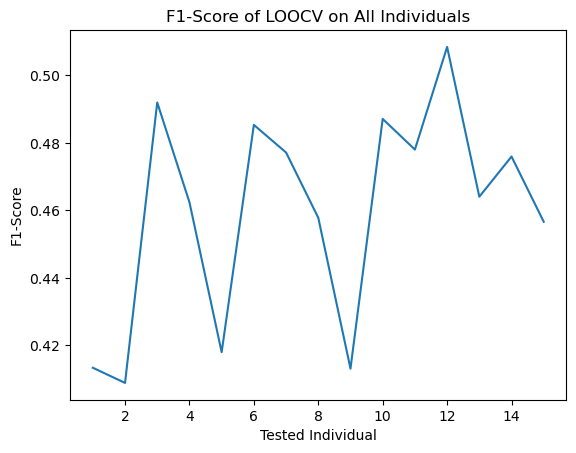

Average Accuracy:  0.7868912013287814
Average F1-Score:  0.4598918194569431


In [ ]:
## specific_windowed_features.csv
## 1: no_activity, baseline, clean_baseline, lunch, working, driving
## 2: stairs
## 3: soccer
## 4: cycling
## 5: walking

dataframes = {}
for i in range(15):
    name = f"data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data.loc[data['activity'].isin([0, 1, 2, 7, 8, 9]), 'activity'] = 1
    dataframes[name] = data

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in dataframes:
    trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)


    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(testingActivity, knn.predict(testingFeatures)))
        f1 = f1_score(testingActivity, knn.predict(testingFeatures), average='macro')
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Stairs", "Soccer", "Cycling", "Walking"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Stairs", "Soccer", "Cycling", "Walking"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, f1_score(testingActivity, y_pred, average='macro'))

    print(f"{tester} has been tested on everyone")

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average F1-Score: ", sum(LOOCVf1_score) / len(LOOCVf1_score))


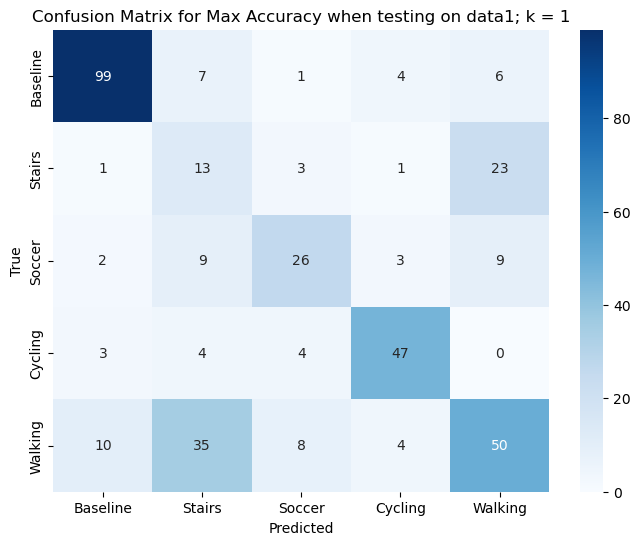

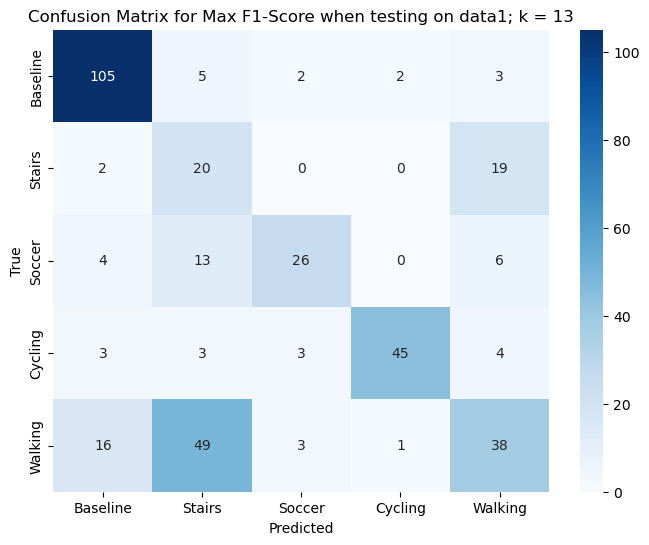

data1 has been tested on everyone


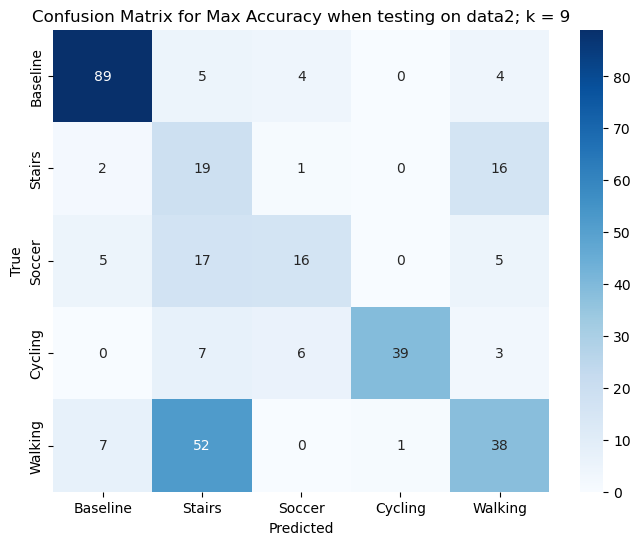

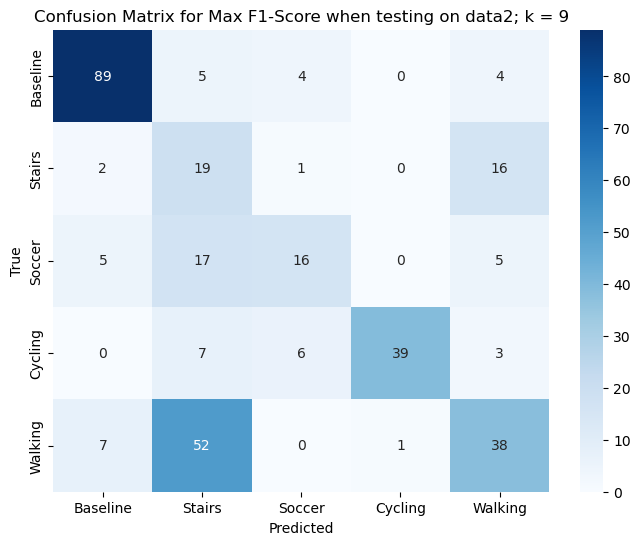

data2 has been tested on everyone


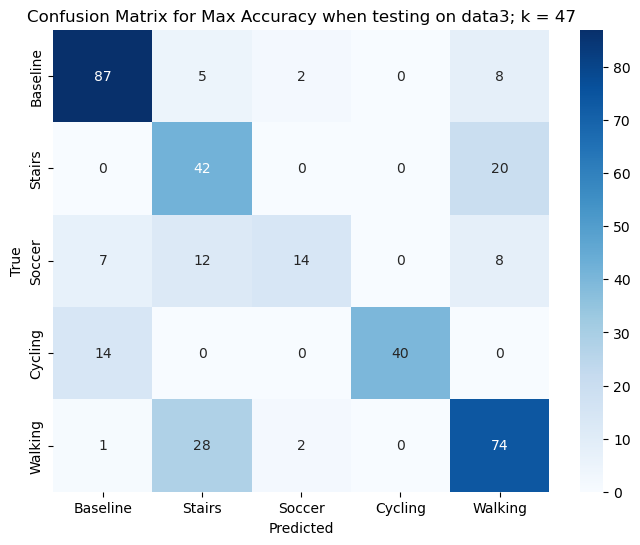

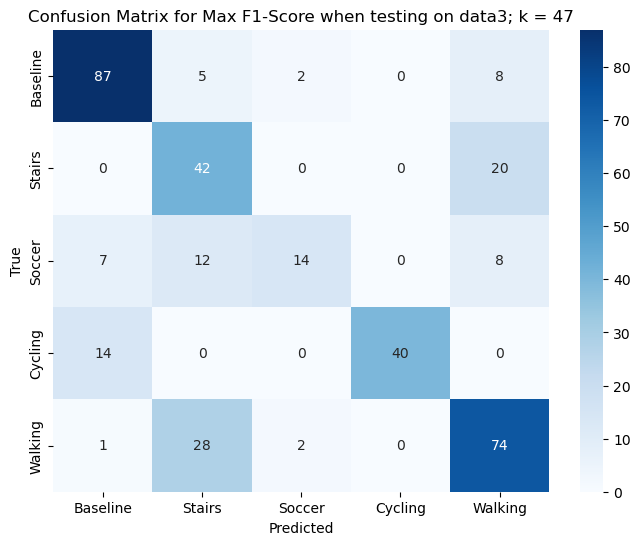

data3 has been tested on everyone


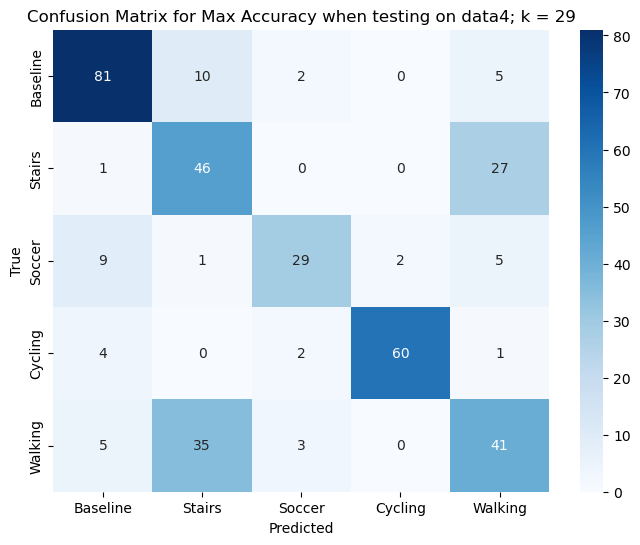

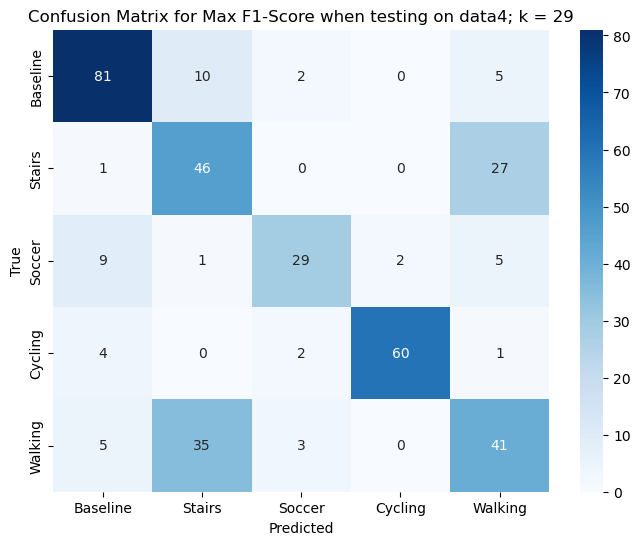

data4 has been tested on everyone


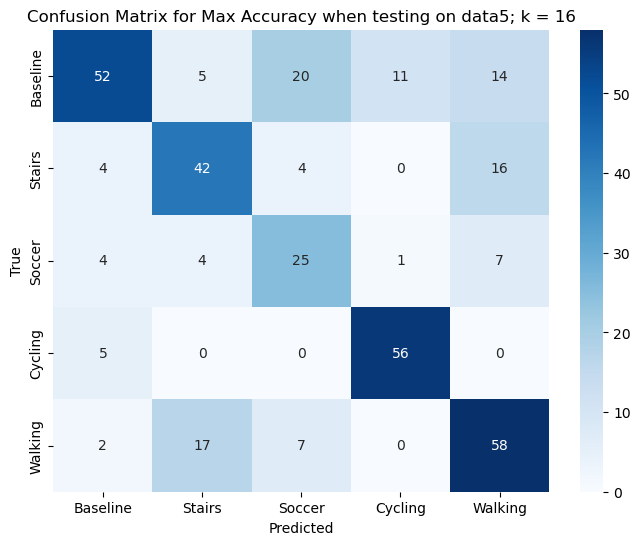

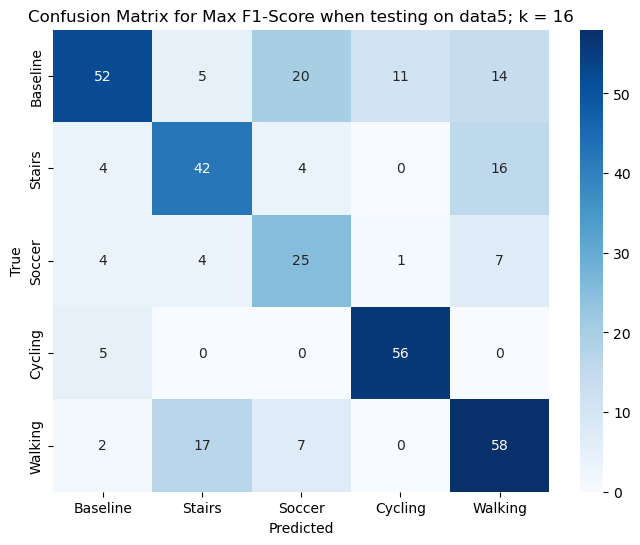

data5 has been tested on everyone


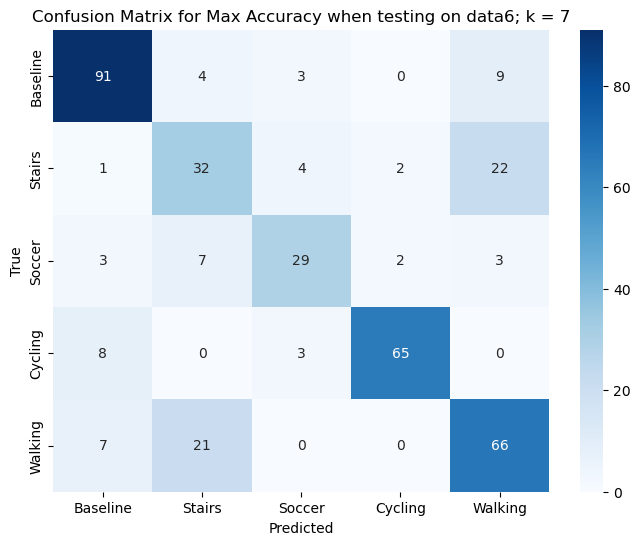

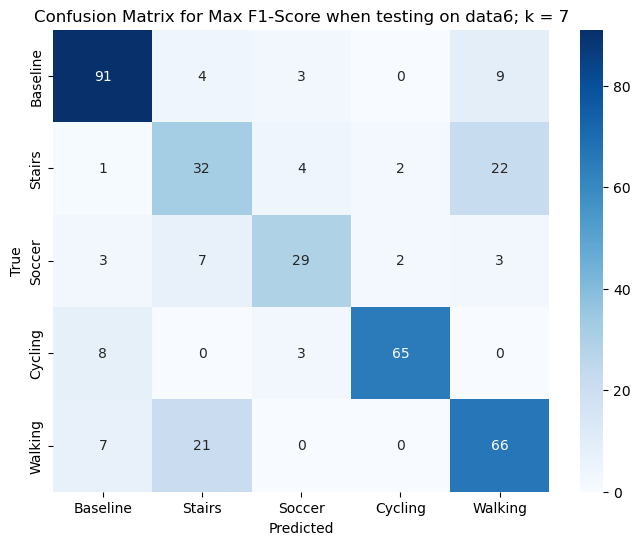

data6 has been tested on everyone


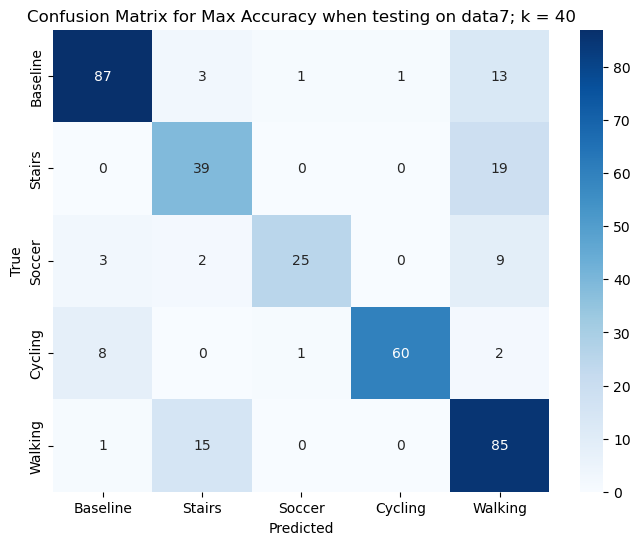

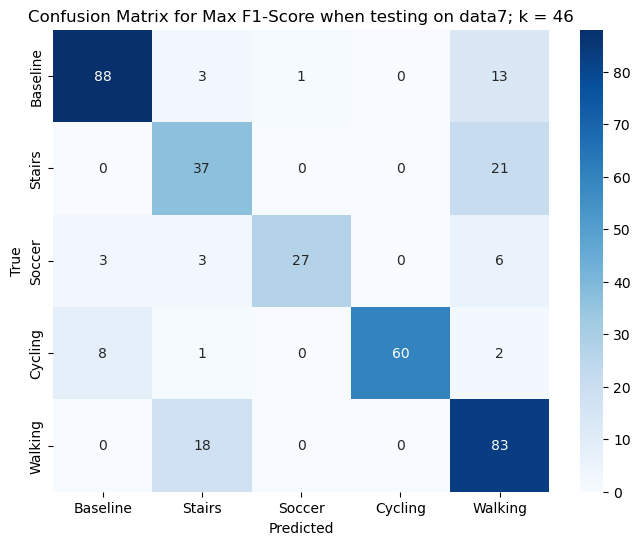

data7 has been tested on everyone


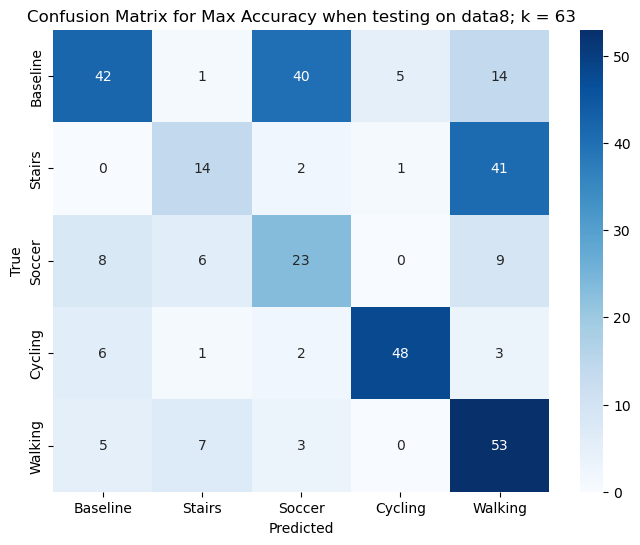

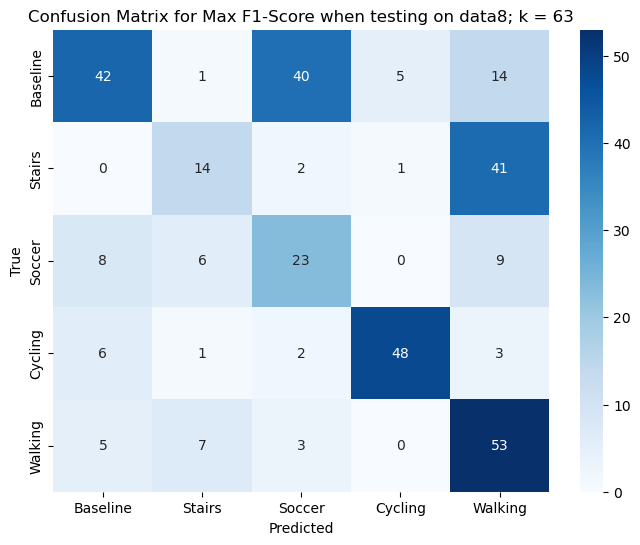

data8 has been tested on everyone


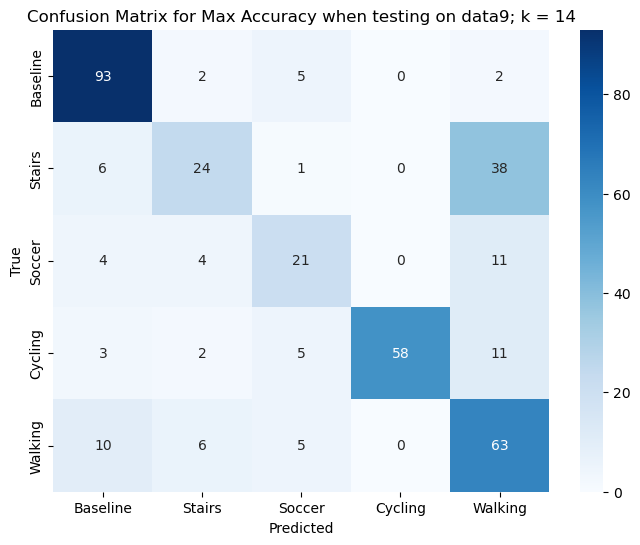

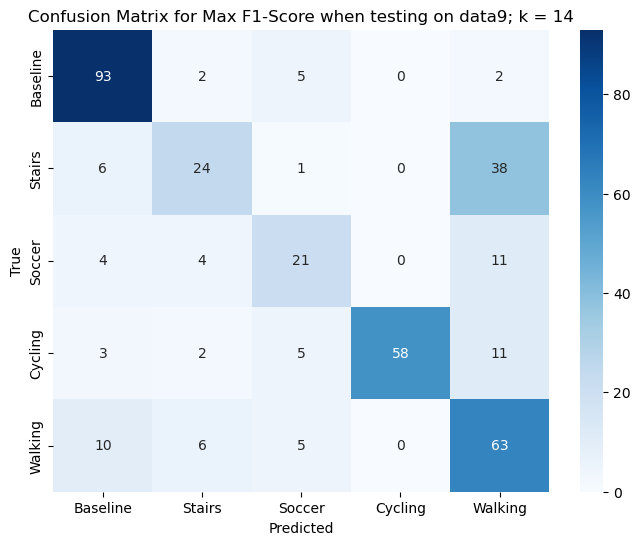

data9 has been tested on everyone


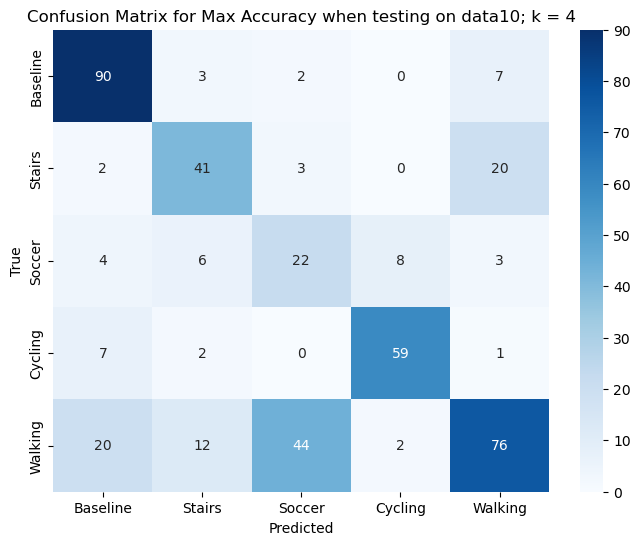

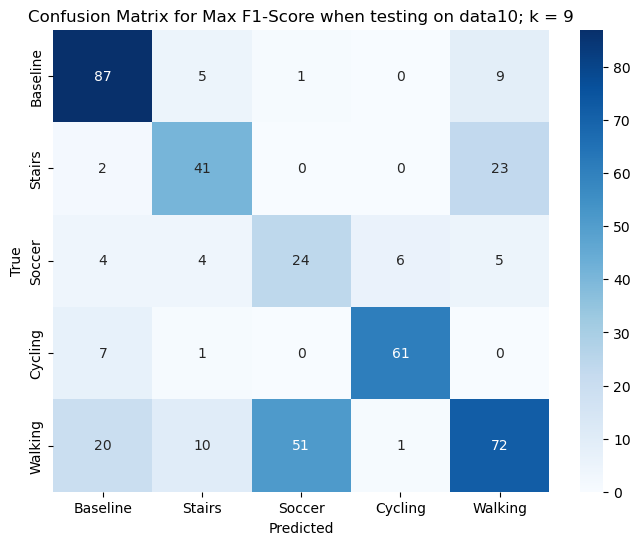

data10 has been tested on everyone


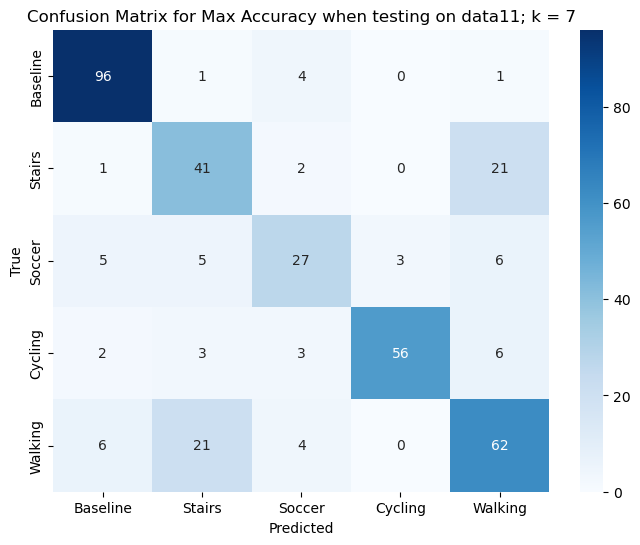

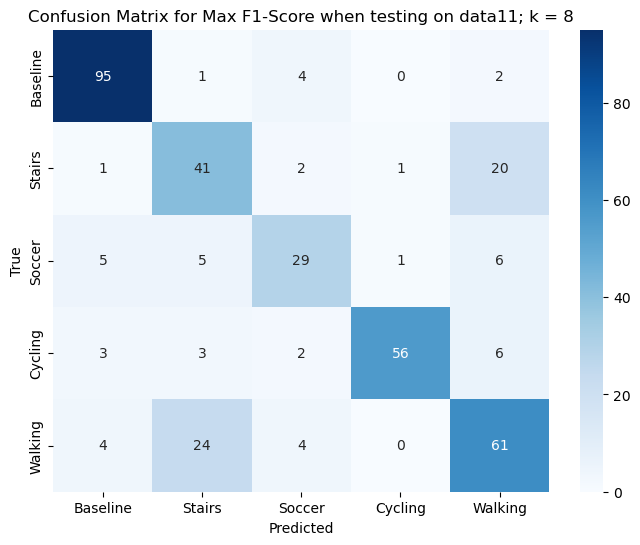

data11 has been tested on everyone


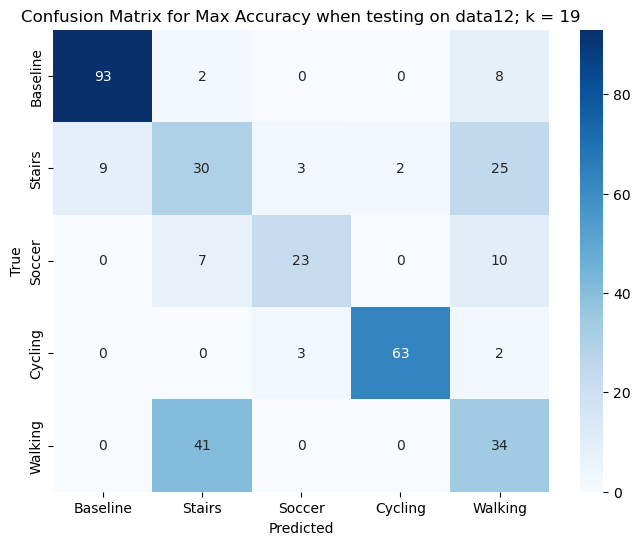

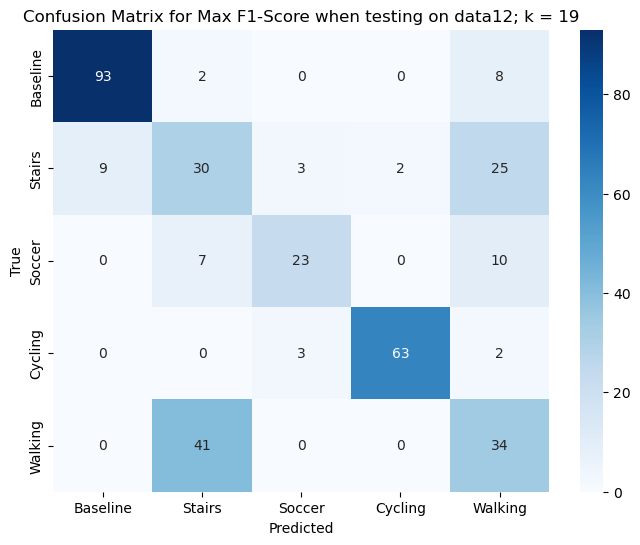

data12 has been tested on everyone


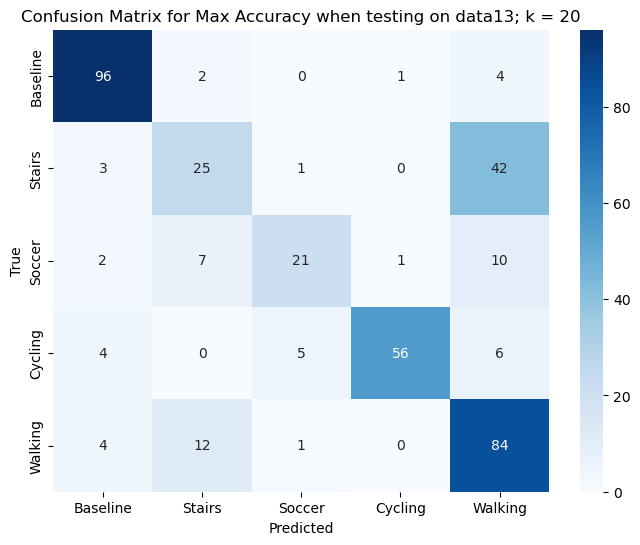

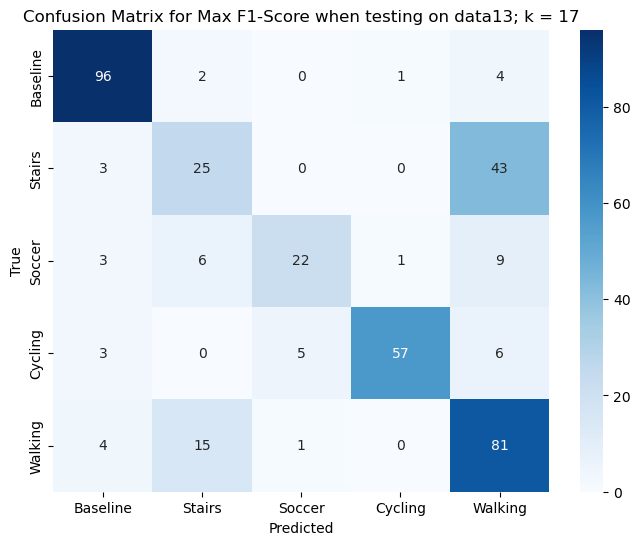

data13 has been tested on everyone


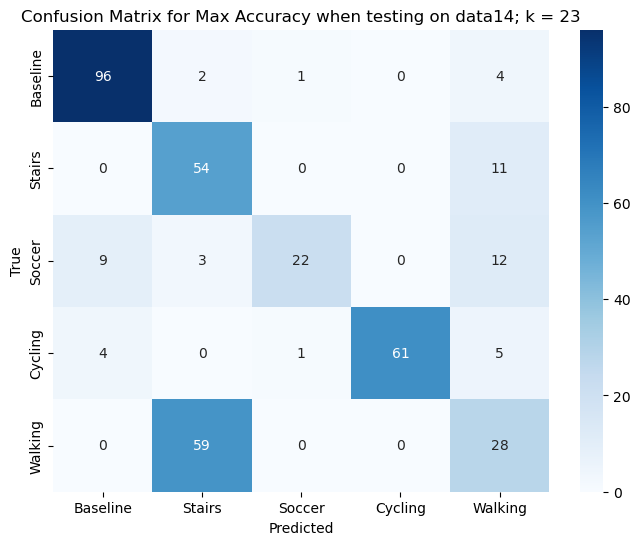

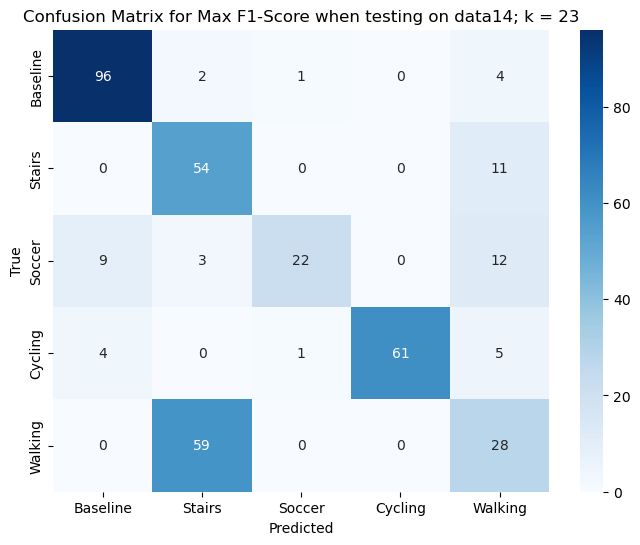

data14 has been tested on everyone


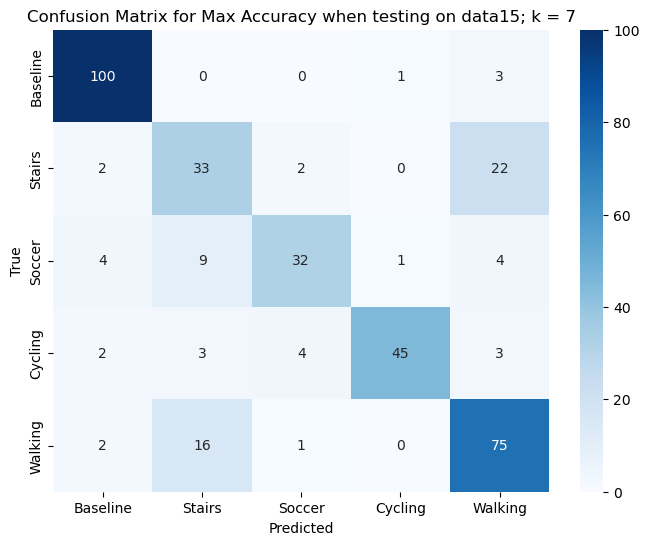

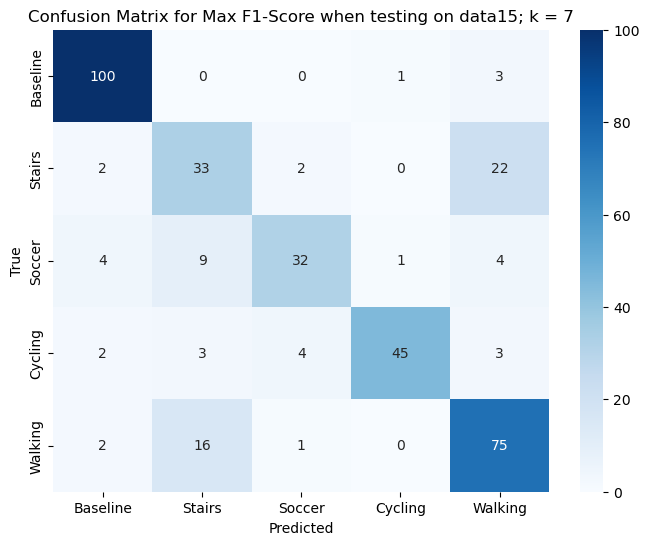

data15 has been tested on everyone


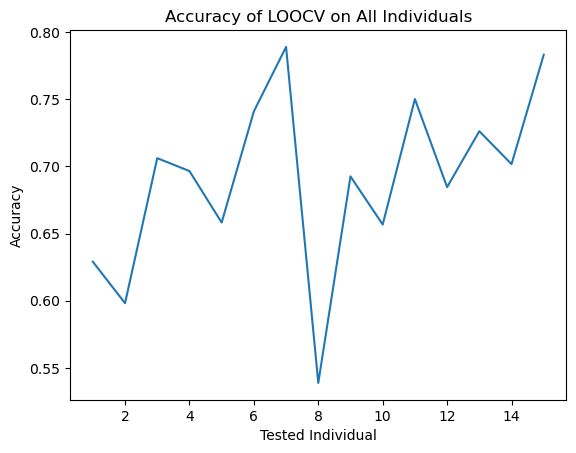

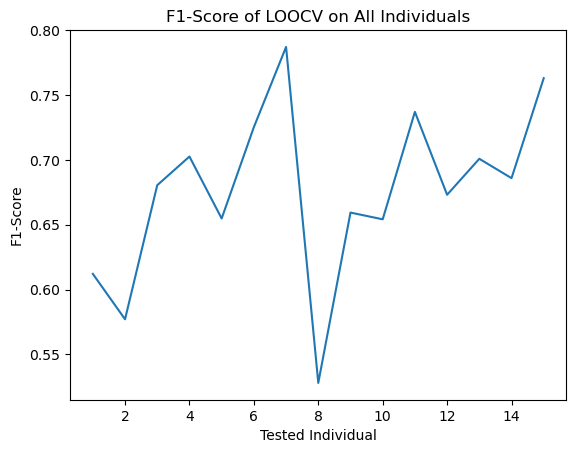

Average Accuracy:  0.690058001785472
Average F1-Score:  0.6760680030774986


In [ ]:
## specific_windowed_features.csv
## 1: baseline, clean_baseline
## 2: stairs
## 3: soccer
## 4: cycling
## 5: walking

dataframes = {}
for i in range(15):
    name = f"data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([0, 7, 8, 9])]7
    data.loc[data['activity'].isin([2]), 'activity'] = 1
    dataframes[name] = data

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in dataframes:
    trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)


    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(testingActivity, knn.predict(testingFeatures)))
        f1 = f1_score(testingActivity, knn.predict(testingFeatures), average='macro')
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Baseline", "Stairs", "Soccer", "Cycling", "Walking"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Baseline", "Stairs", "Soccer", "Cycling", "Walking"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, f1_score(testingActivity, y_pred, average='macro'))

    print(f"{tester} has been tested on everyone")

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average F1-Score: ", sum(LOOCVf1_score) / len(LOOCVf1_score))


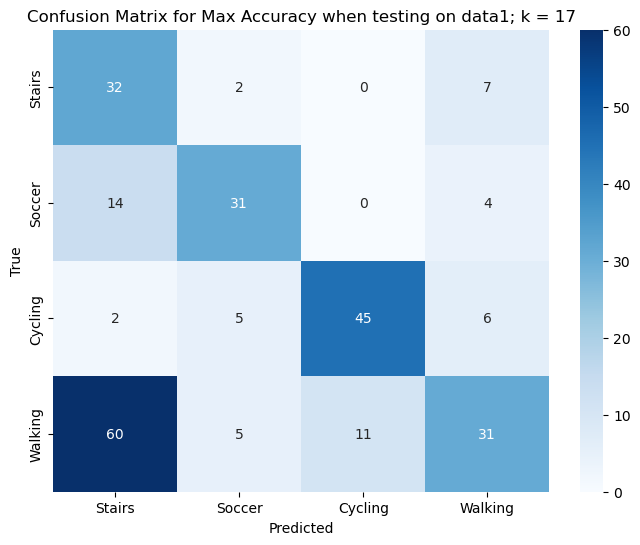

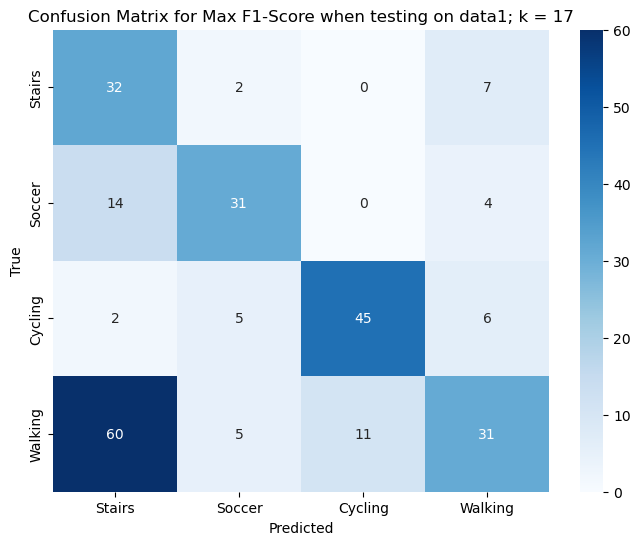

data1 has been tested on everyone


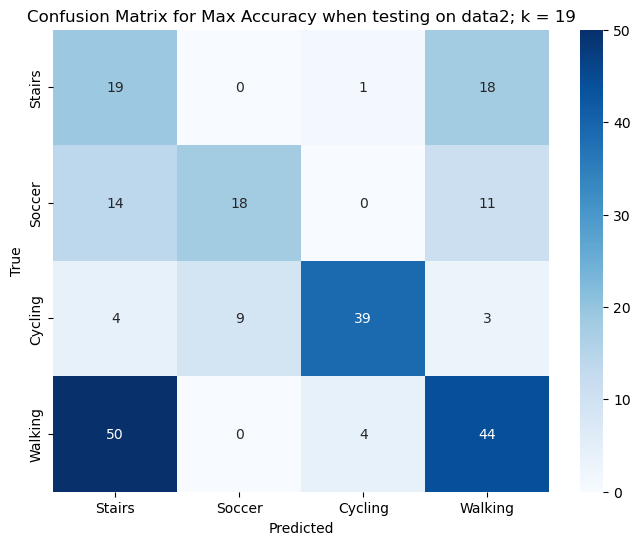

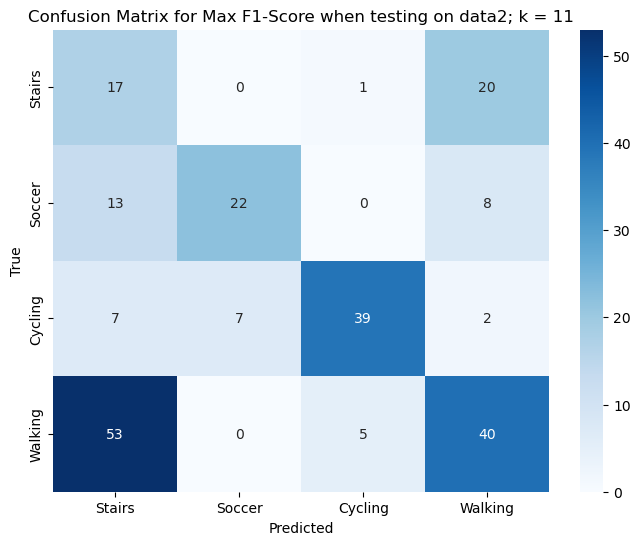

data2 has been tested on everyone


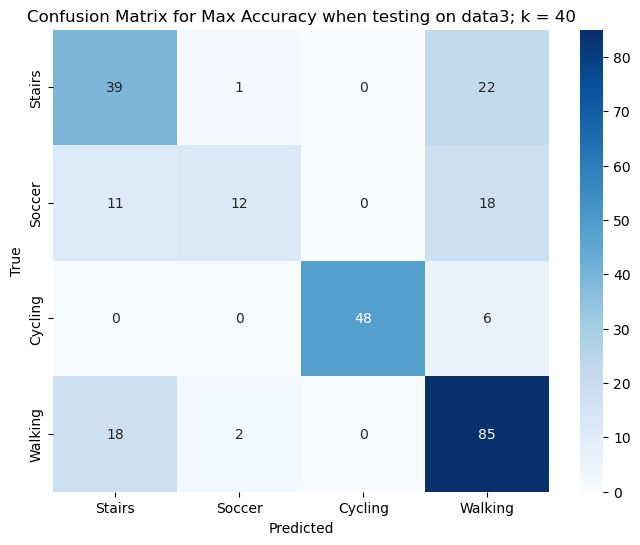

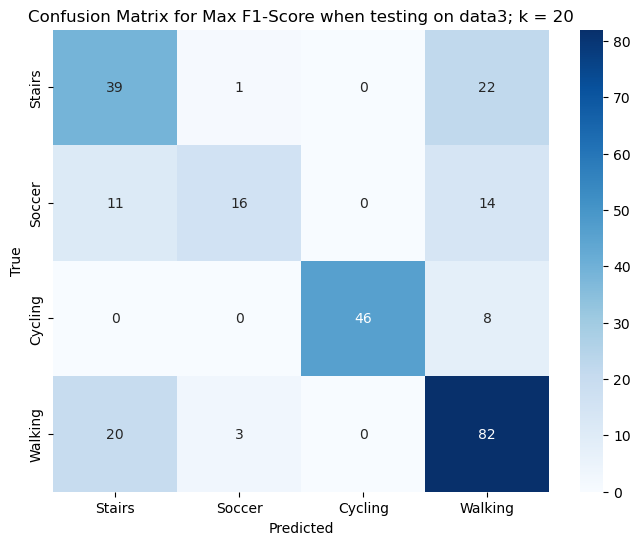

data3 has been tested on everyone


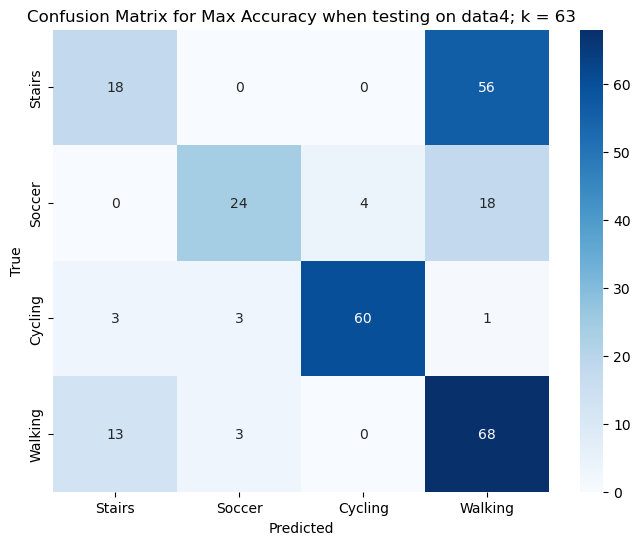

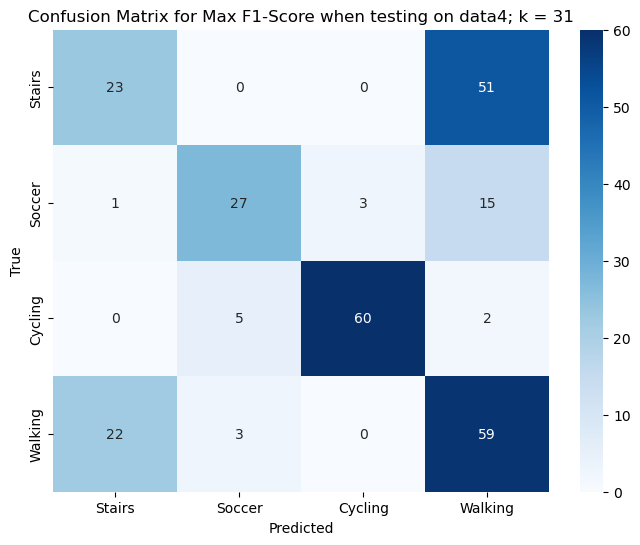

data4 has been tested on everyone


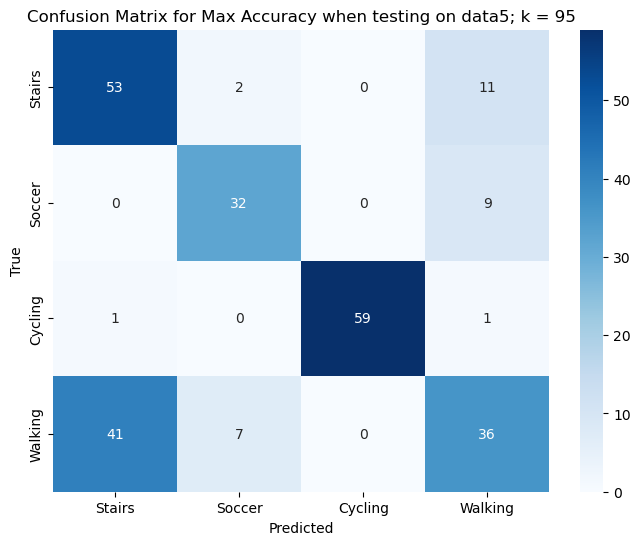

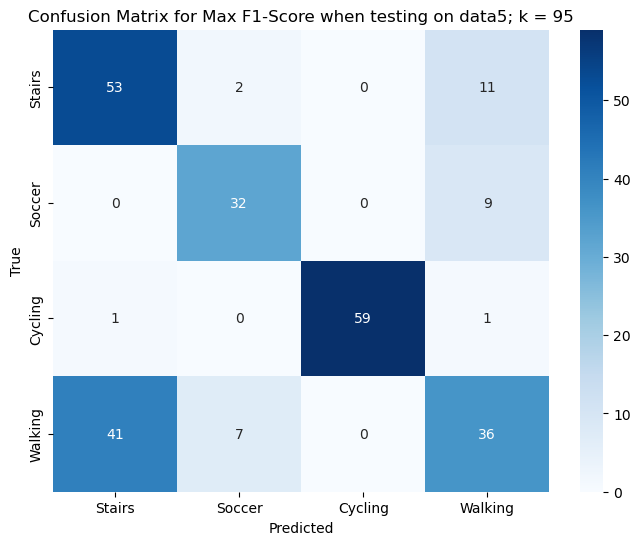

data5 has been tested on everyone


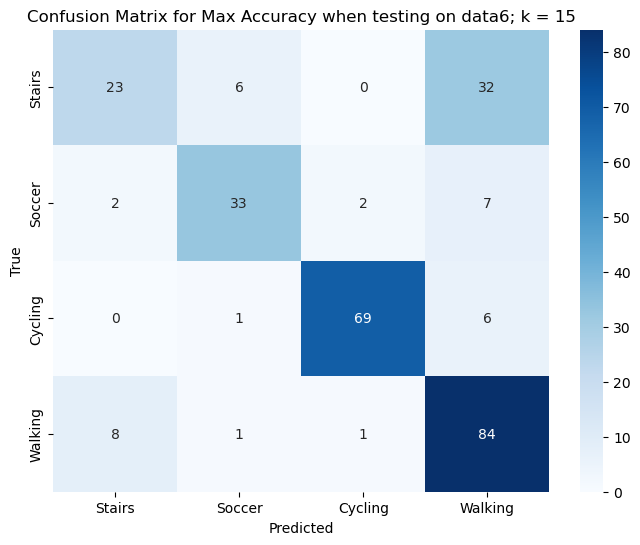

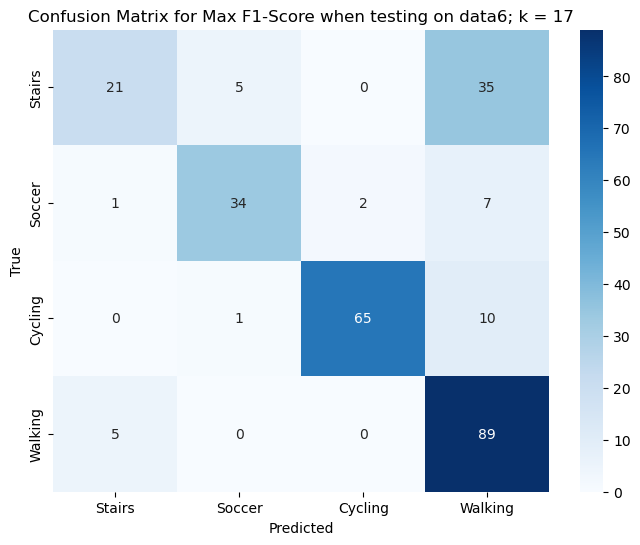

data6 has been tested on everyone


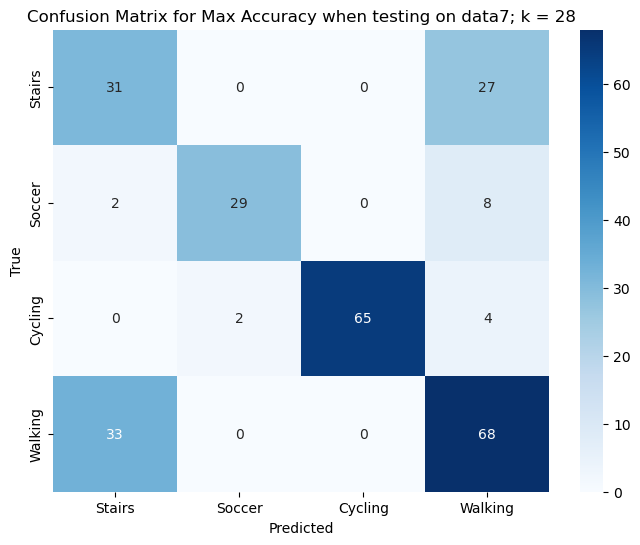

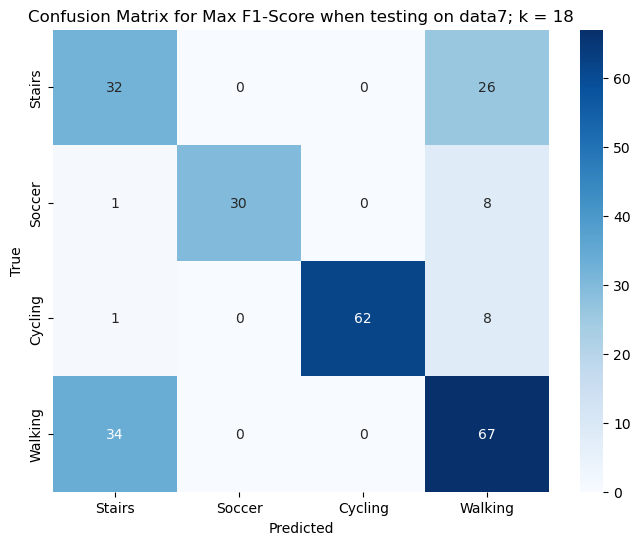

data7 has been tested on everyone


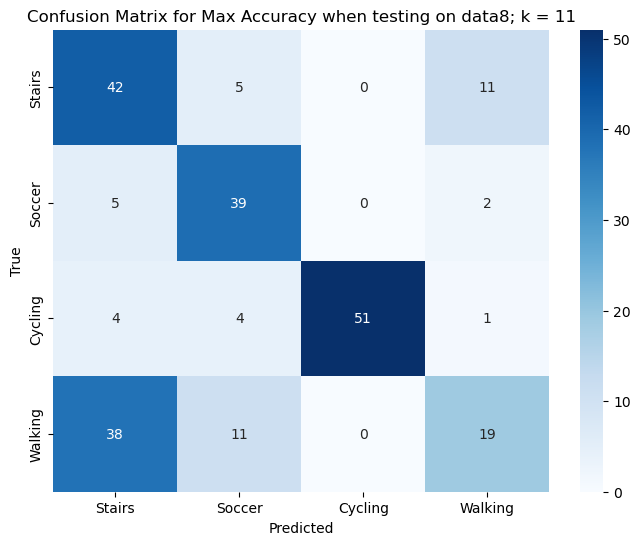

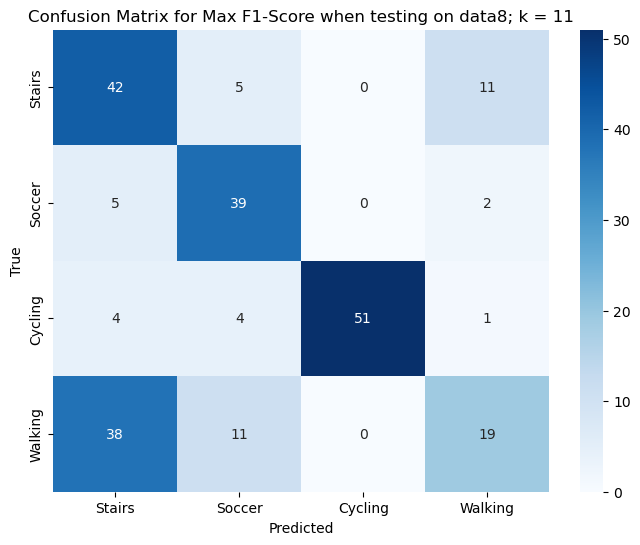

data8 has been tested on everyone


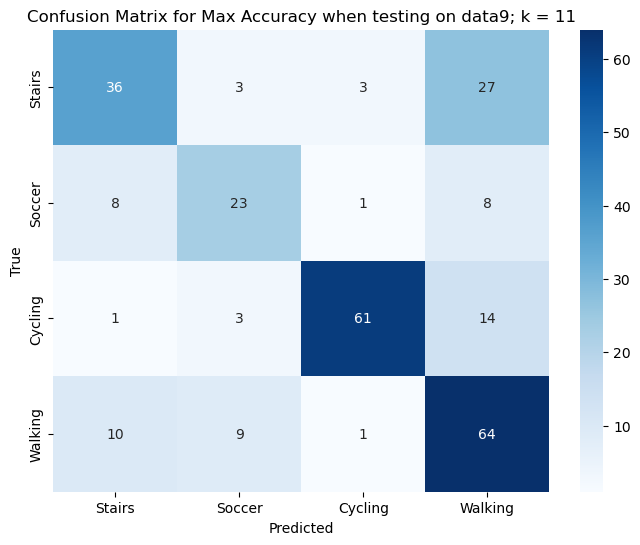

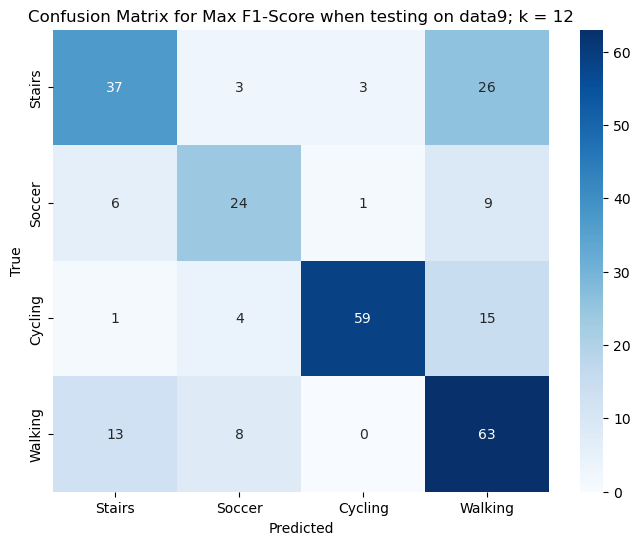

data9 has been tested on everyone


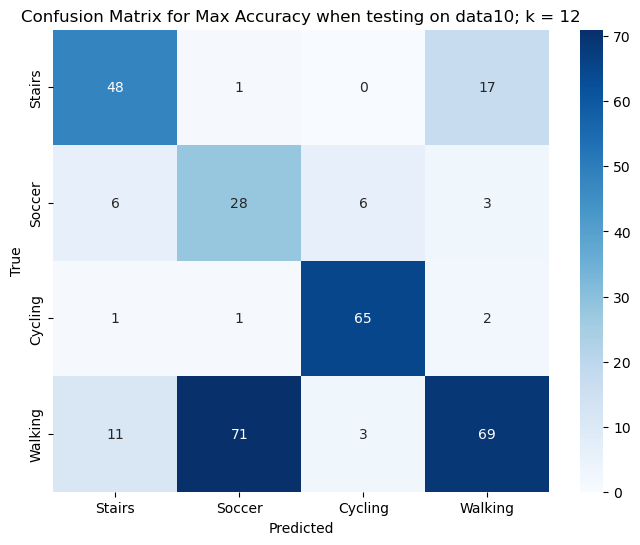

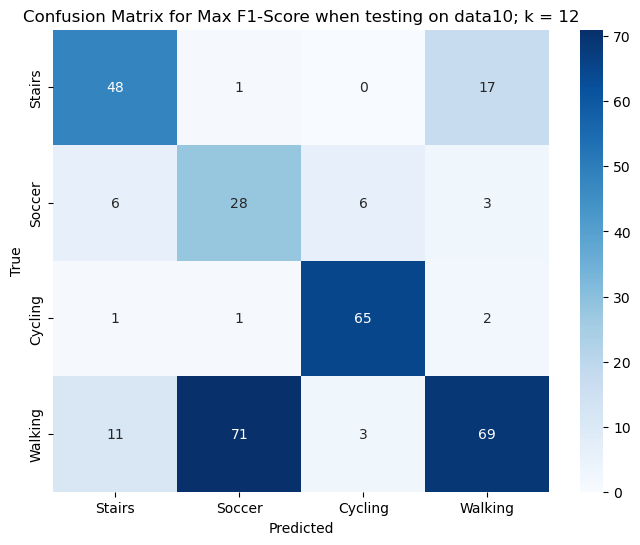

data10 has been tested on everyone


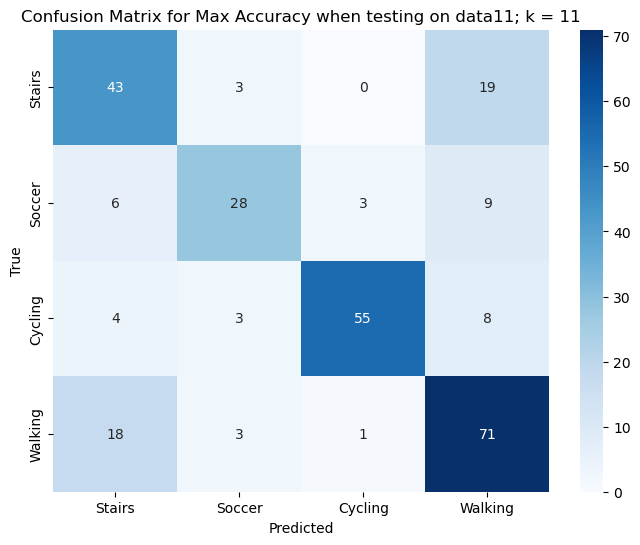

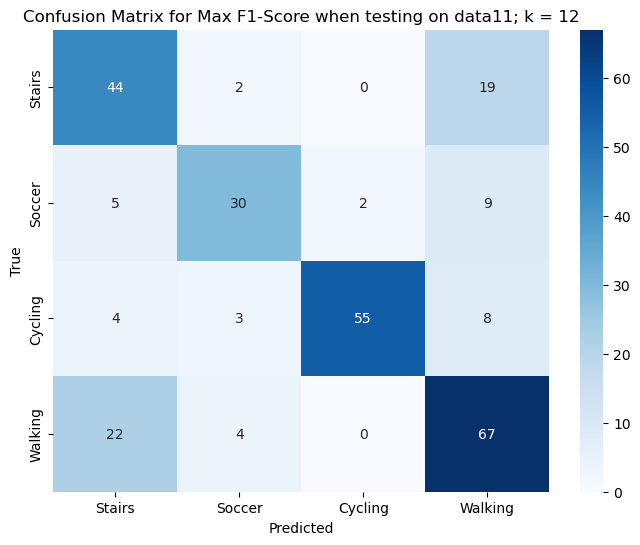

data11 has been tested on everyone


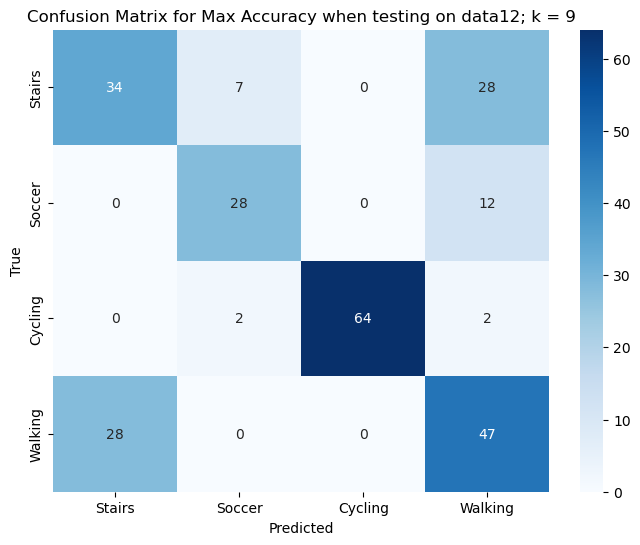

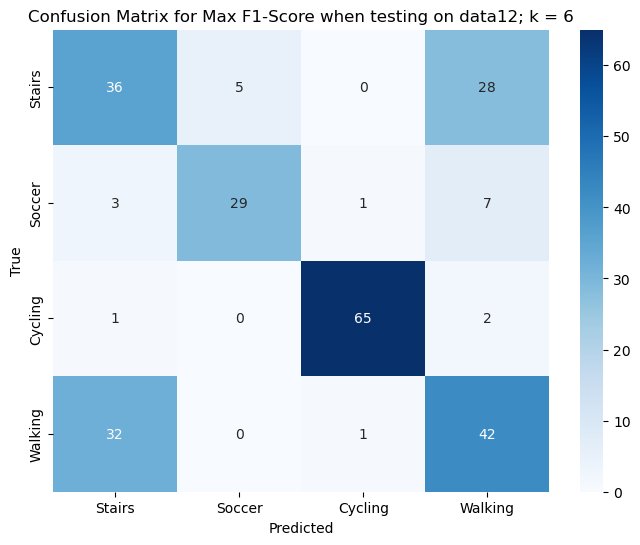

data12 has been tested on everyone


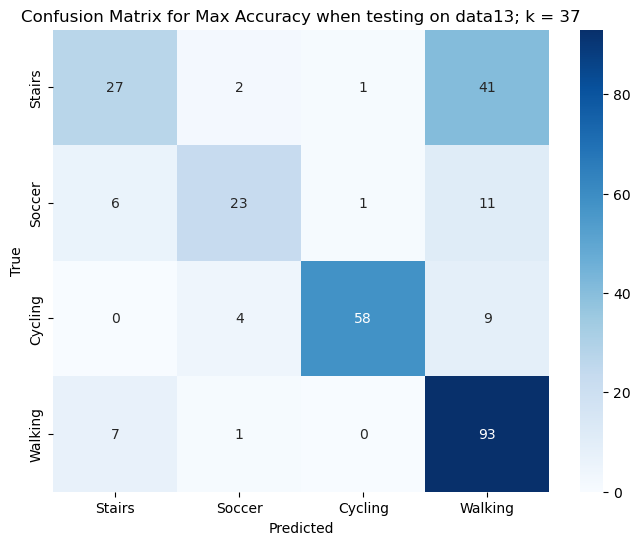

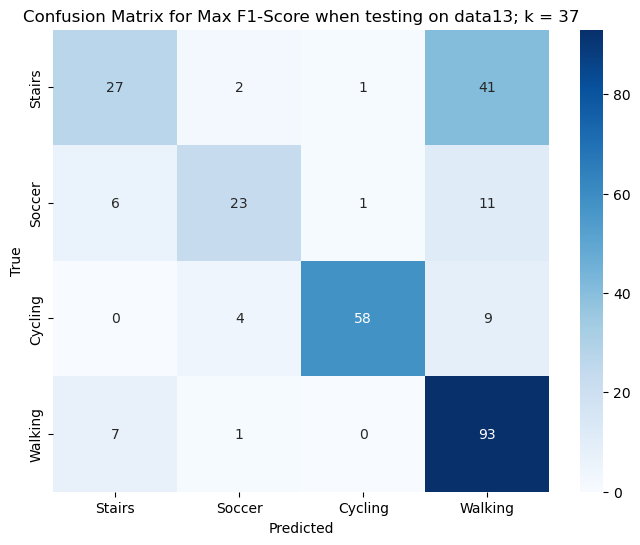

data13 has been tested on everyone


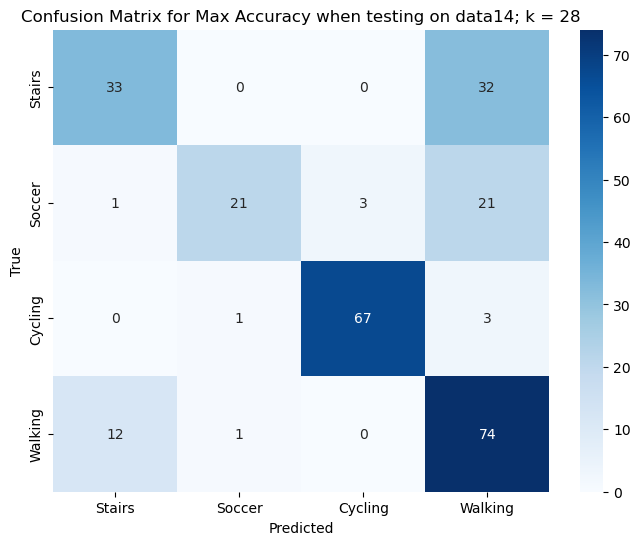

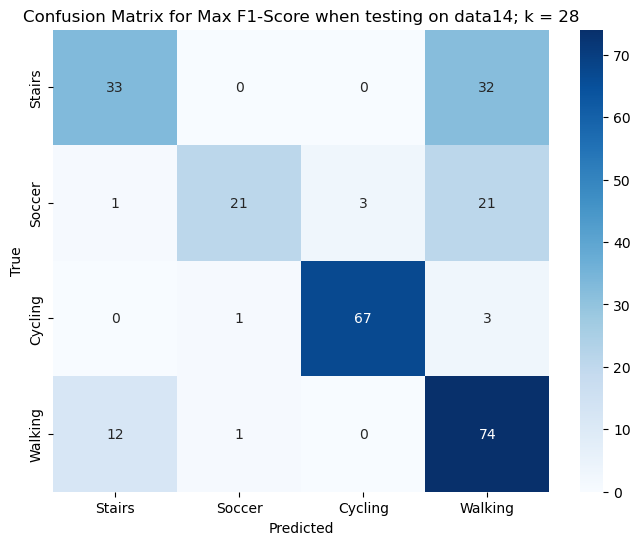

data14 has been tested on everyone


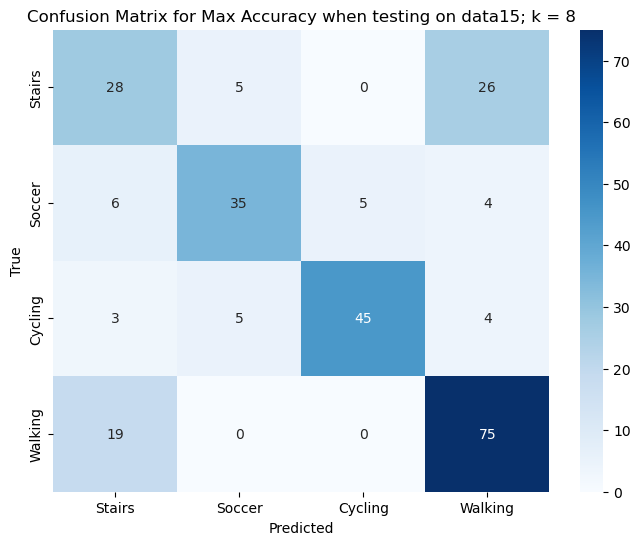

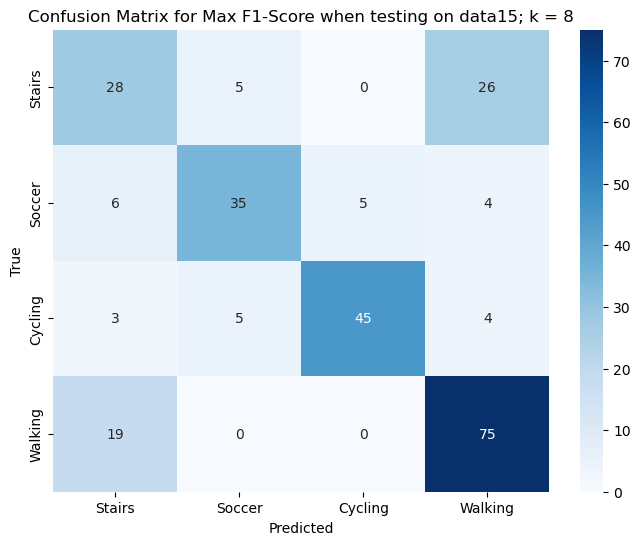

data15 has been tested on everyone


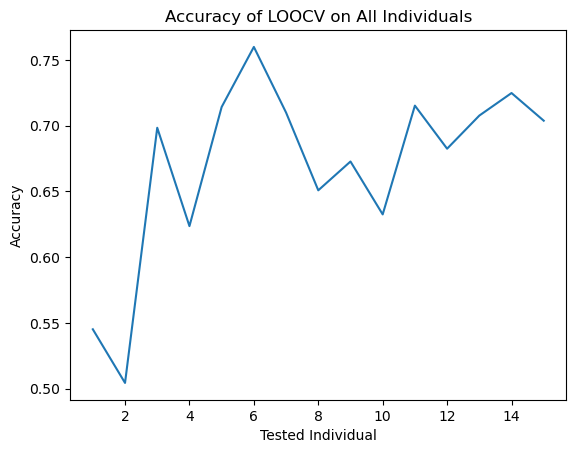

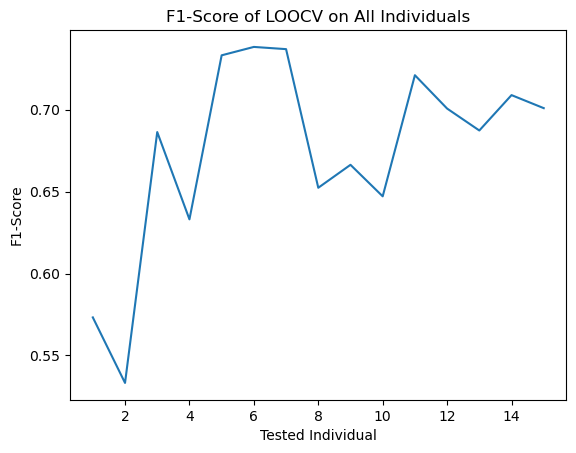

Average Accuracy:  0.6697558735870063
Average F1-Score:  0.6746176722923299


In [ ]:

## 2: stairs
## 3: soccer
## 4: cycling
## 5: walking

dataframes = {}
for i in range(15):
    name = f"data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([0, 1, 2, 7, 8, 9])]
    dataframes[name] = data

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in dataframes:
    trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)


    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(testingActivity, knn.predict(testingFeatures)))
        f1 = f1_score(testingActivity, knn.predict(testingFeatures), average='macro')
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Stairs", "Soccer", "Cycling", "Walking"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Stairs", "Soccer", "Cycling", "Walking"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, f1_score(testingActivity, y_pred, average='macro'))

    print(f"{tester} has been tested on everyone")

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average F1-Score: ", sum(LOOCVf1_score) / len(LOOCVf1_score))


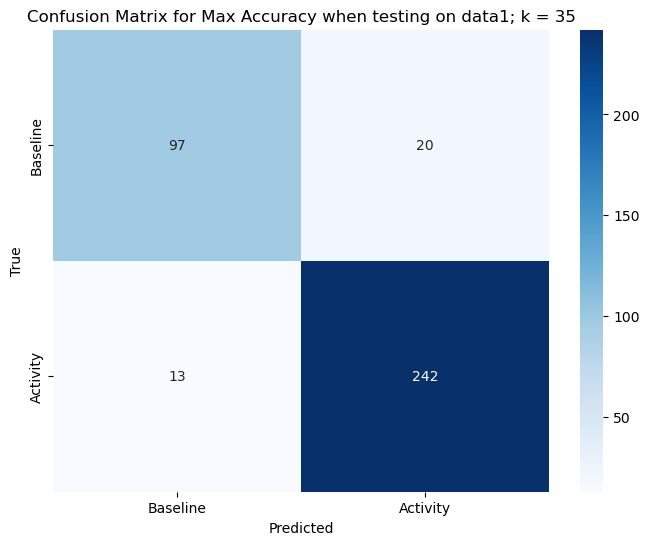

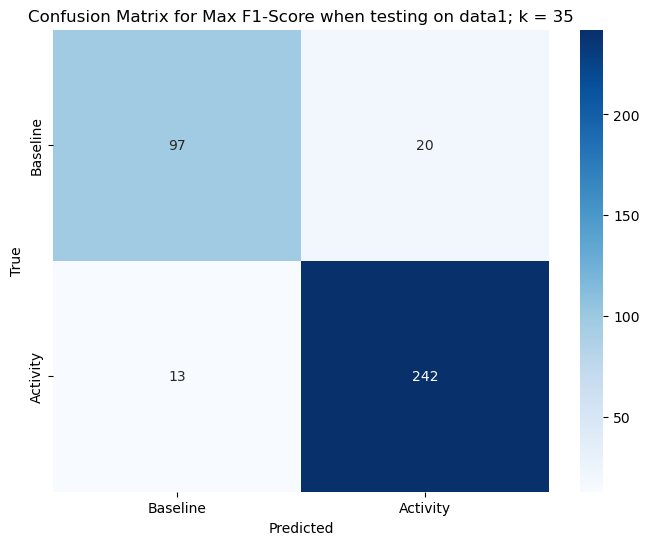

data1 has been tested on everyone


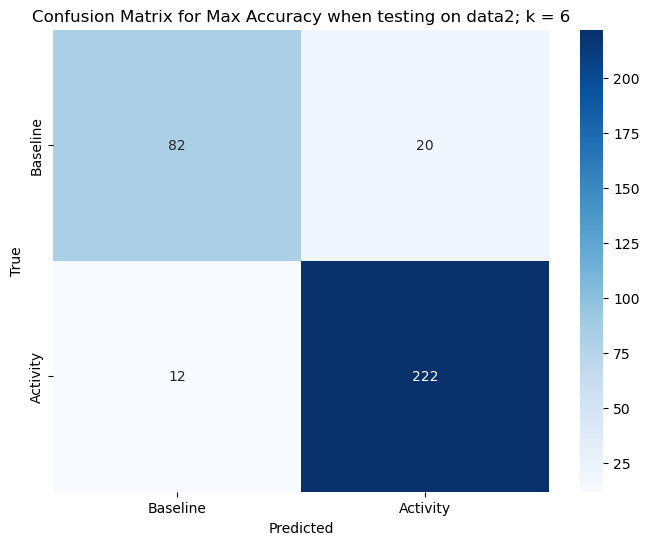

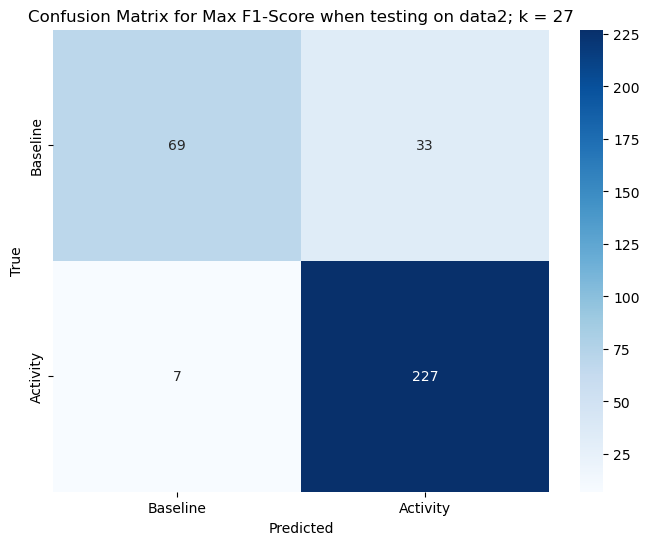

data2 has been tested on everyone


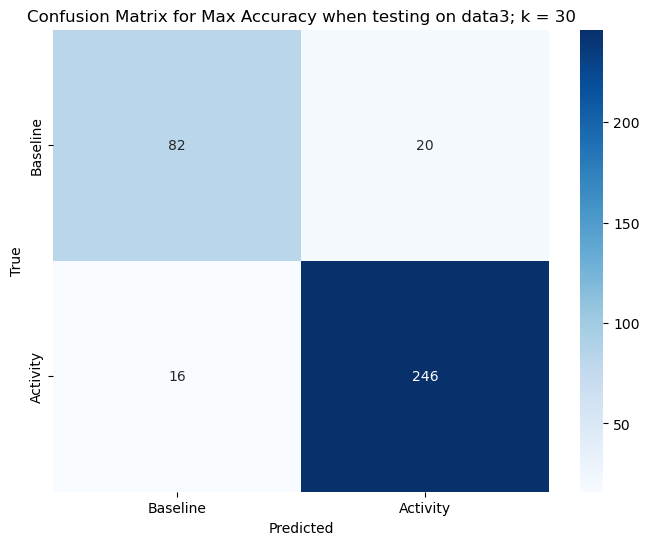

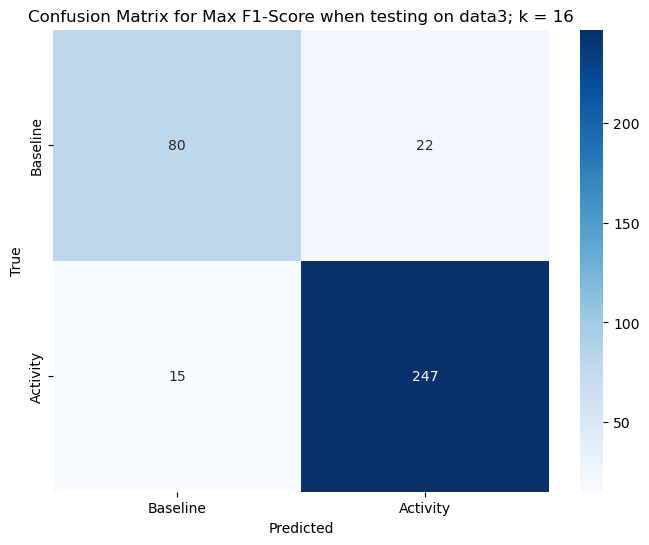

data3 has been tested on everyone


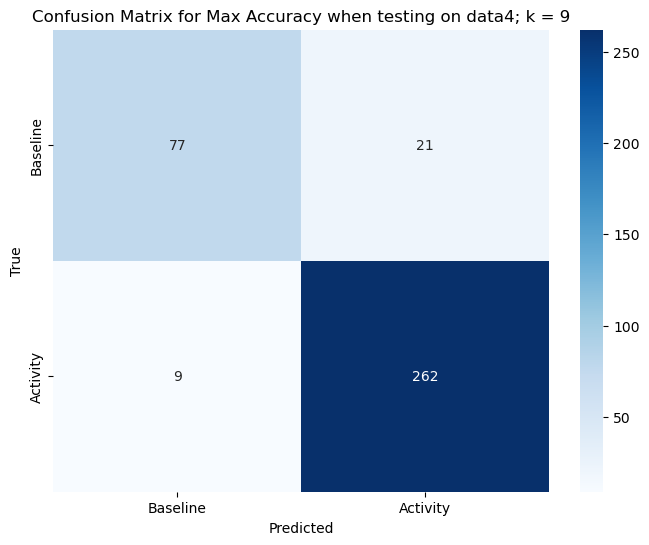

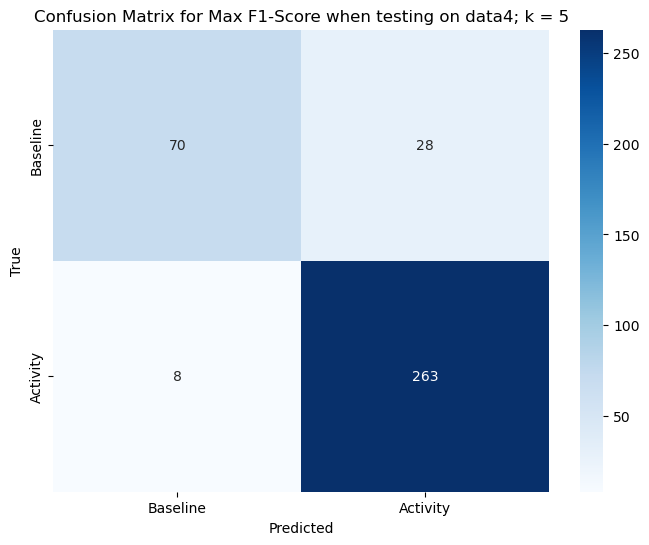

data4 has been tested on everyone


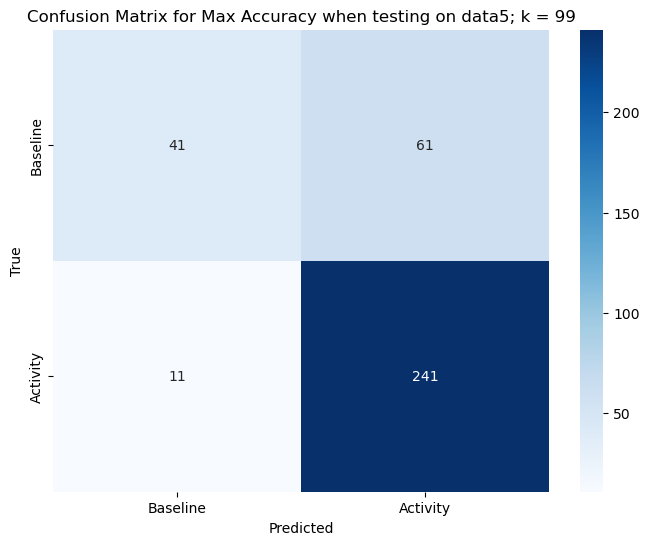

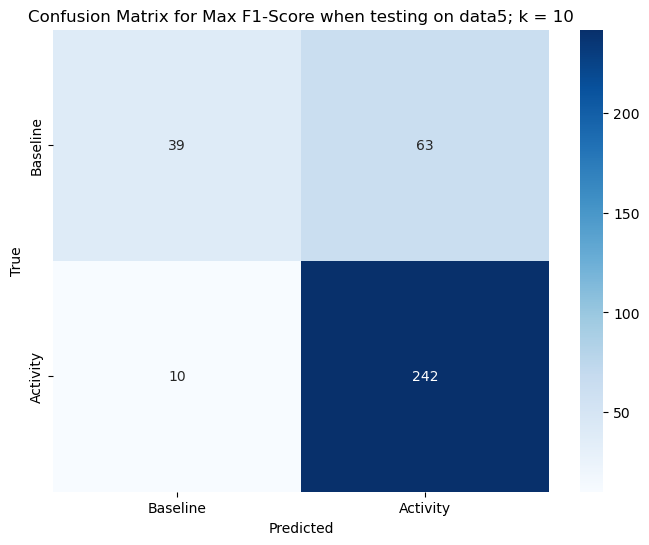

data5 has been tested on everyone


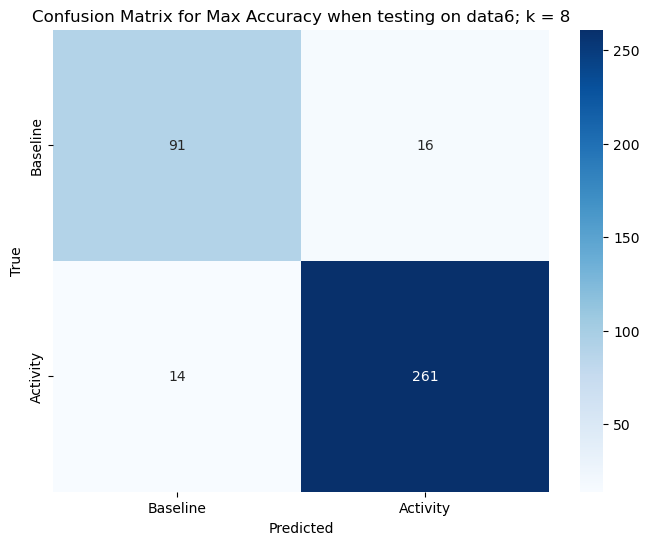

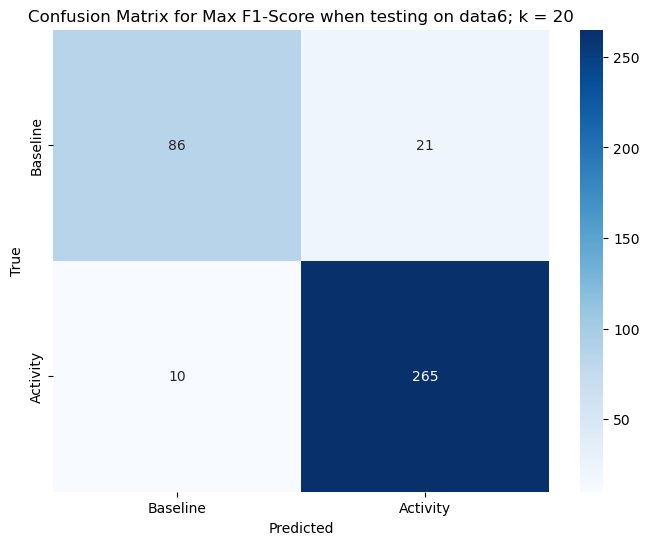

data6 has been tested on everyone


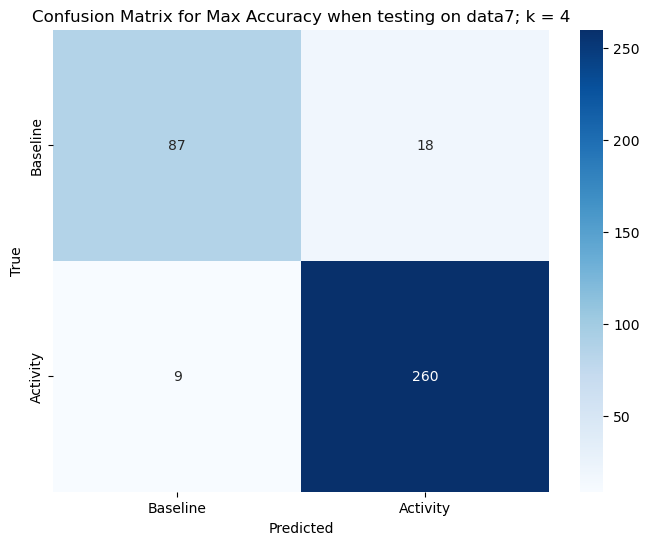

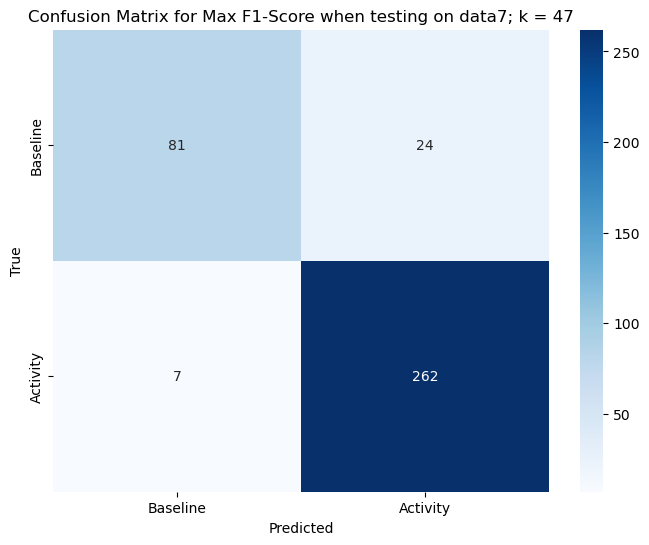

data7 has been tested on everyone


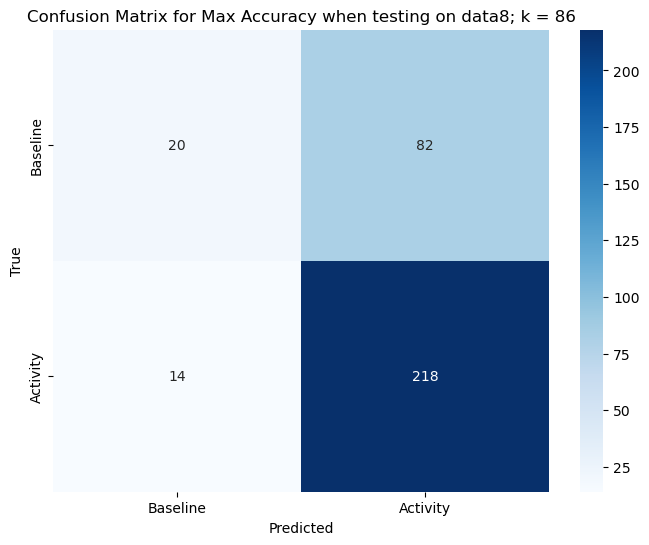

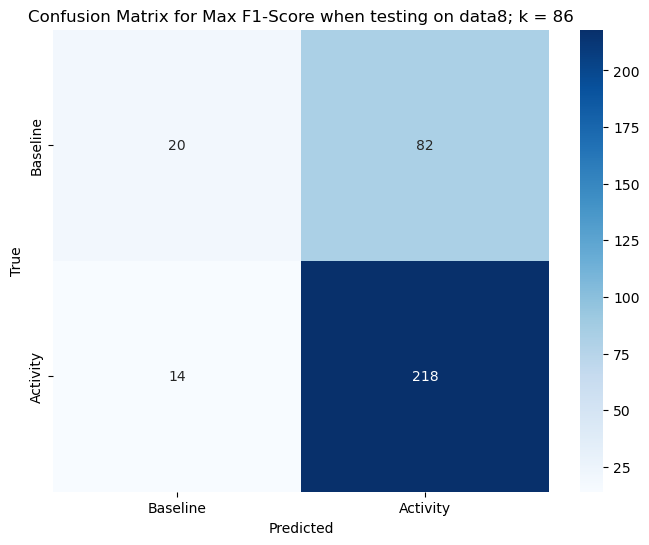

data8 has been tested on everyone


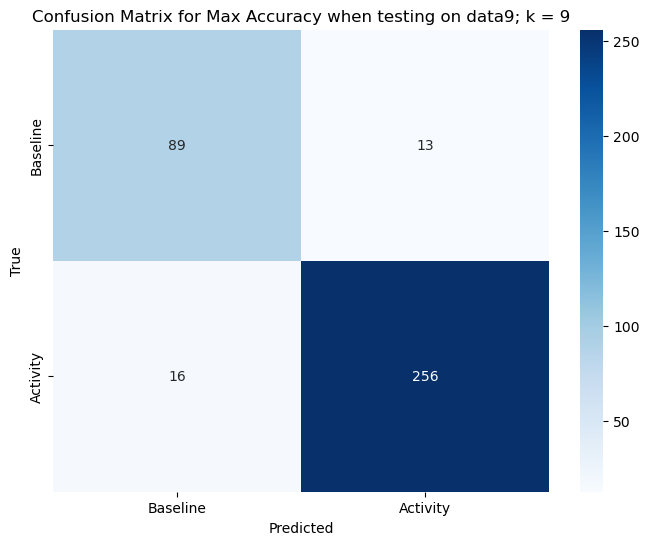

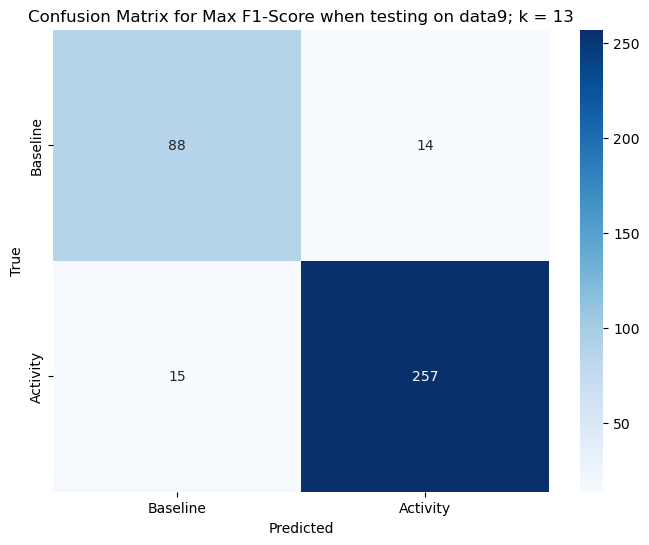

data9 has been tested on everyone


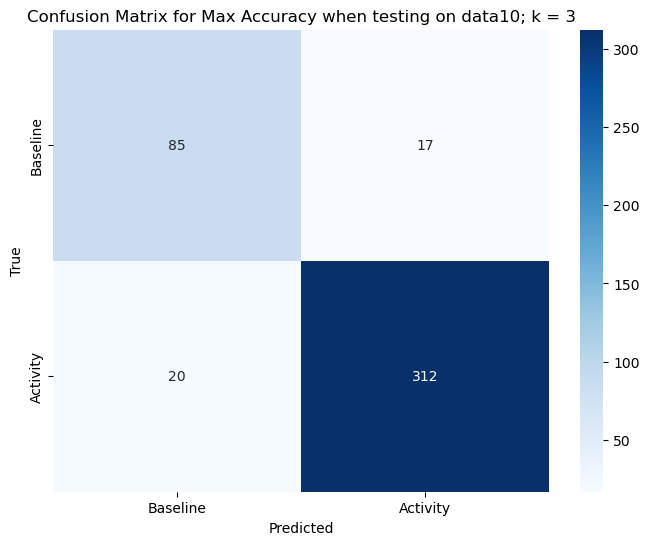

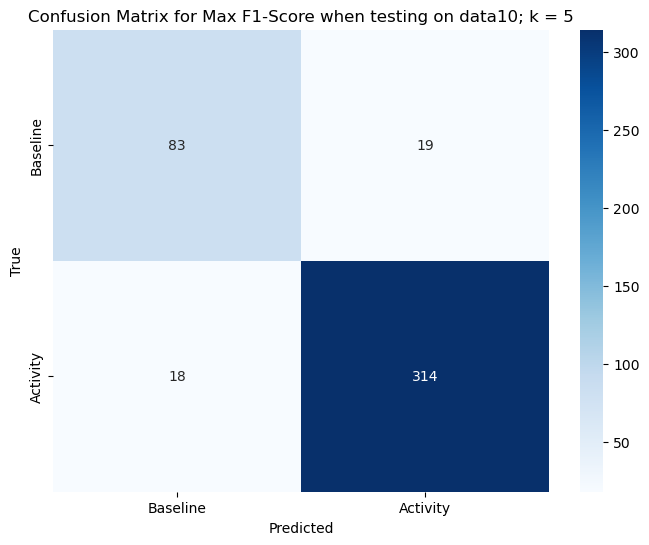

data10 has been tested on everyone


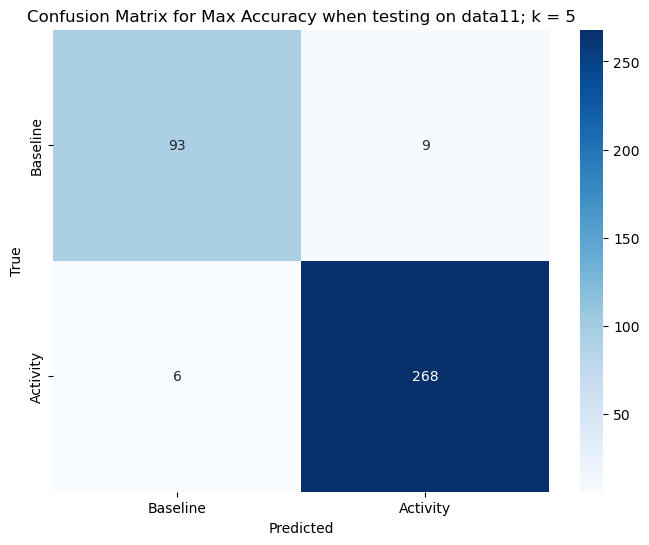

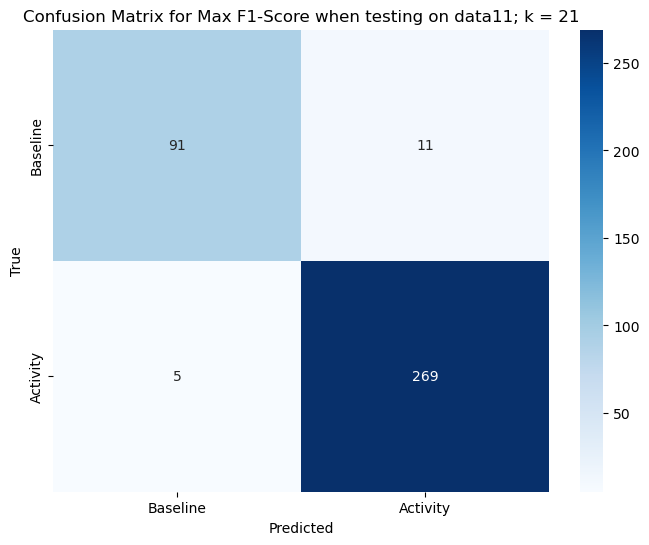

data11 has been tested on everyone


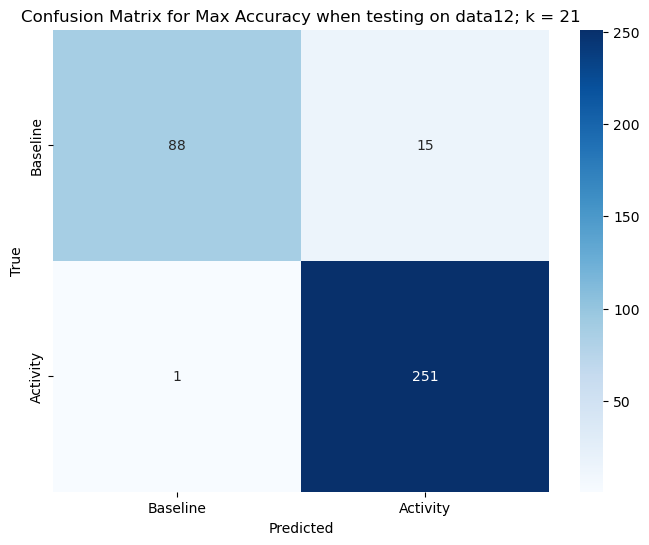

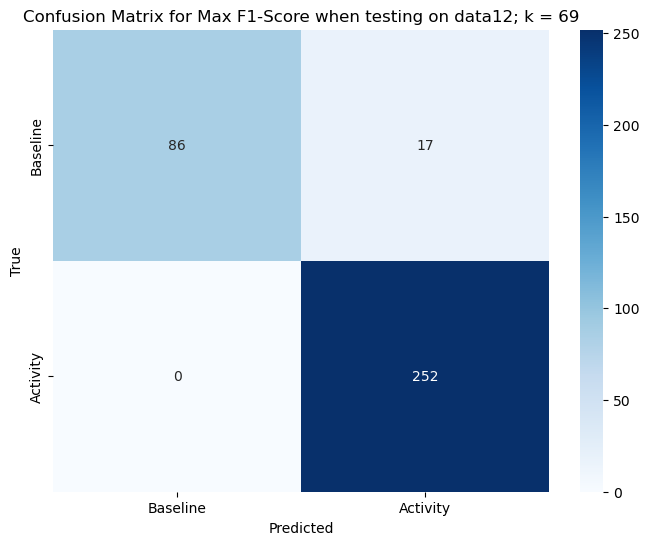

data12 has been tested on everyone


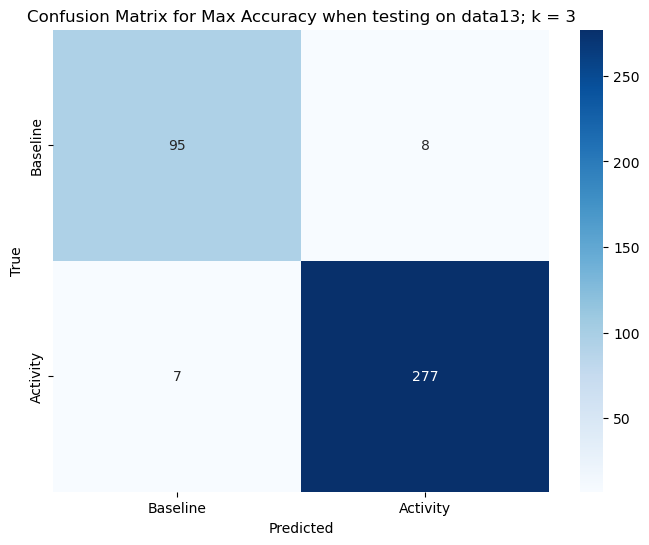

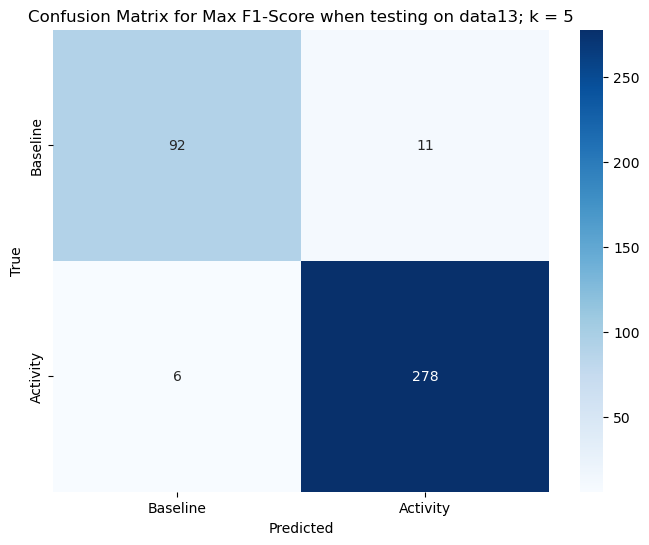

data13 has been tested on everyone


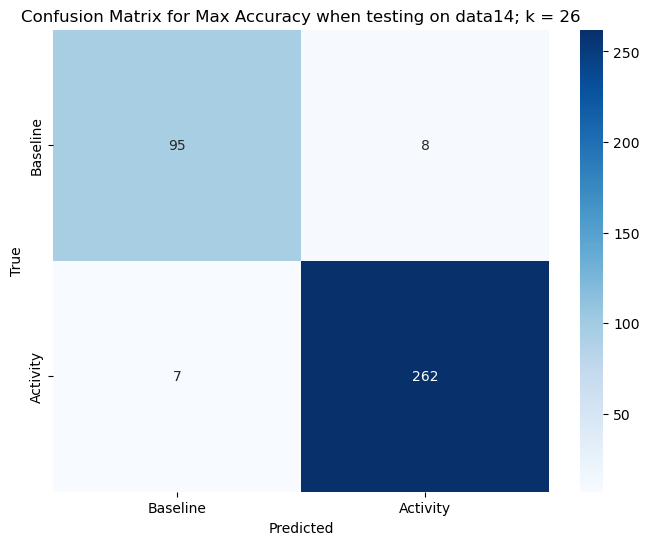

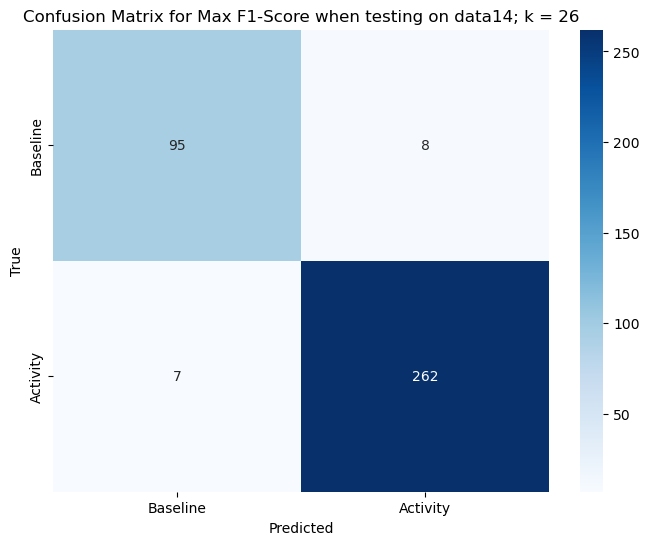

data14 has been tested on everyone


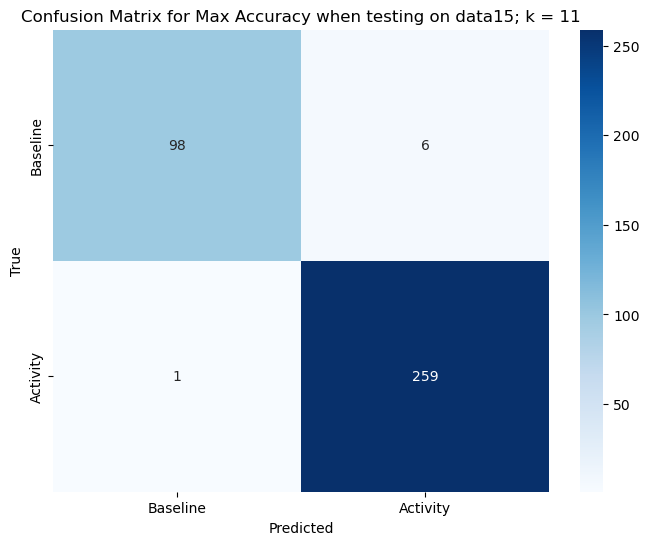

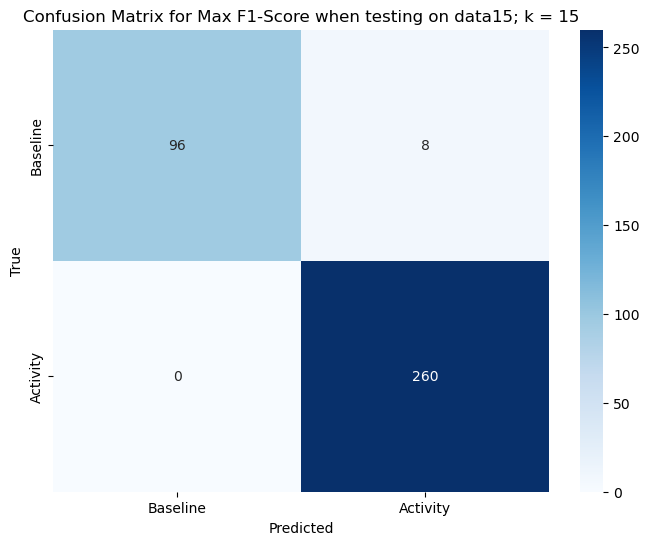

data15 has been tested on everyone


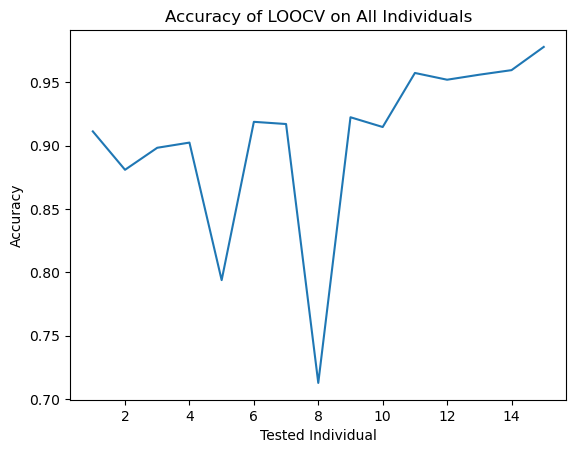

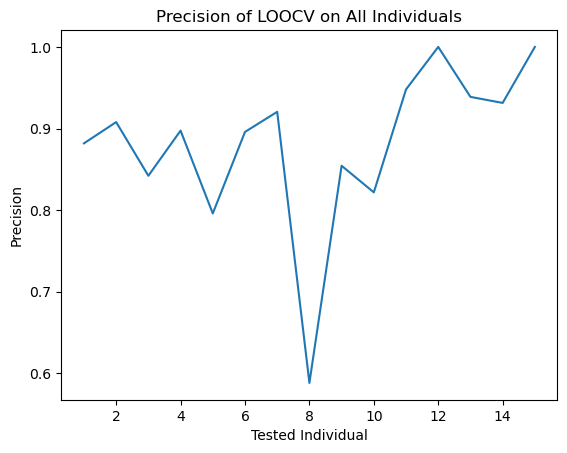

Average Accuracy:  0.9050594449670134
Average Precision:  0.8815940970435704


In [ ]:
## specific_windowed_features.csv
## 1: baseline, clean_baseline
## 2: stairs, soccer, cycling, walking

dataframes = {}
for i in range(15):
    name = f"data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([0, 7, 8, 9])]
    data.loc[data['activity'].isin([2]), 'activity'] = 1
    data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 2
    dataframes[name] = data

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in dataframes:
    trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)


    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(testingActivity, knn.predict(testingFeatures)))
        f1 = precision_score(testingActivity, knn.predict(testingFeatures))
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Baseline", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Baseline", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred))

    print(f"{tester} has been tested on everyone")

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("Precision of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Precision")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average Precision: ", sum(LOOCVf1_score) / len(LOOCVf1_score))

In [ ]:
## specific_windowed_features.csv
## 1: baseline, clean_baseline, lunch, working, driving
## 2: stairs, soccer, cycling, walking

dataframes = {}
for i in range(15):
    name = f"data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data.loc[data['activity'].isin([0, 2, 7, 8, 9]), 'activity'] = 1
    data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 2
    dataframes[name] = data

k = np.arange(1,101)
maxAccK = 0
maxF1K = 0
maxAcc = 0
maxF1 = 0
for i in k:
    for tester in dataframes:
        LOOCVAccuracy = np.array([])
        LOOCVf1_score = np.array([])
        trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

        testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
        testingActivity = dataframes[tester]["activity"].to_numpy()

        X_train = pd.DataFrame()
        y_train = pd.DataFrame()
        for trainer in dataframes:
            if trainer != tester:
                X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
                y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

        X_train = X_train.to_numpy()
        y_train = y_train.to_numpy().flatten()

        testingFeatures = StandardScaler().fit_transform(testingFeatures)
        X_train = StandardScaler().fit_transform(X_train)

        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)

        y_pred = knn.predict(testingFeatures)


        LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
        LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred))

    avgAcc = sum(LOOCVAccuracy) / len(LOOCVAccuracy)
    avgPre = sum(LOOCVf1_score) / len(LOOCVf1_score)


    if avgAcc > maxAcc:
        maxAccK = i
        maxAcc = avgAcc
    if avgPre > maxF1:
        maxF1K = i
        maxF1 = avgPre

print(maxAccK)
print(maxAcc)
print(maxF1K)
print(maxF1)

74
0.8001752848378615
3
0.8407643312101911


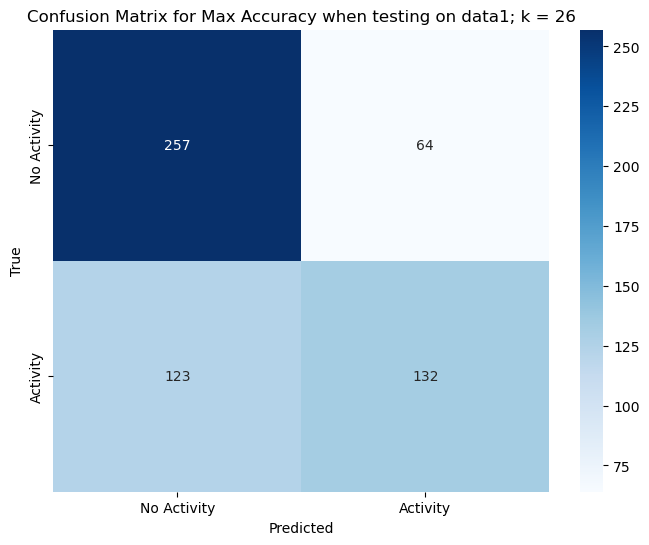

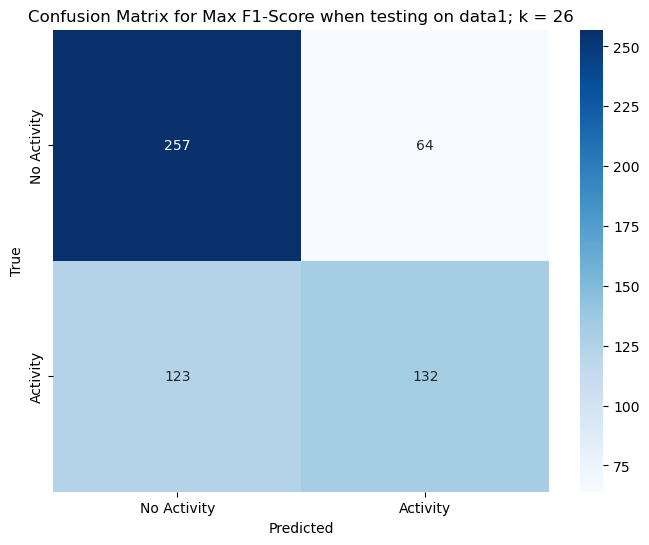

data1 has been tested on everyone


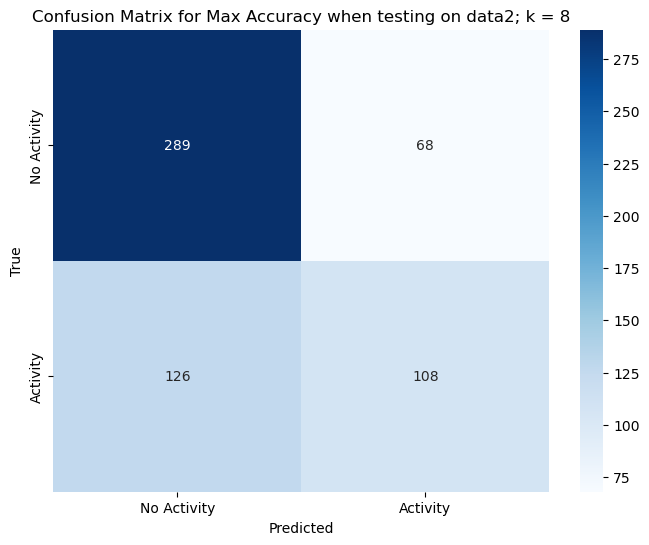

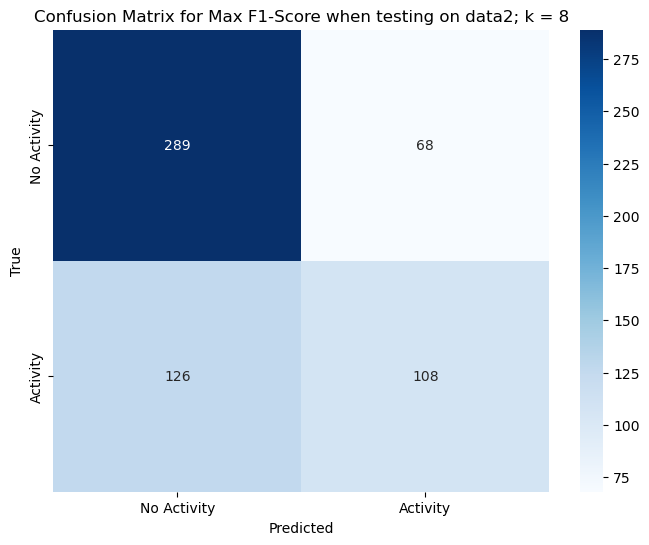

data2 has been tested on everyone


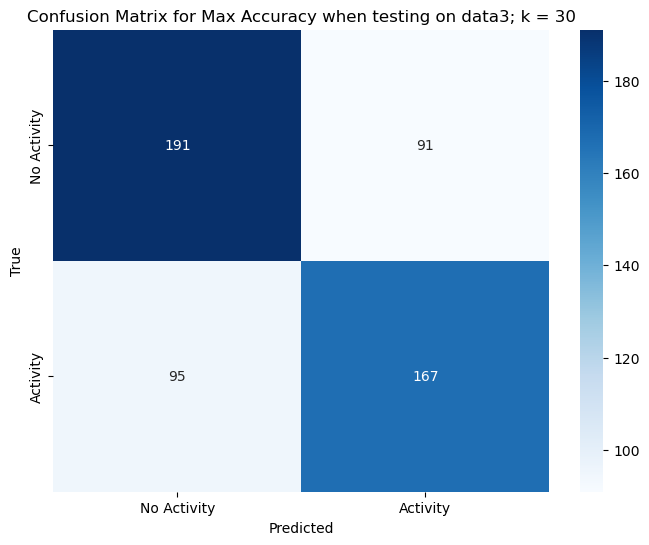

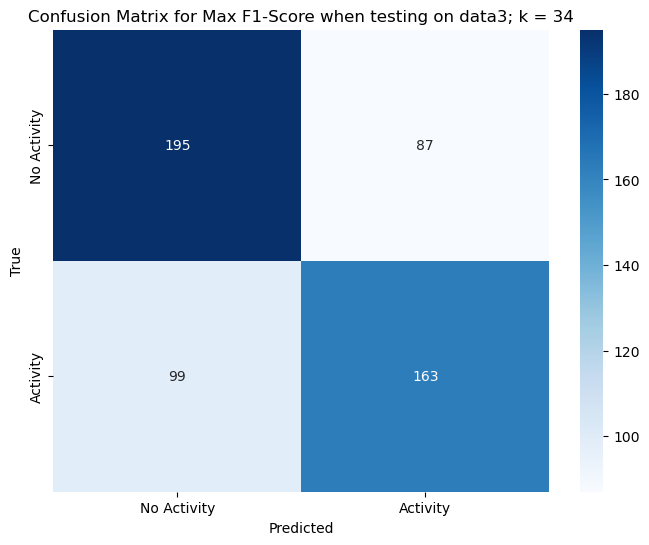

data3 has been tested on everyone


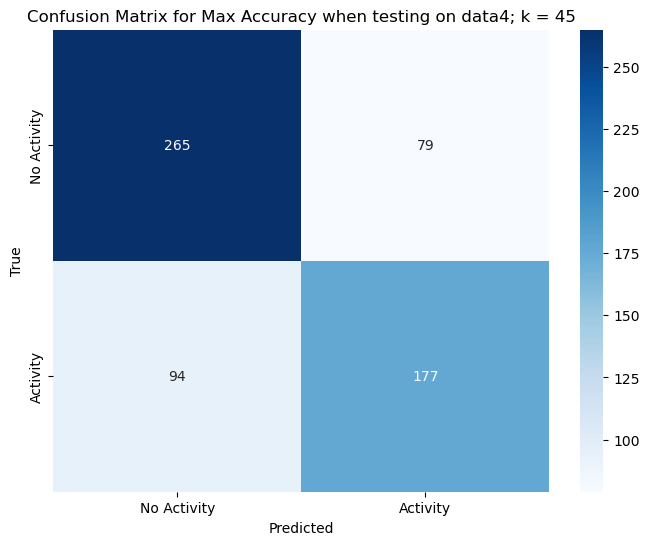

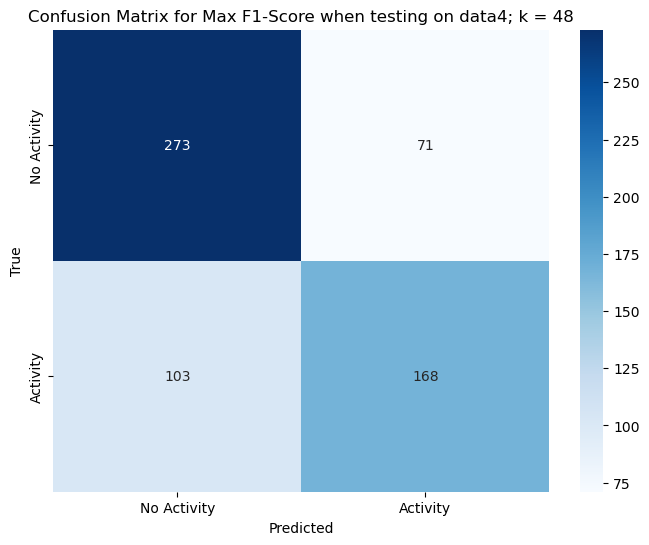

data4 has been tested on everyone


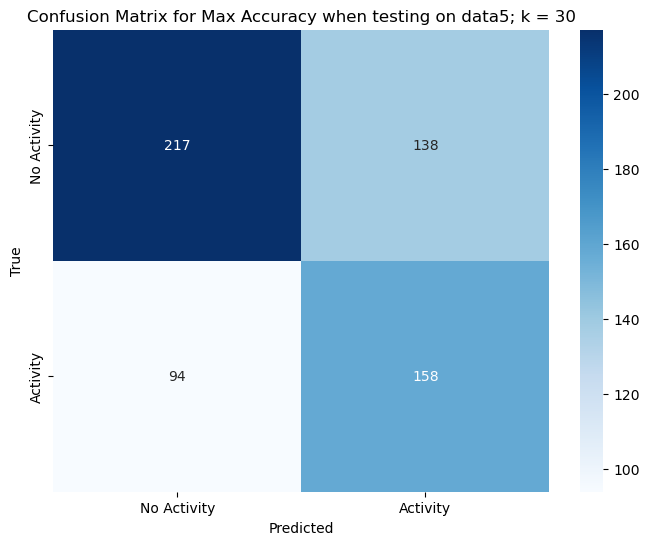

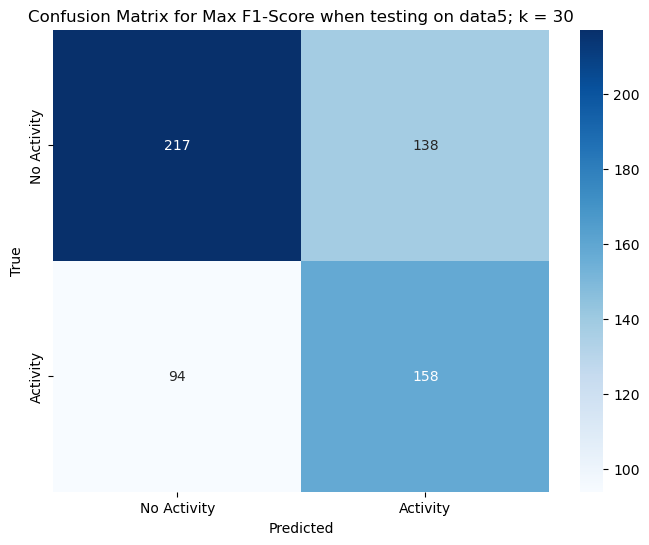

data5 has been tested on everyone


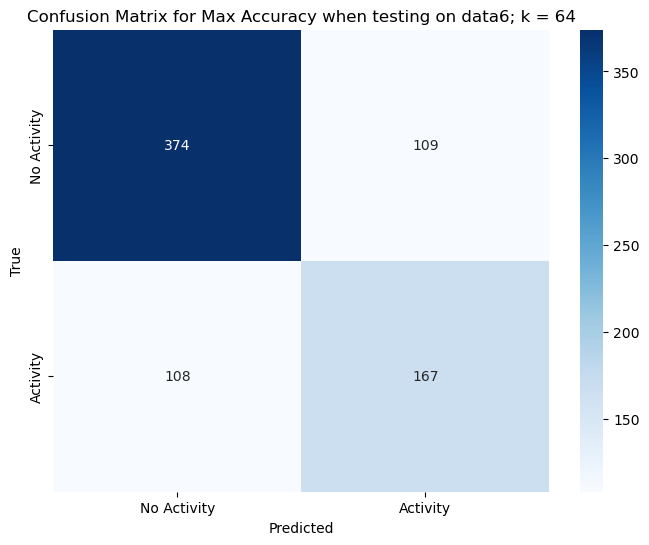

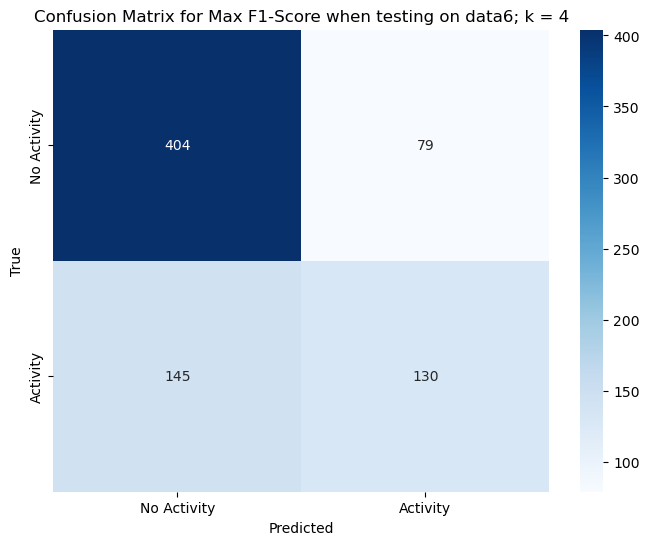

data6 has been tested on everyone


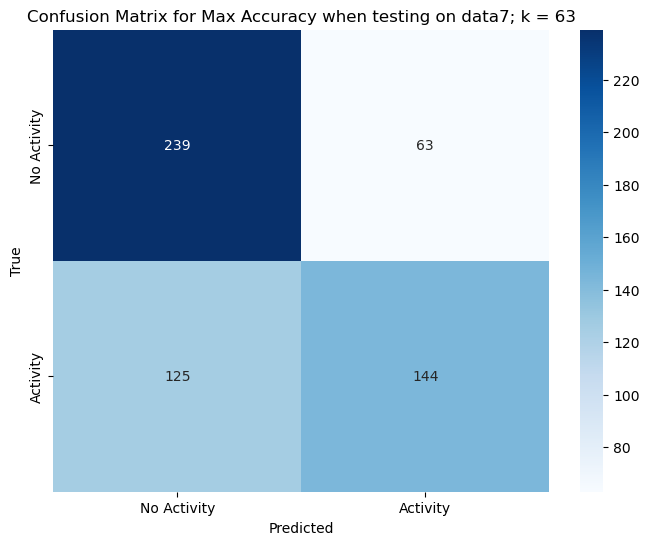

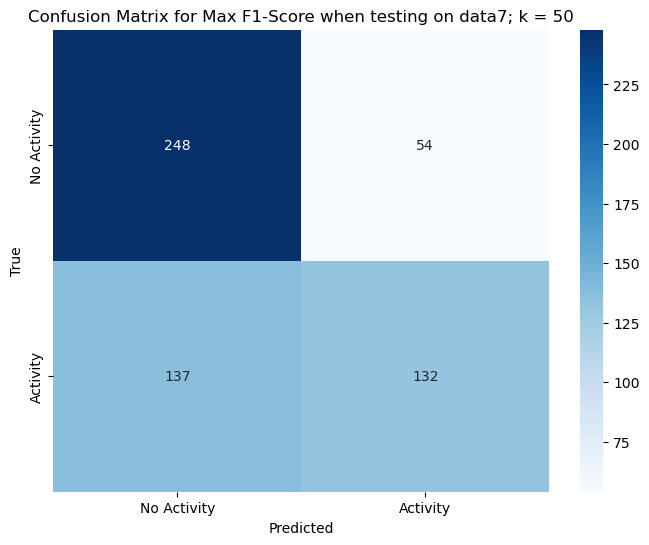

data7 has been tested on everyone


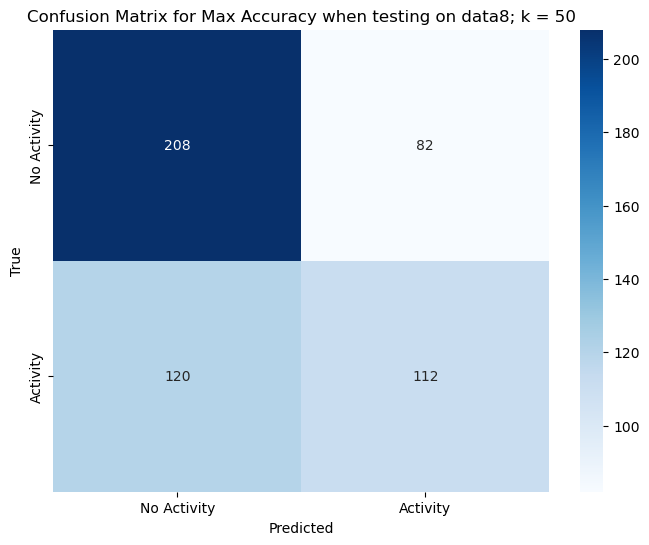

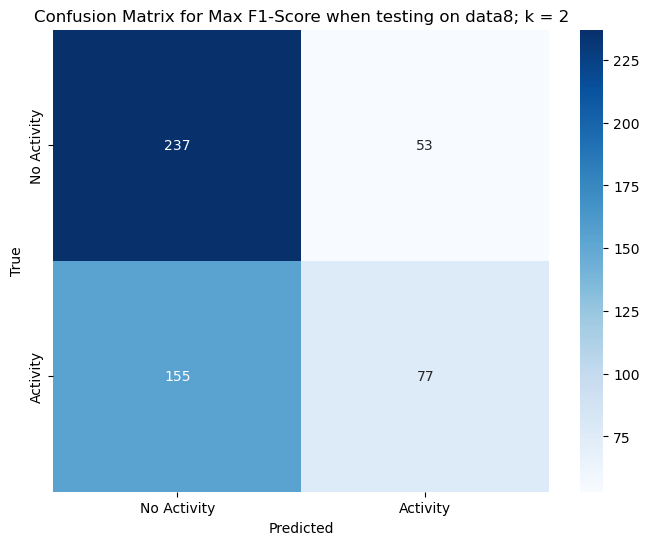

data8 has been tested on everyone


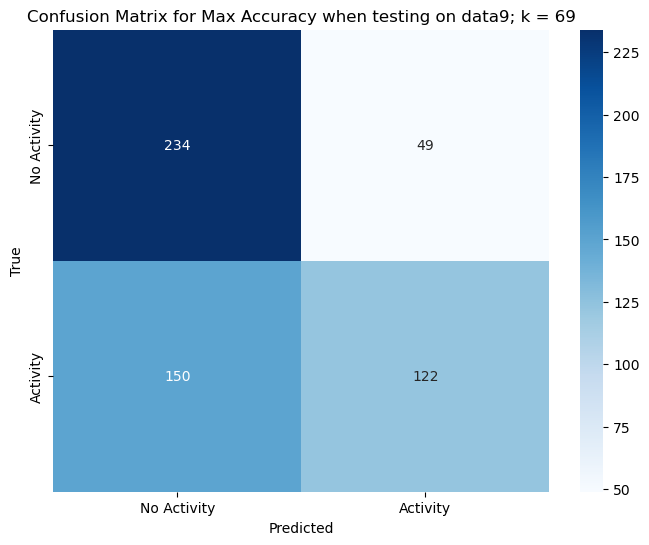

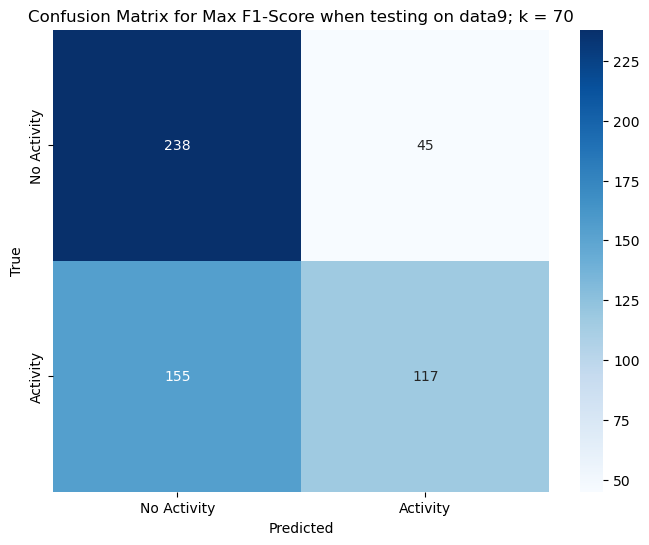

data9 has been tested on everyone


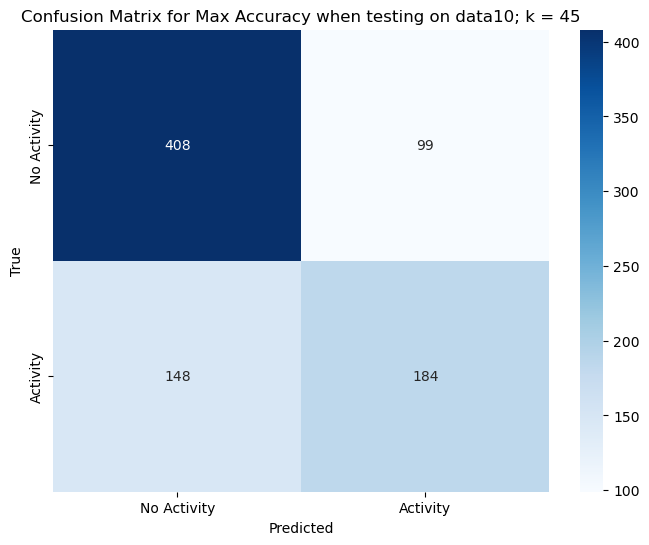

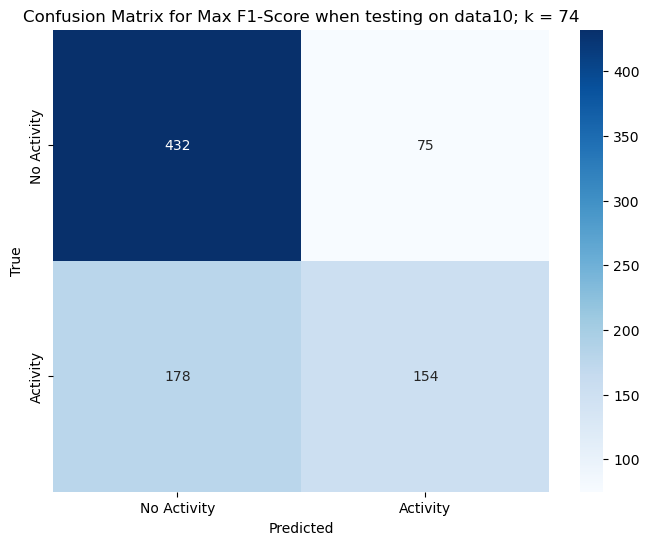

data10 has been tested on everyone


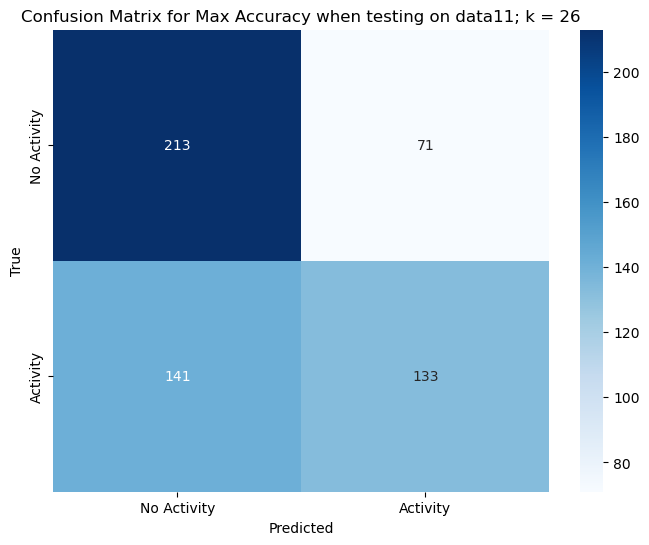

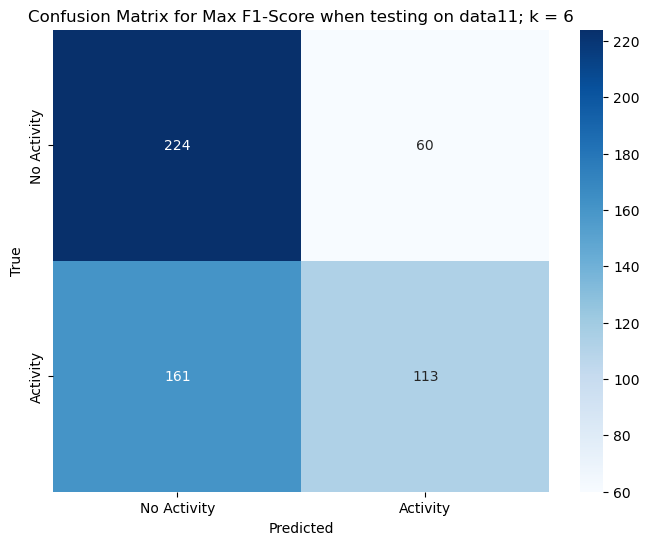

data11 has been tested on everyone


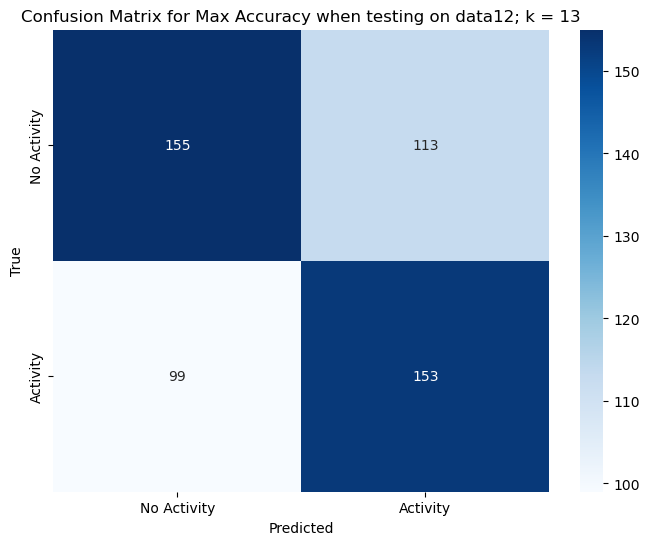

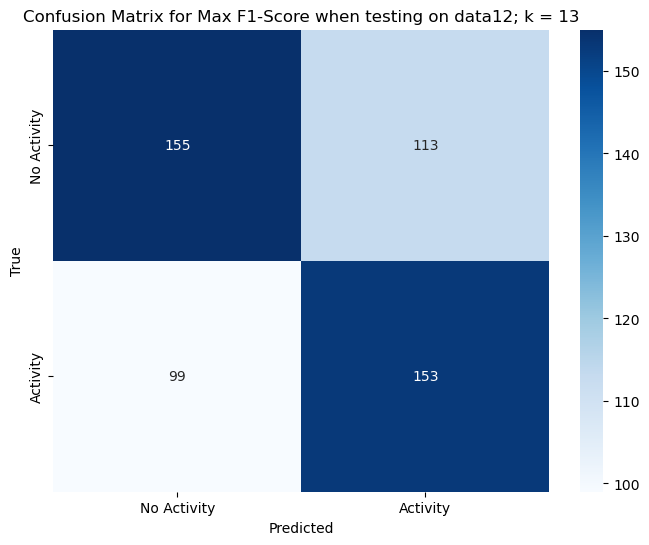

data12 has been tested on everyone


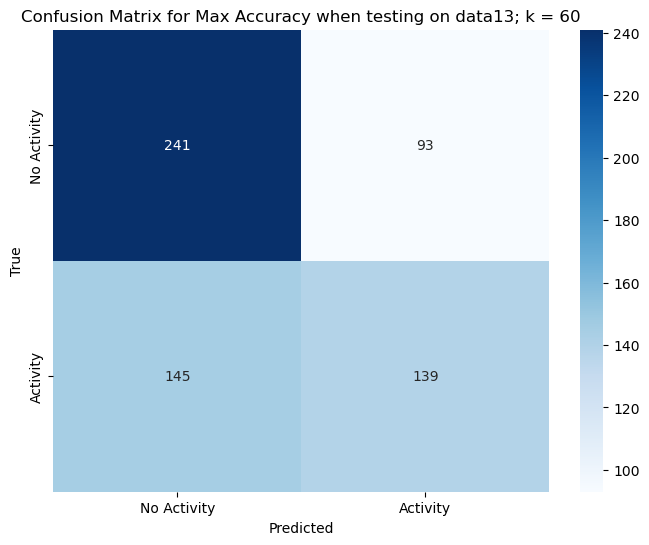

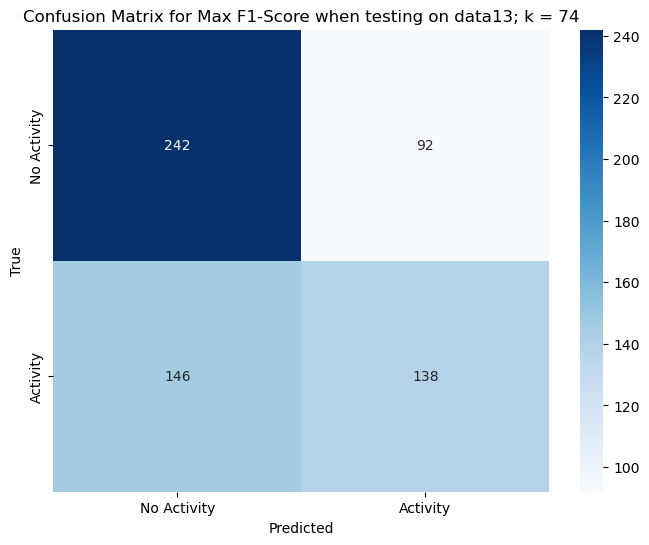

data13 has been tested on everyone


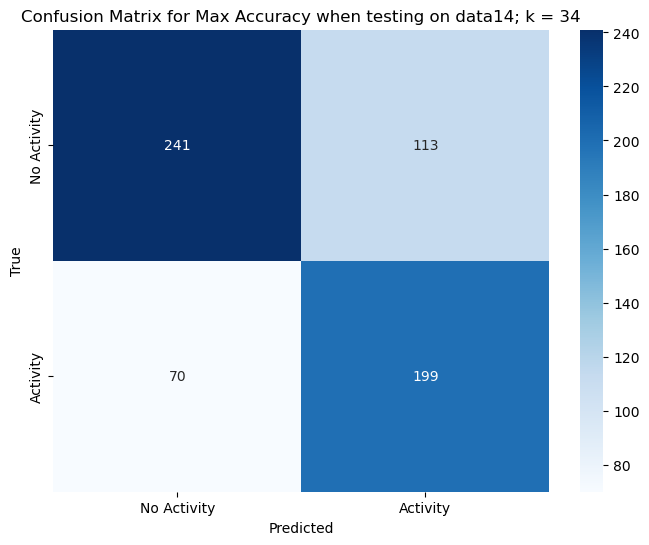

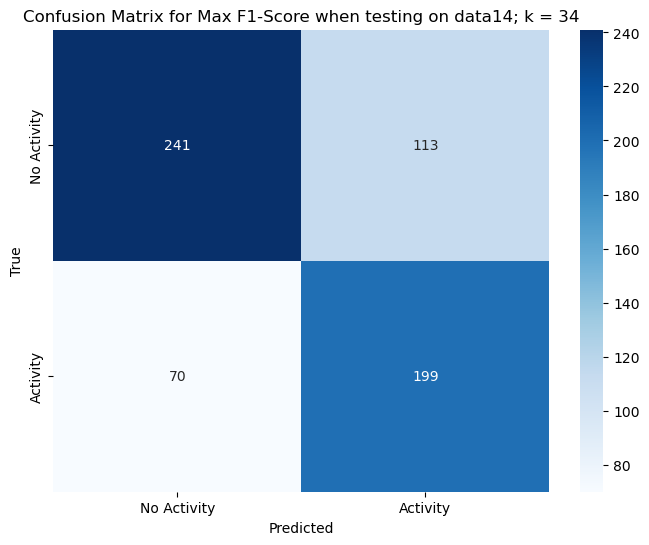

data14 has been tested on everyone


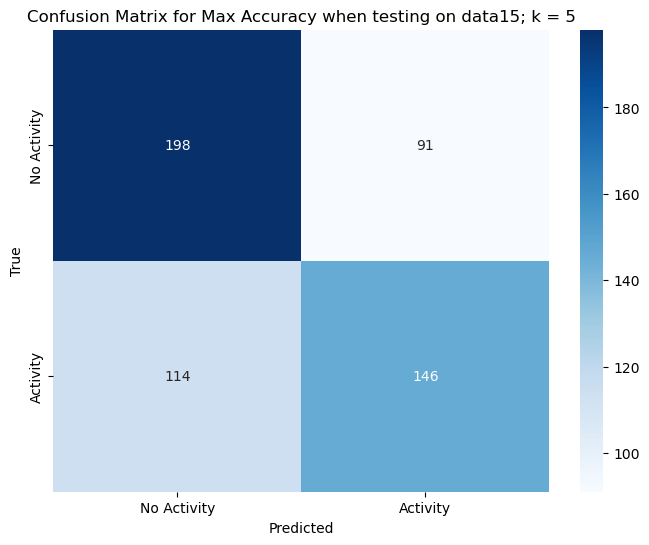

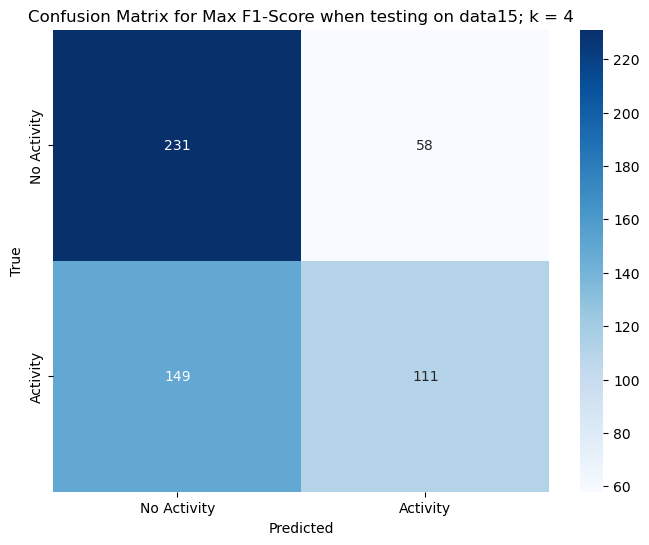

data15 has been tested on everyone


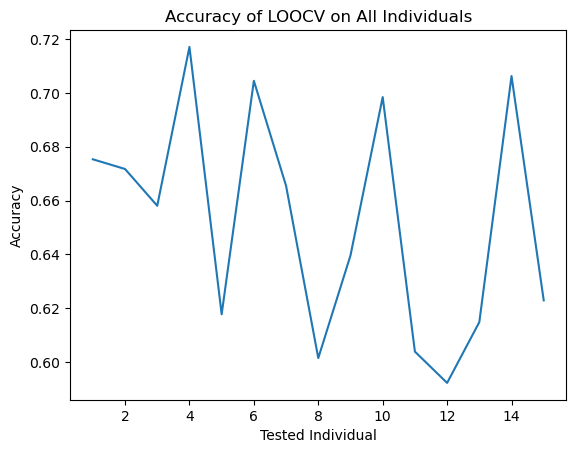

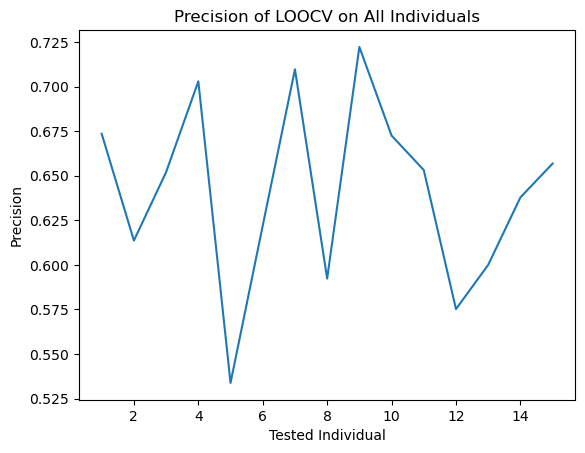

Average Accuracy:  0.6526666094739351
Average Precision:  0.6411677865949927


In [ ]:
## specific_windowed_features.csv
## 0: no activity
## 1: stairs, soccer, cycling, walking

dataframes = {}
for i in range(15):
    name = f"data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([1, 2, 7, 8, 9])]
    data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 1
    dataframes[name] = data

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in dataframes:
    trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)


    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(testingActivity, knn.predict(testingFeatures)))
        f1 = precision_score(testingActivity, knn.predict(testingFeatures))
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred))

    print(f"{tester} has been tested on everyone")

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("Precision of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Precision")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average Precision: ", sum(LOOCVf1_score) / len(LOOCVf1_score))

In [ ]:
acc = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S1/S1_E4/ACC_specific_windowed_features.csv")
hr = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S1/S1_E4/HR_specific_windowed_features.csv")
bvp = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S1/S1_E4/BVP_specific_windowed_features.csv")

print(acc.shape)
print(hr.shape)
print(bvp.shape)

print(acc.iloc[-1])
print(hr.iloc[-1])
print(bvp.iloc[-1])

acc['start_time'] = pd.to_datetime(acc['start_time'])
hr['start_time'] = pd.to_datetime(hr['start_time'])
bvp['start_time'] = pd.to_datetime(bvp['start_time'])
acc['end_time'] = pd.to_datetime(acc['end_time'])
hr['end_time'] = pd.to_datetime(hr['end_time'])
bvp['end_time'] = pd.to_datetime(bvp['end_time'])

common_columns = ['start_time', 'end_time', 'activity']
data = acc.merge(hr, on=common_columns, how='inner').merge(bvp, on=common_columns, how='inner')

print(data.shape)
print(data.iloc[-1])

(1325, 33)
(1324, 17)
(1325, 17)
start_time                    2024-01-01 02:35:31.000000
end_time                      2024-01-01 02:35:38.000000
activity                                               0
acc_x_mean                                    -26.737778
acc_x_min                                            -66
acc_x_max                                             10
acc_x_median                                       -26.0
acc_x_std                                      14.196253
acc_x_zcross                                    0.026786
acc_x_meancross                                 0.080357
fft_acc_x_mean                                126.629834
fft_{column}_min                                1.388813
fft_{column}_second_max                      1761.211227
fft_{column}_dc_component                         5976.0
fft_{column}_std                              459.220027
fft_{column}_median                            49.049079
fft_{column}_dominant_freq                           0.

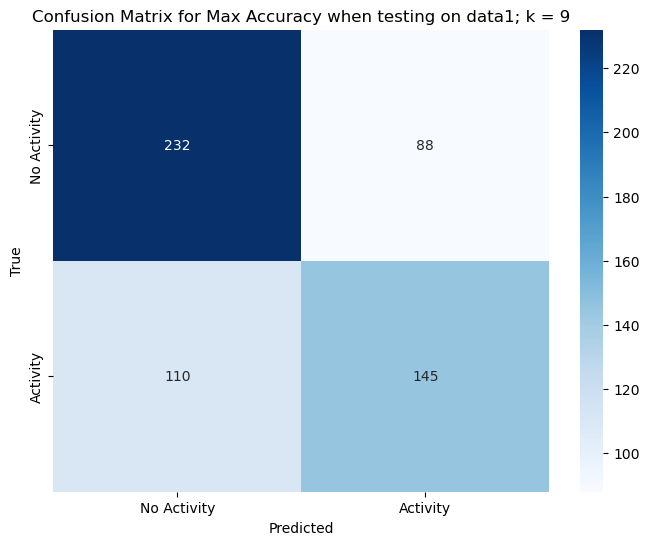

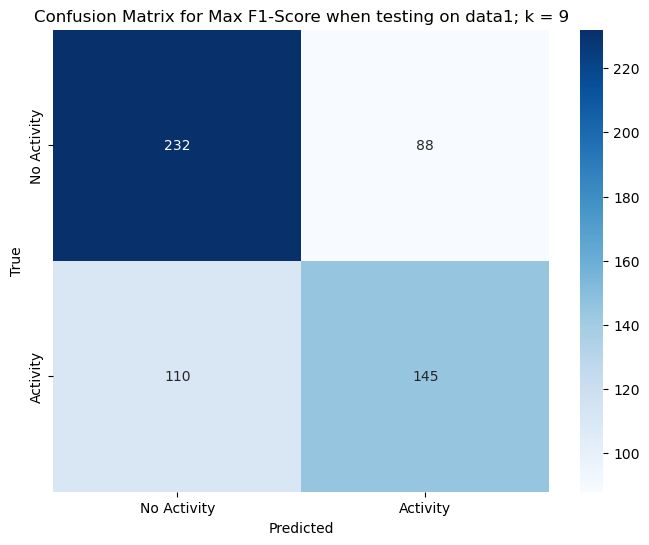

data1 has been tested on everyone


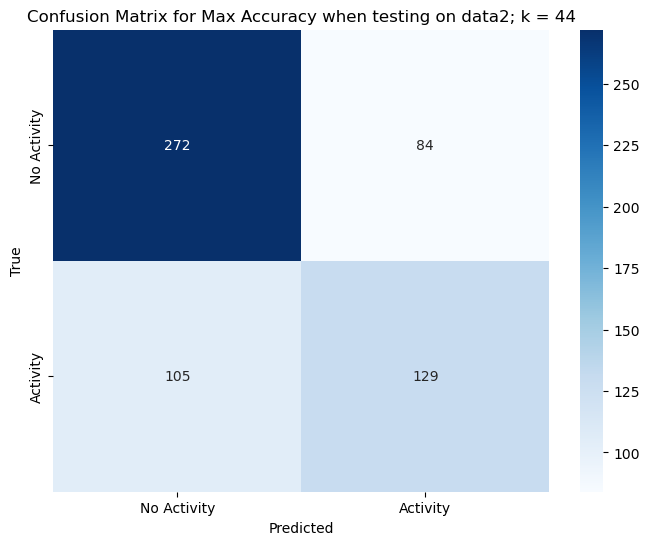

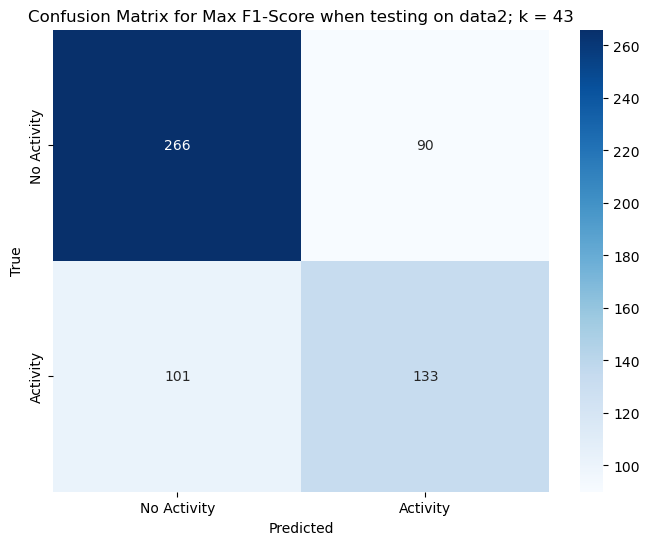

data2 has been tested on everyone


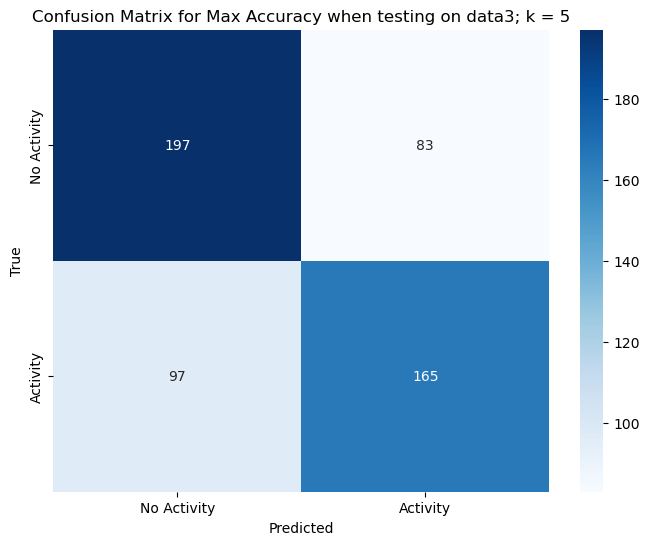

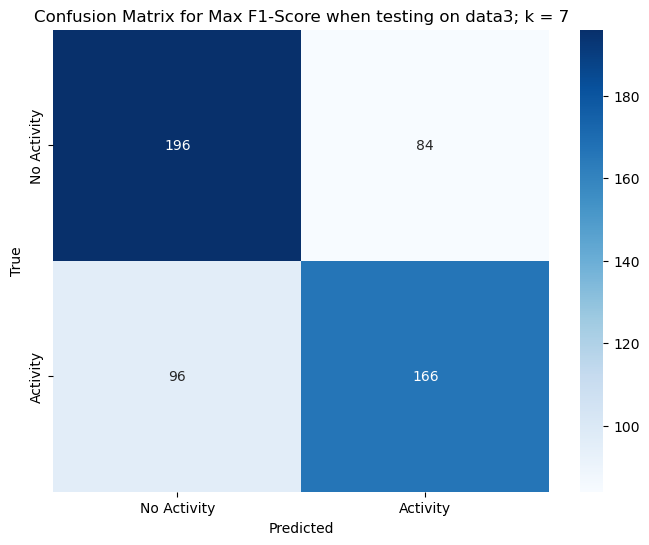

data3 has been tested on everyone


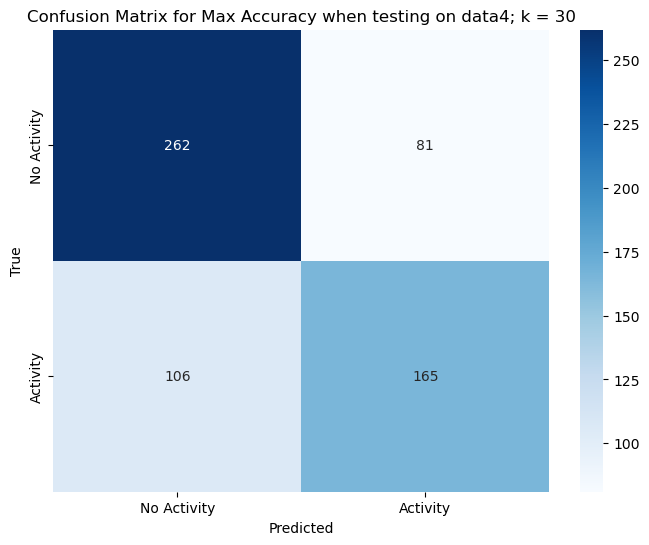

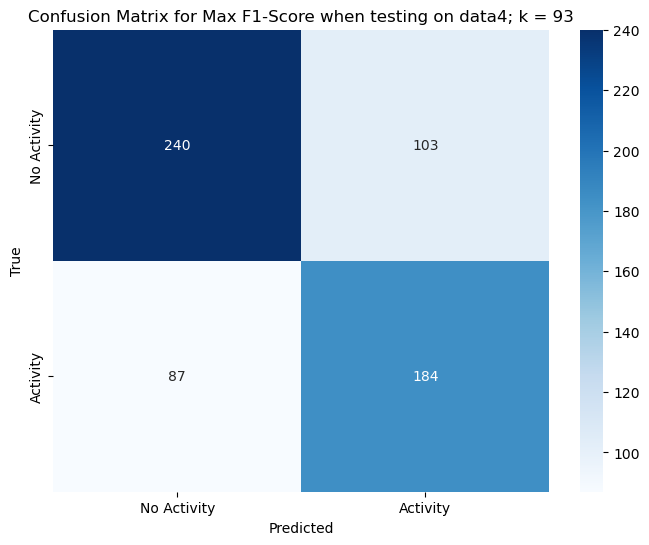

data4 has been tested on everyone


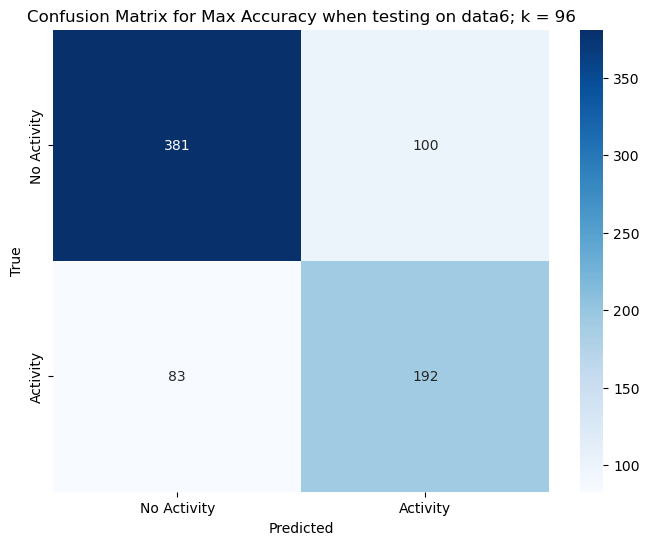

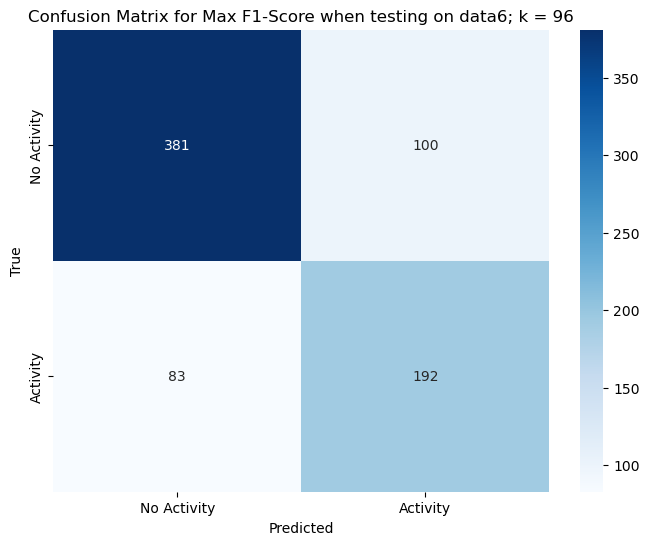

data6 has been tested on everyone


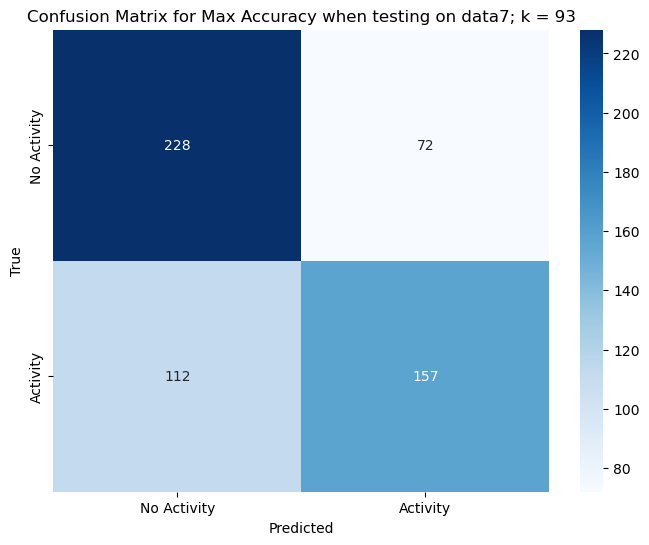

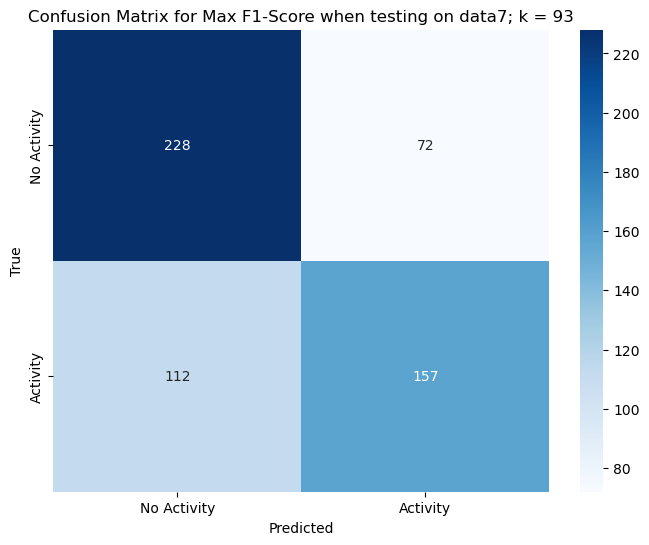

data7 has been tested on everyone


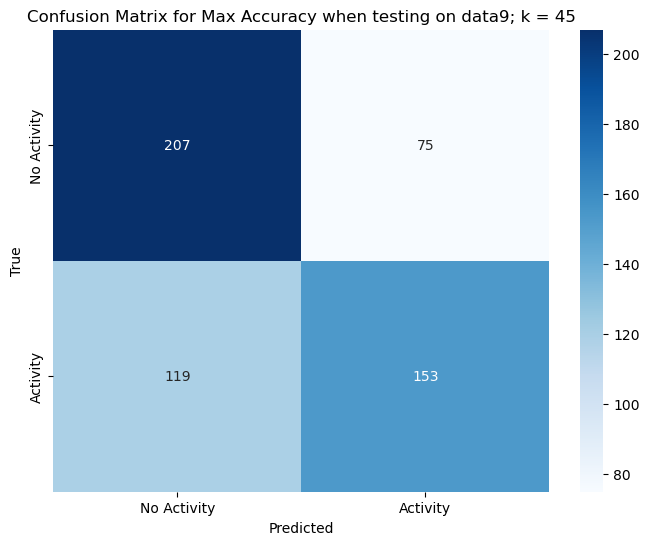

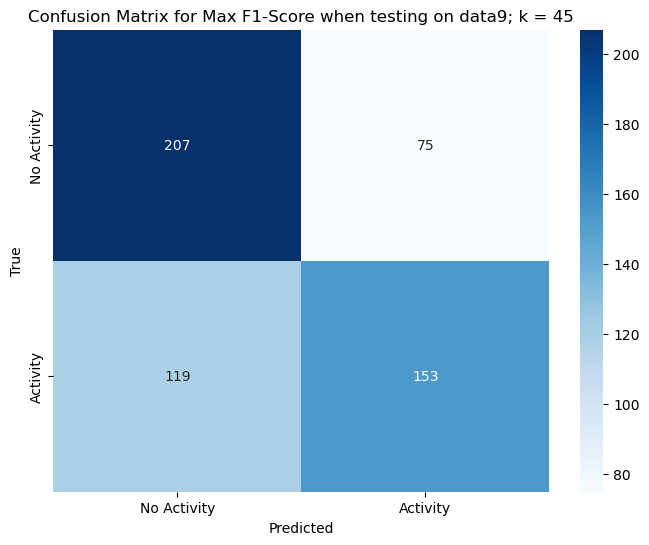

data9 has been tested on everyone


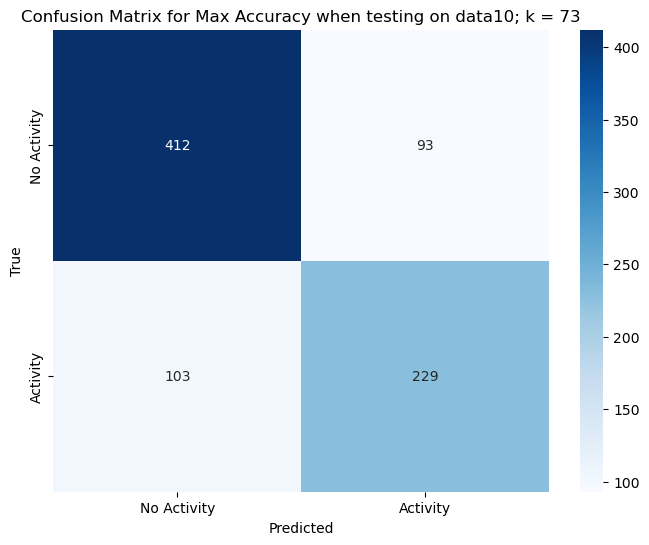

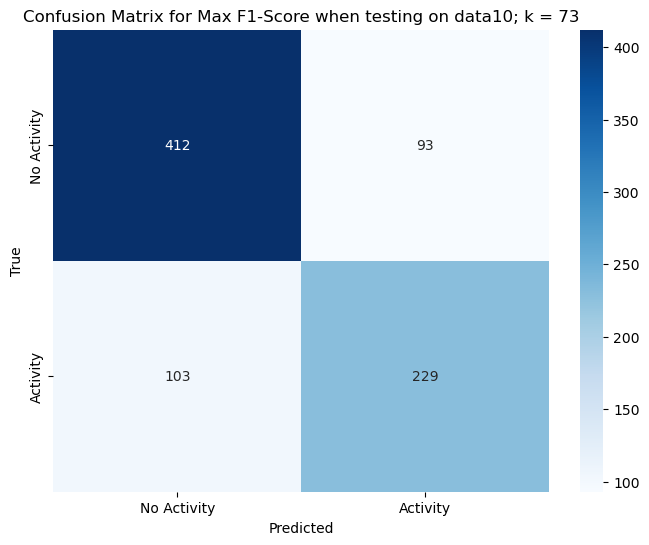

data10 has been tested on everyone


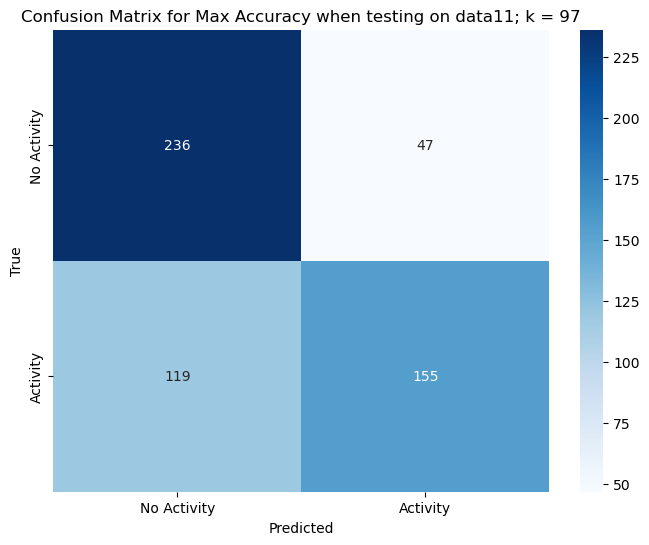

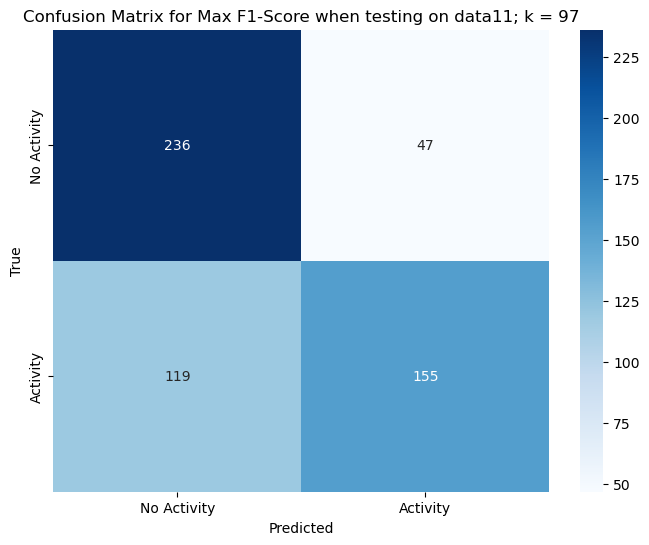

data11 has been tested on everyone


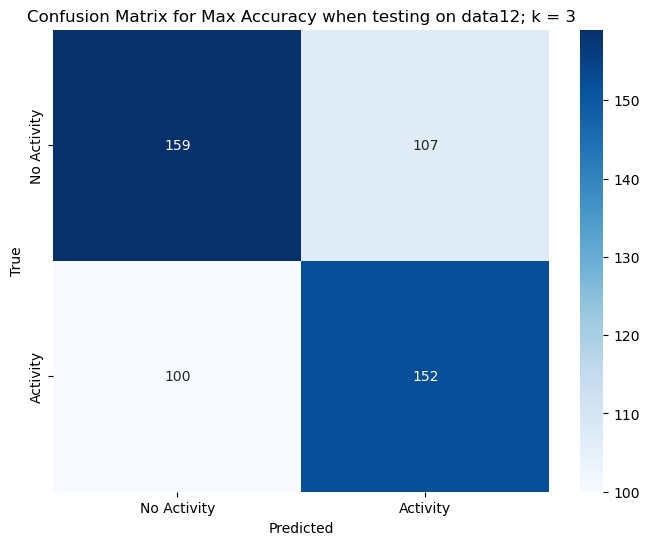

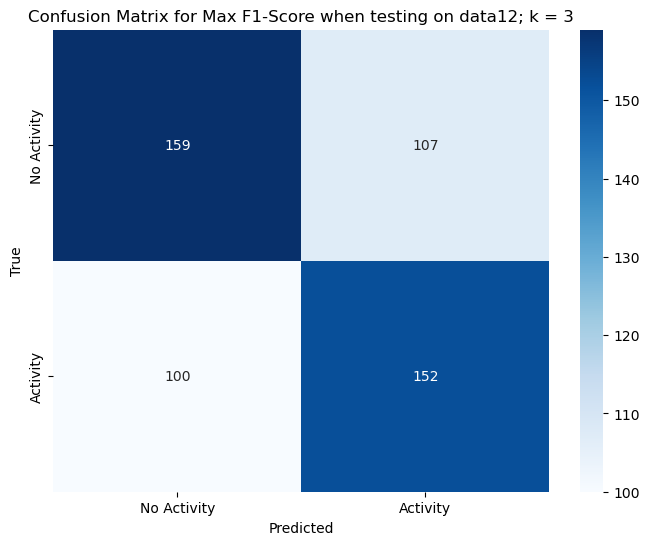

data12 has been tested on everyone


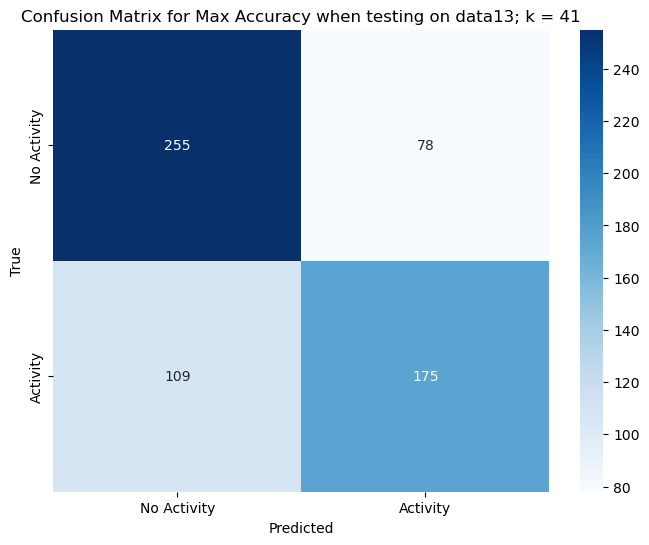

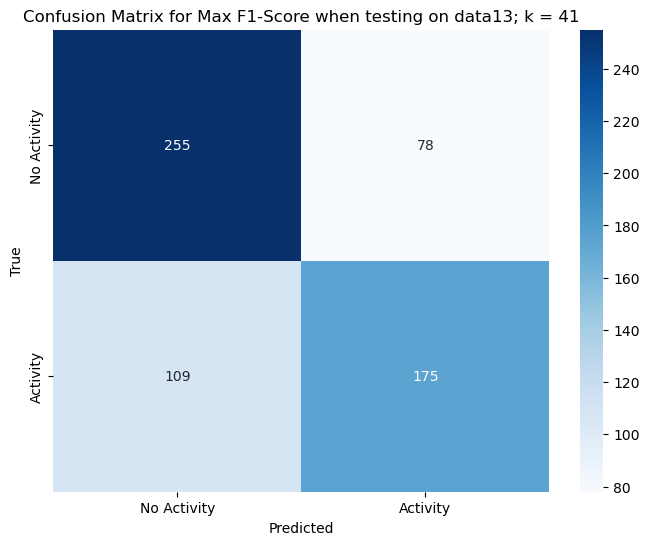

data13 has been tested on everyone


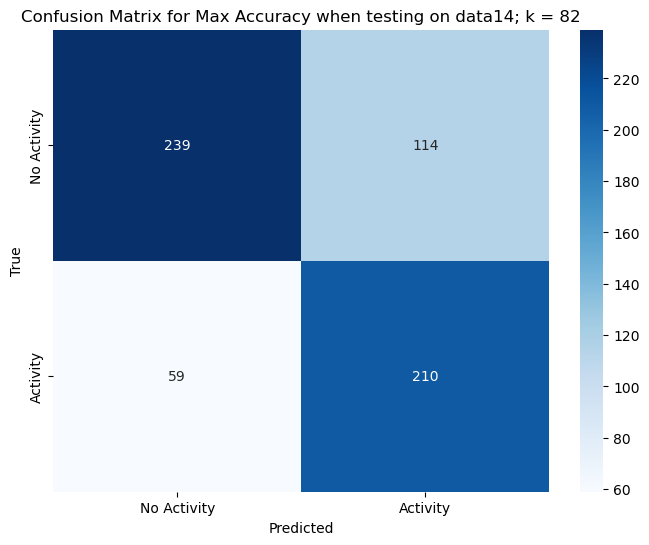

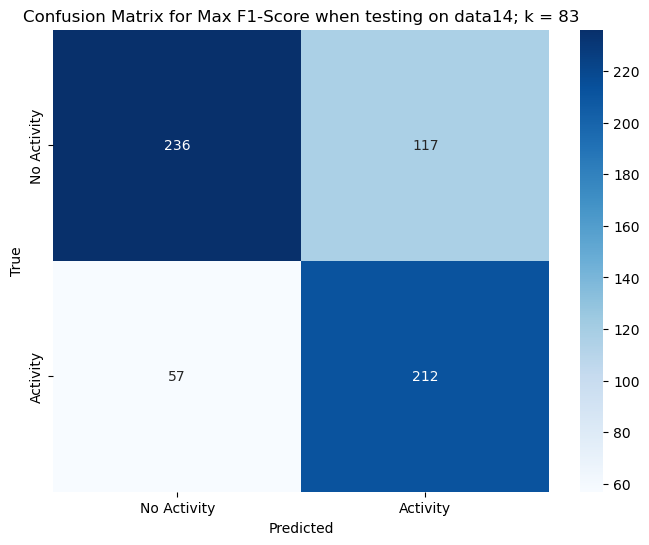

data14 has been tested on everyone


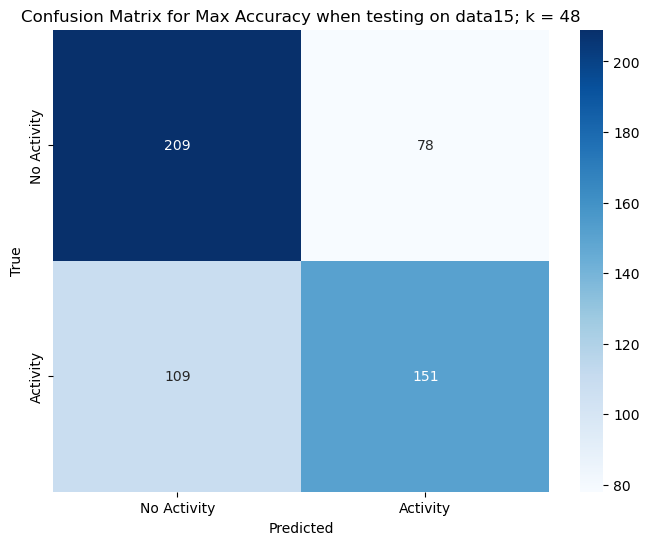

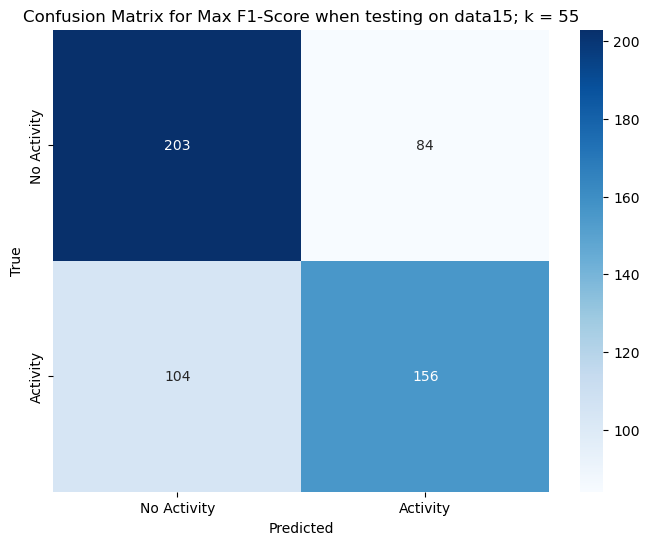

data15 has been tested on everyone


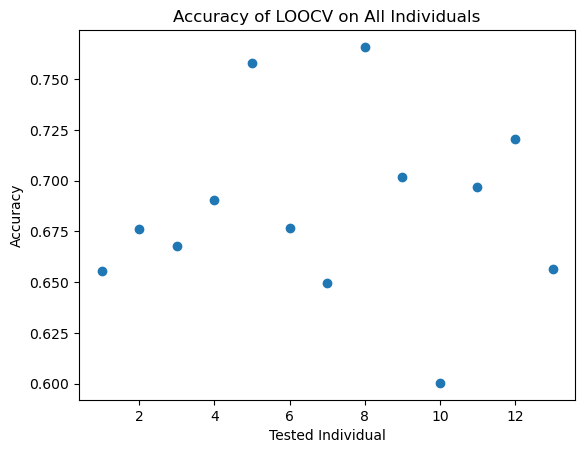

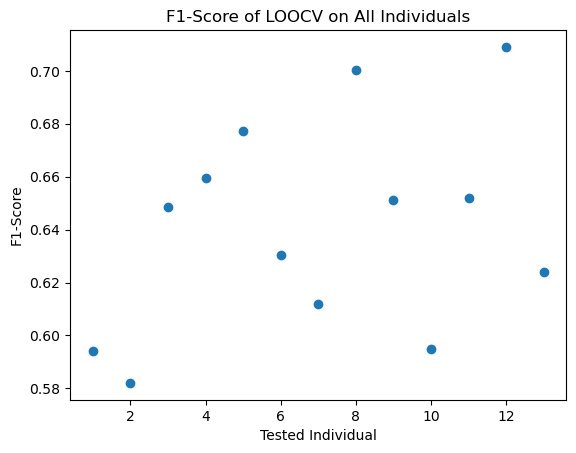

In [ ]:
## ACC_specific_windowed_features.csv
## HR_specific_windowed_features.csv
## BVP_specific_windowed_features.csv
## 0: no activity
## 1: stairs, soccer, cycling, walking

def uncorrelated(df, threshold=0.85, ignore_columns=None):
    if ignore_columns is None:
        ignore_columns = ["start_time", "end_time"]
    df_for_corr = data.drop(columns=ignore_columns, errors='ignore')
    corr_matrix = df_for_corr.corr(method='spearman').abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    filtered_columns = [col for col in data.columns if col not in to_drop]
    return filtered_columns


dataframes = {}
for i in np.arange(1,16):
    if i not in [5,8]:
        name = f"data{i}"
        acc = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/ACC_specific_windowed_features.csv")
        hr = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/HR_specific_windowed_features.csv")
        bvp = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/BVP_specific_windowed_features.csv")
        acc['start_time'] = pd.to_datetime(acc['start_time'])
        hr['start_time'] = pd.to_datetime(hr['start_time'])
        bvp['start_time'] = pd.to_datetime(bvp['start_time'])
        acc['end_time'] = pd.to_datetime(acc['end_time'])
        hr['end_time'] = pd.to_datetime(hr['end_time'])
        bvp['end_time'] = pd.to_datetime(bvp['end_time'])

        common_columns = ['start_time', 'end_time', 'activity']
        data = acc.merge(hr, on=common_columns, how='inner').merge(bvp, on=common_columns, how='inner')
        allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
        data = data[allFeatures]
        data = data[~data['activity'].isin([1, 2, 7, 8, 9])]
        data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 1
        dataframes[name] = data

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in dataframes:
    trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)


    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(testingActivity, knn.predict(testingFeatures)))
        f1 = precision_score(testingActivity, knn.predict(testingFeatures))
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred))

    print(f"{tester} has been tested on everyone")

print('Average Accuracy: ', sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print('Average Precision: ', sum(LOOCVf1_score) / len(LOOCVf1_score))


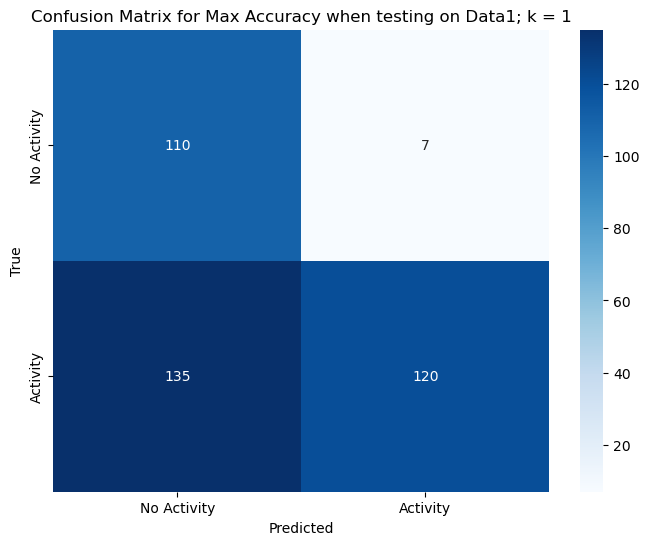

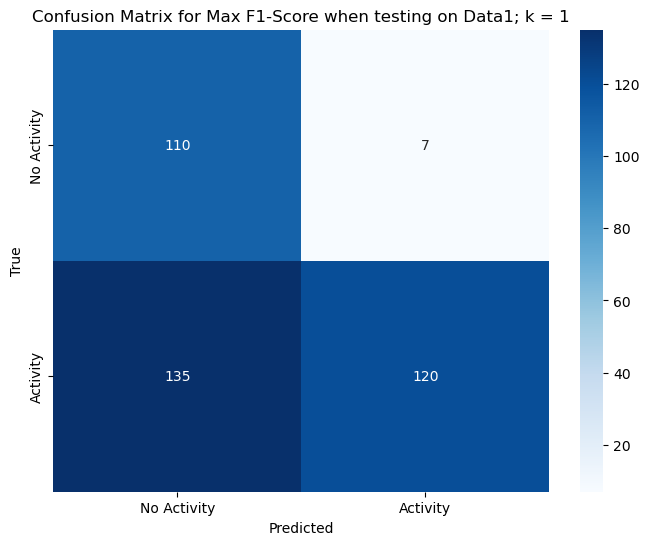

Data1 has been tested on everyone


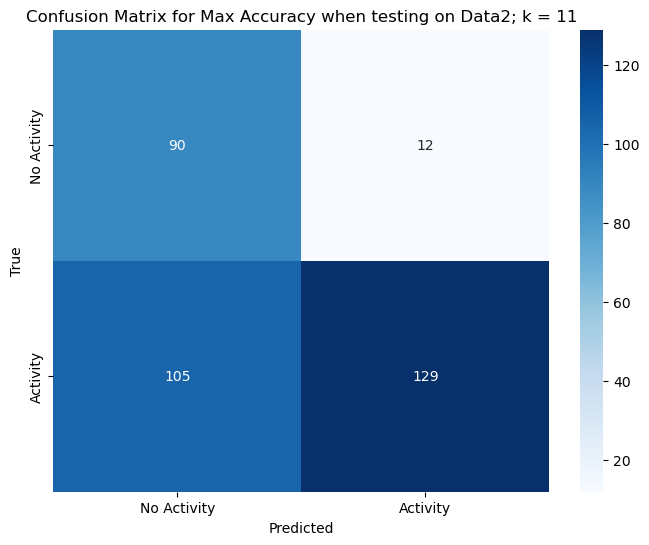

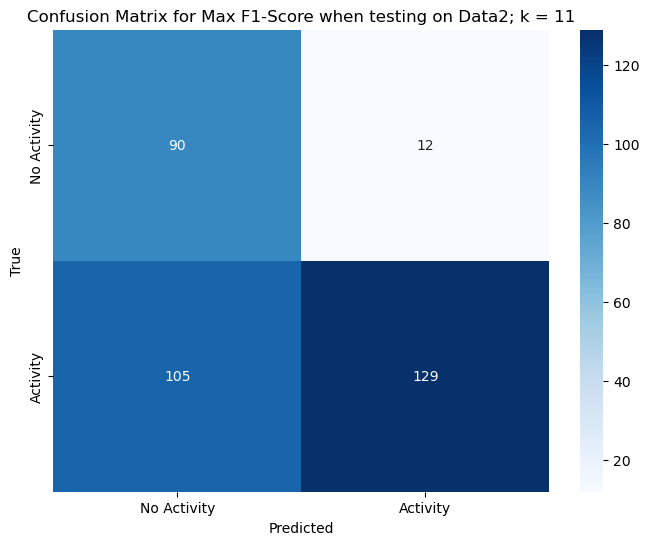

Data2 has been tested on everyone


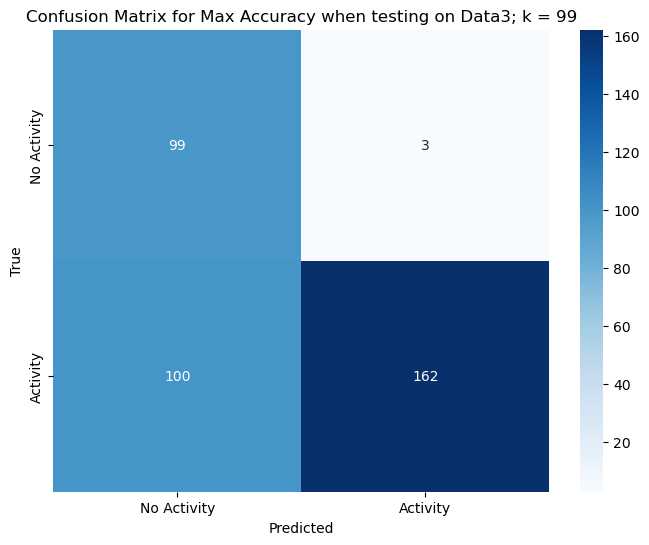

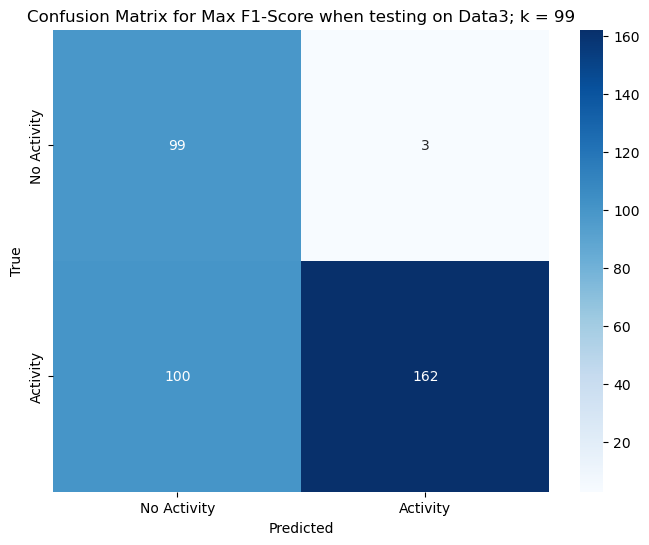

Data3 has been tested on everyone


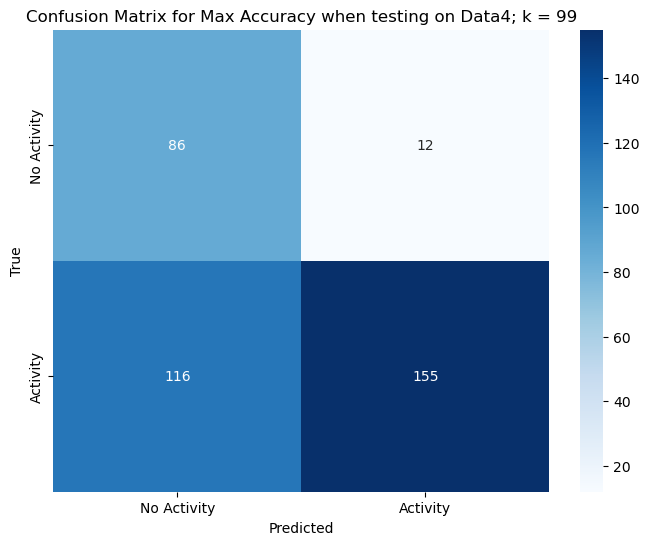

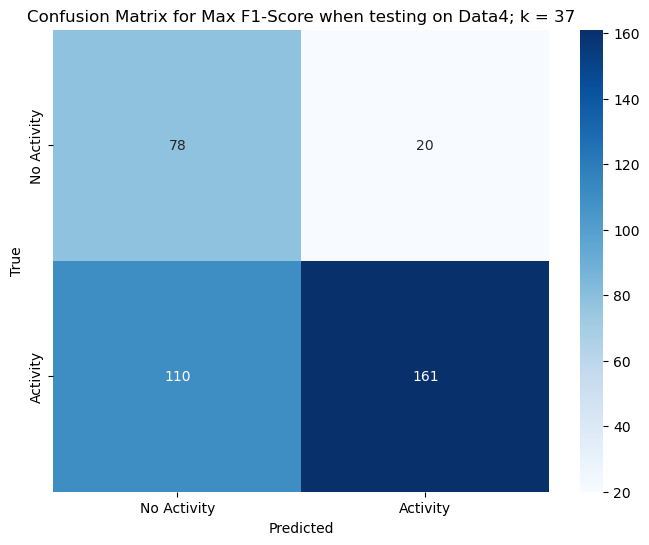

Data4 has been tested on everyone


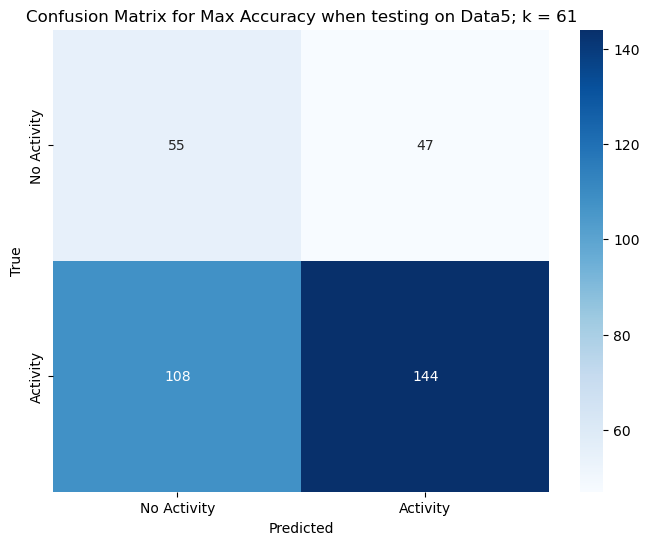

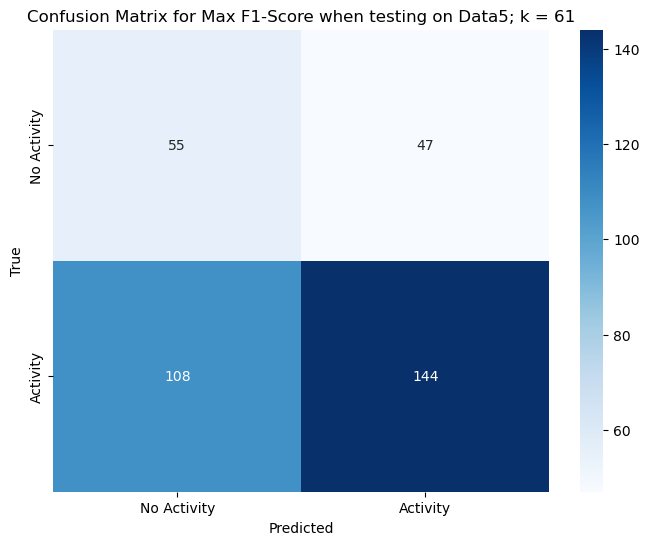

Data5 has been tested on everyone


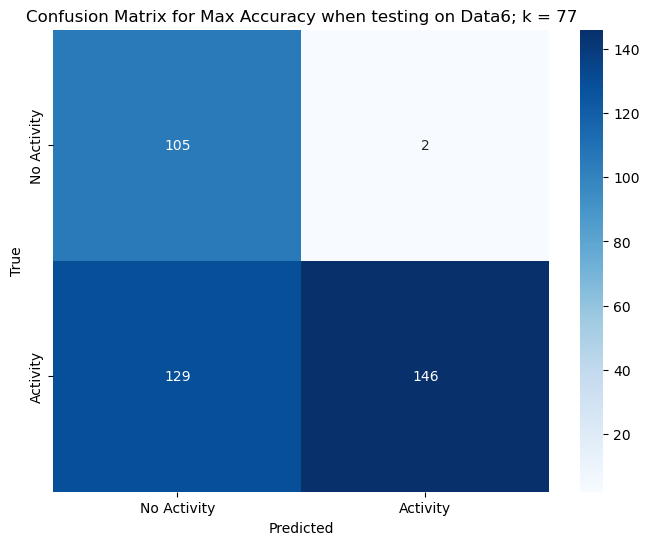

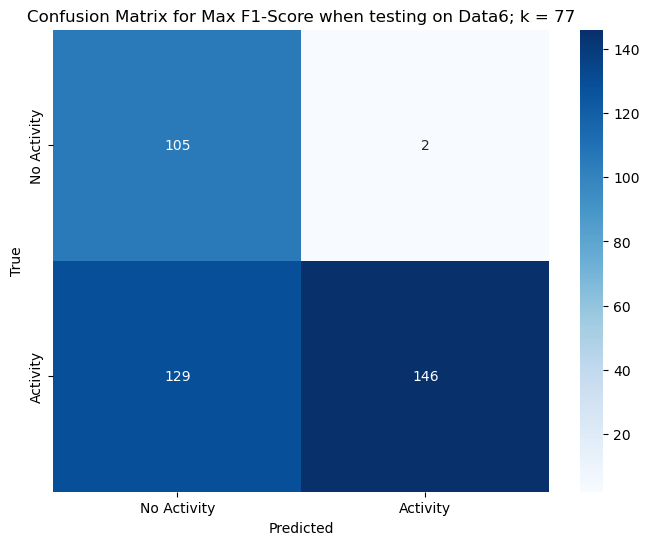

Data6 has been tested on everyone


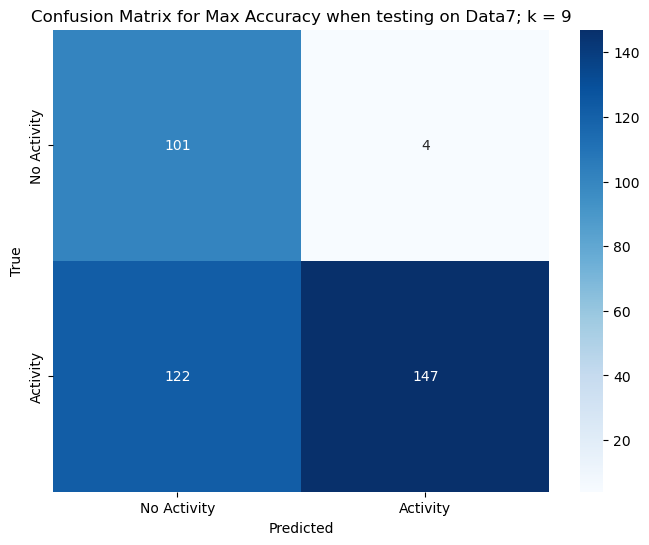

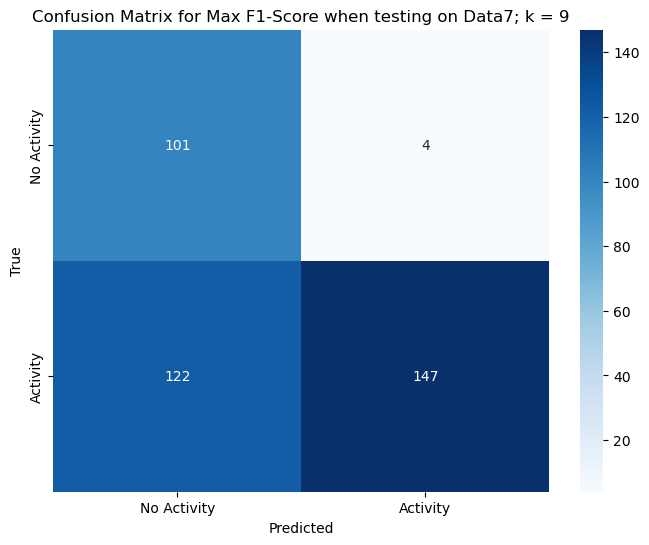

Data7 has been tested on everyone


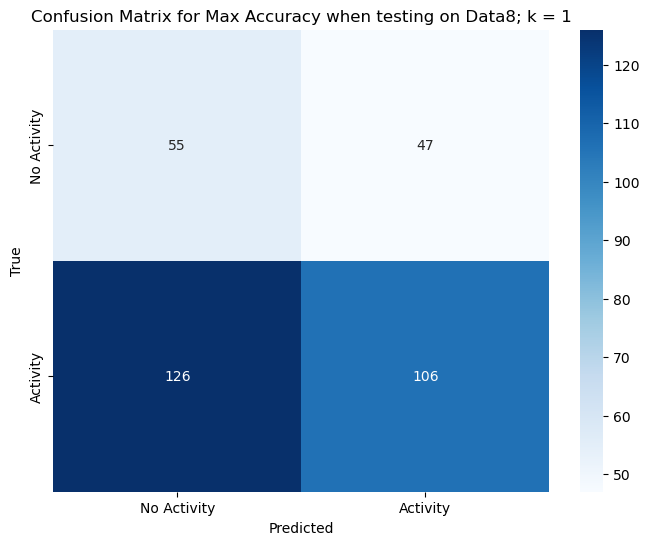

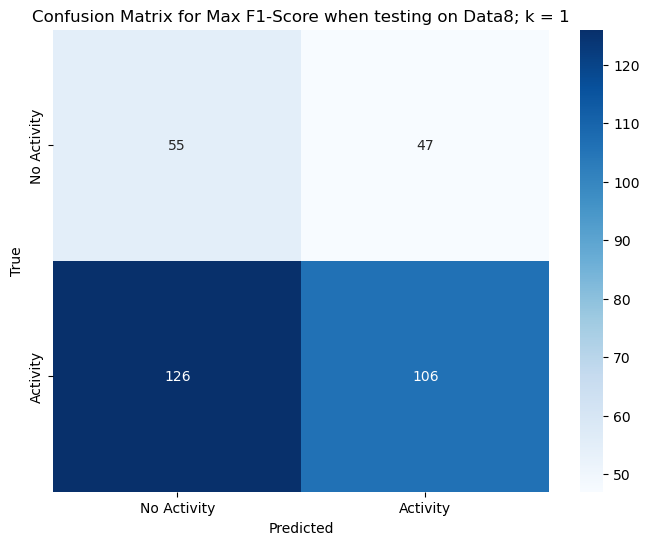

Data8 has been tested on everyone


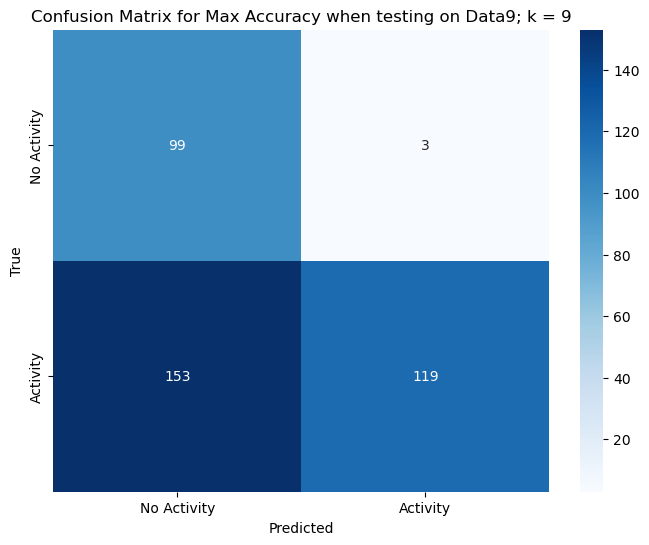

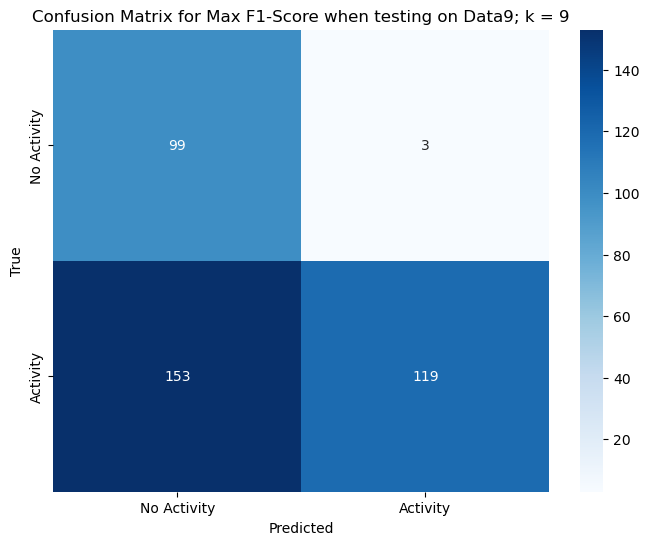

Data9 has been tested on everyone


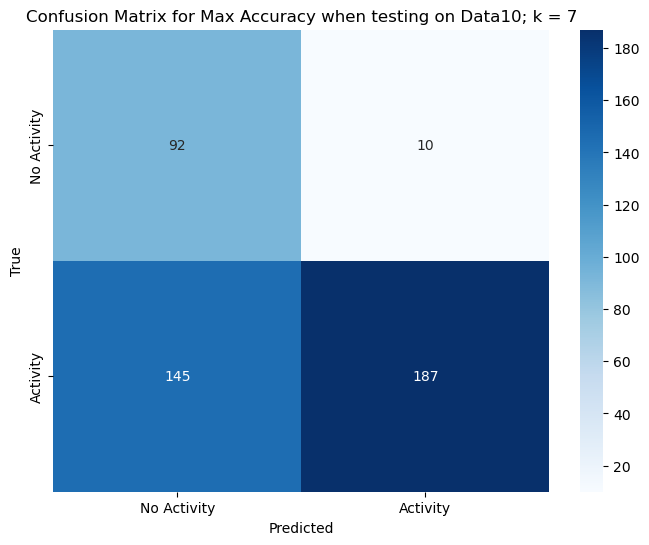

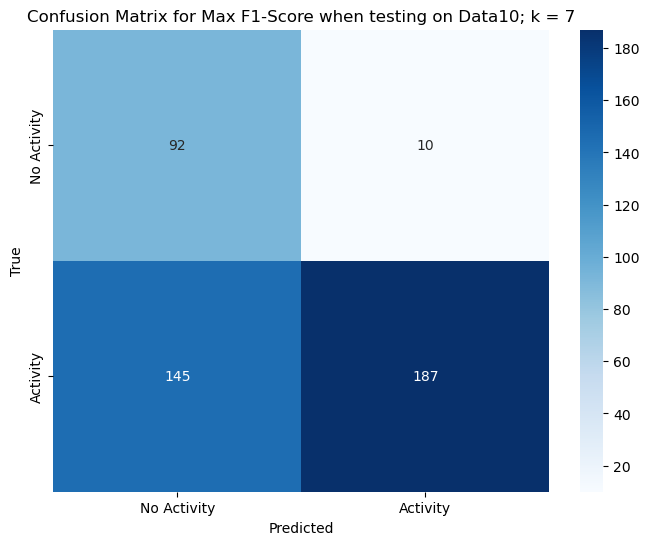

Data10 has been tested on everyone


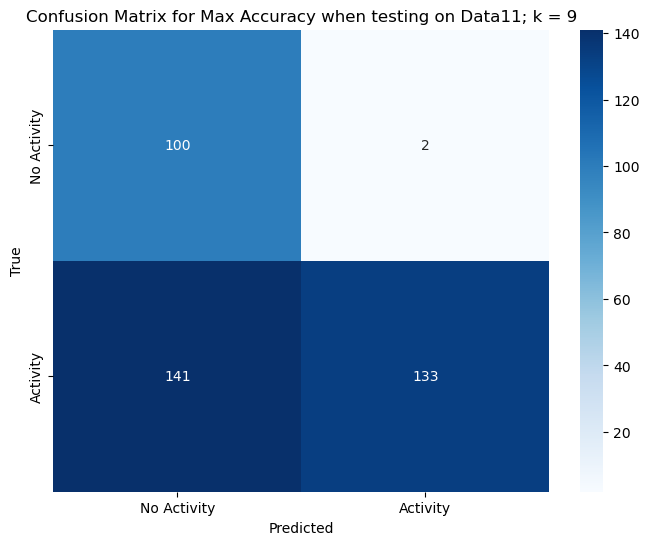

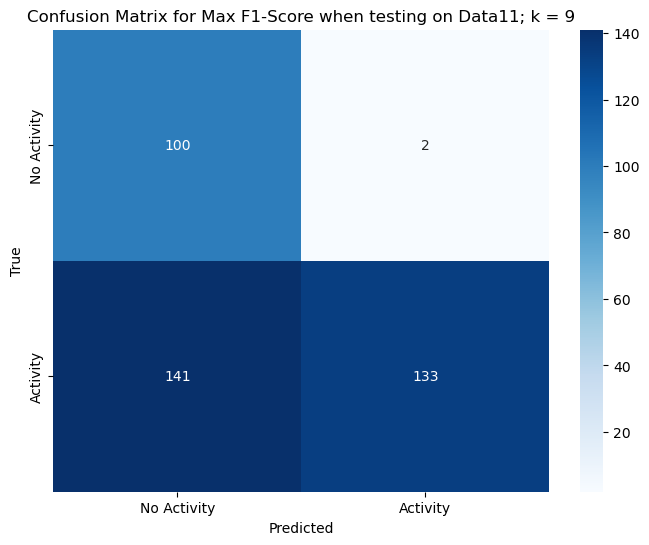

Data11 has been tested on everyone


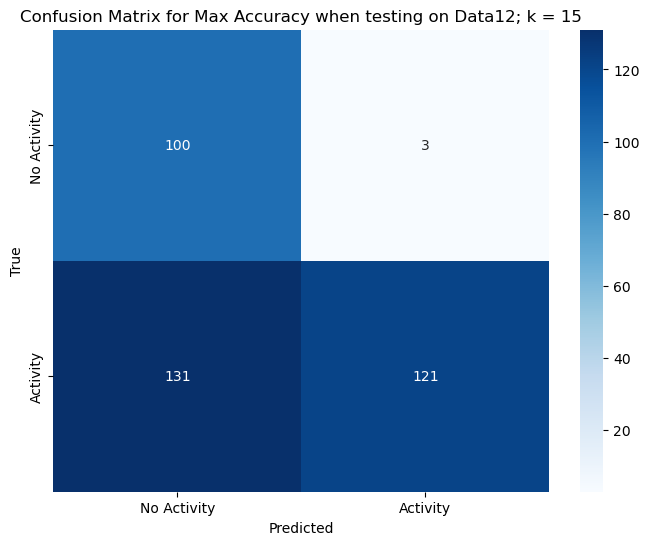

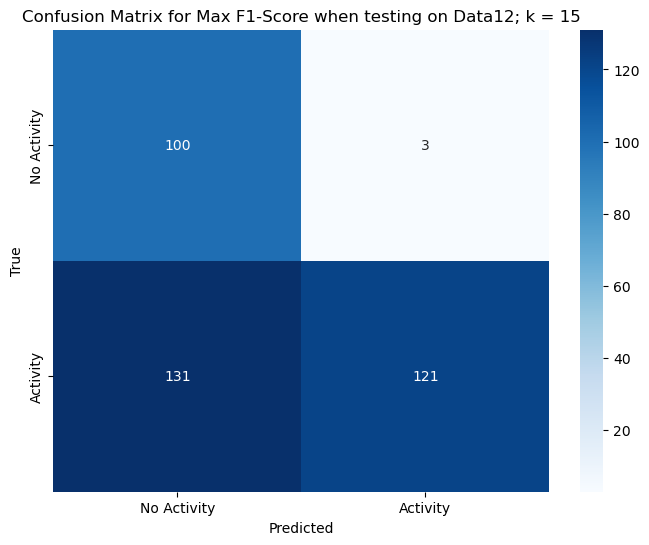

Data12 has been tested on everyone


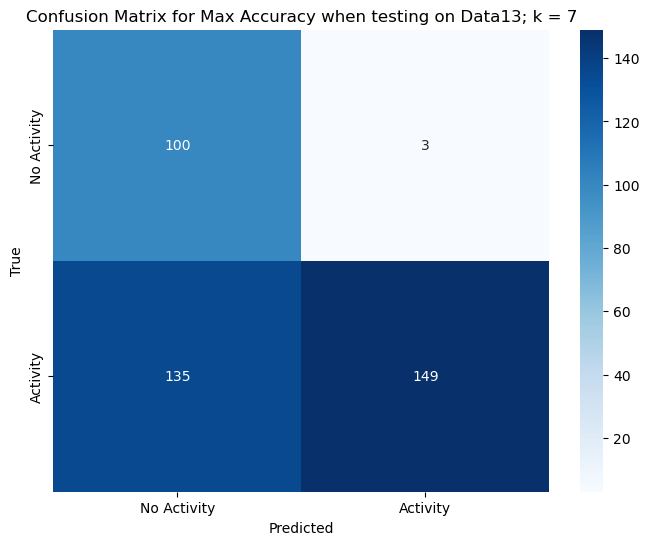

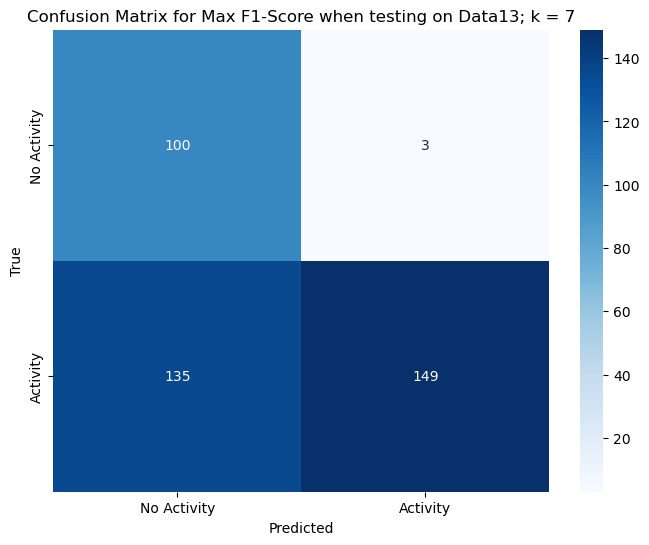

Data13 has been tested on everyone


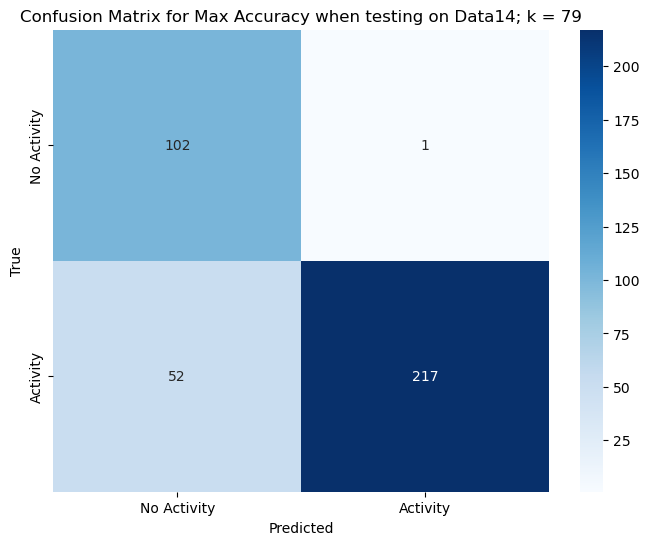

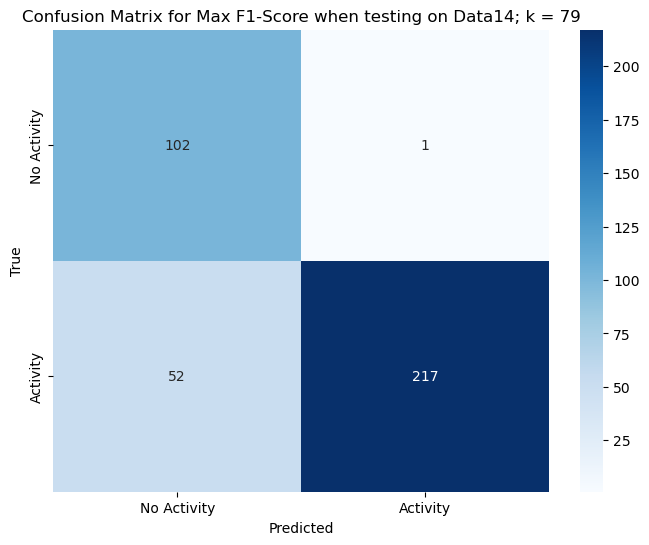

Data14 has been tested on everyone


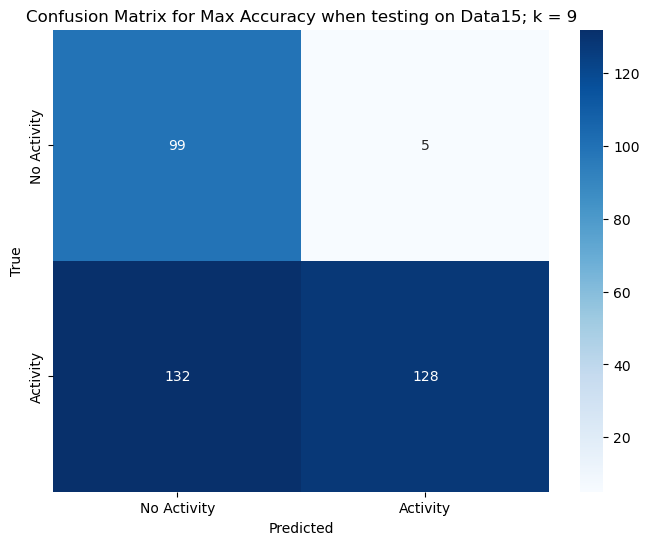

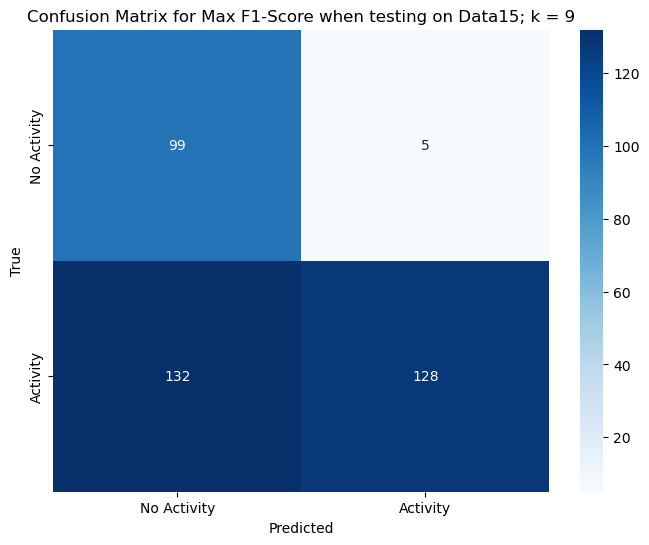

Data15 has been tested on everyone


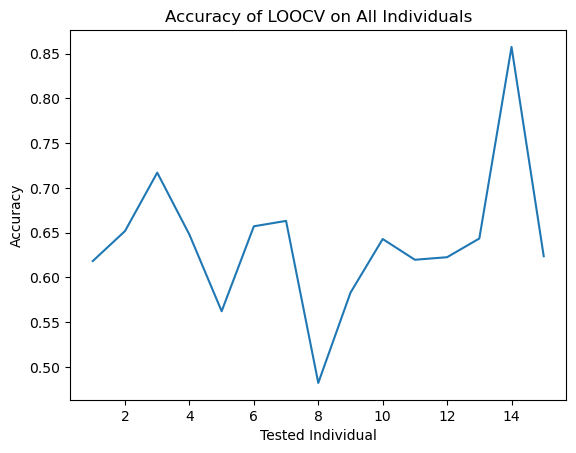

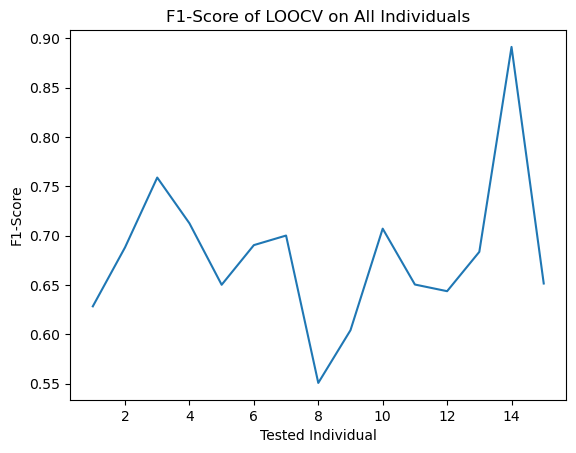

In [ ]:
## specific_windowed_features.csv
## Trained on:
## 0: baseline, clean_baseline
## 1: stairs, soccer, cycling, walking

## Tested on:
## 0: no activity
## 1: stairs, soccer, cycling, walking

trDataframes = {}
teDataframes = {}
for i in range(15):
    name = f"Data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    testingData = data[allFeatures]
    trainingData = data[allFeatures]

    trainingData = trainingData[~trainingData['activity'].isin([0, 7, 8, 9])]
    trainingData.loc[trainingData['activity'].isin([1, 2]), 'activity'] = 0
    trainingData.loc[trainingData['activity'].isin([3, 4, 5, 6]), 'activity'] = 1

    testingData = data[~data['activity'].isin([1, 2, 7, 8, 9])]
    testingData.loc[testingData['activity'].isin([3, 4, 5, 6]), 'activity'] = 1

    trDataframes[name] = testingData
    teDataframes[name] = trainingData


LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in teDataframes:
    trainingFeatures  = [col for col in teDataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = teDataframes[tester][trainingFeatures].to_numpy()
    testingActivity = teDataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in trDataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, trDataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, trDataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)


    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(testingActivity, knn.predict(testingFeatures)))
        f1 = f1_score(testingActivity, knn.predict(testingFeatures))
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, f1_score(testingActivity, y_pred))

    print(f"{tester} has been tested on everyone")

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

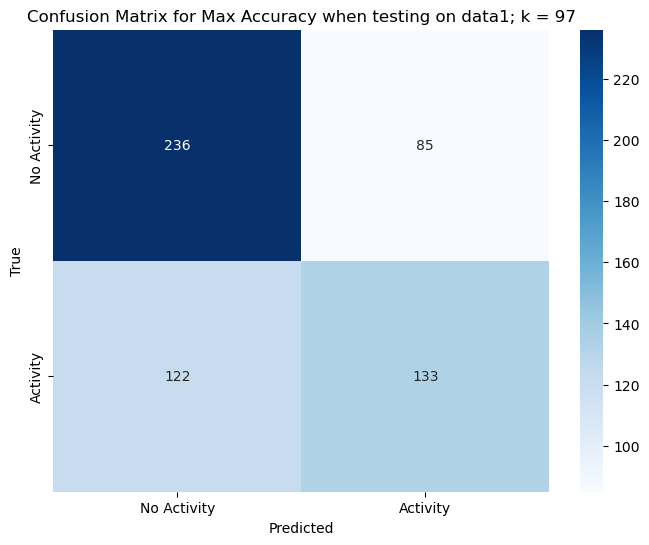

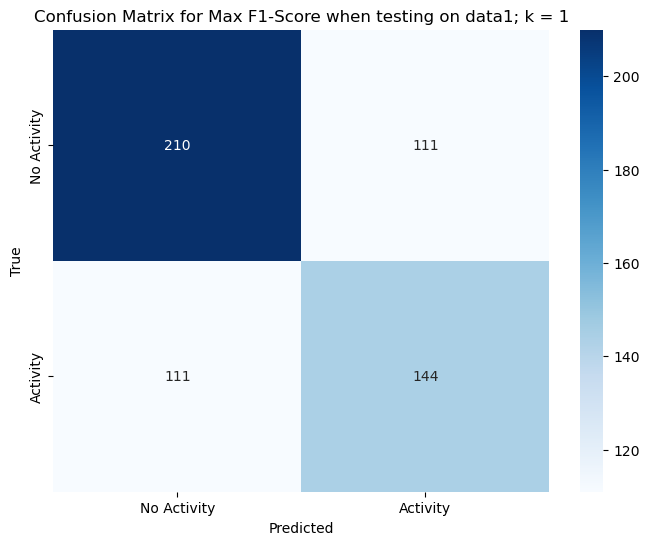

data1 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

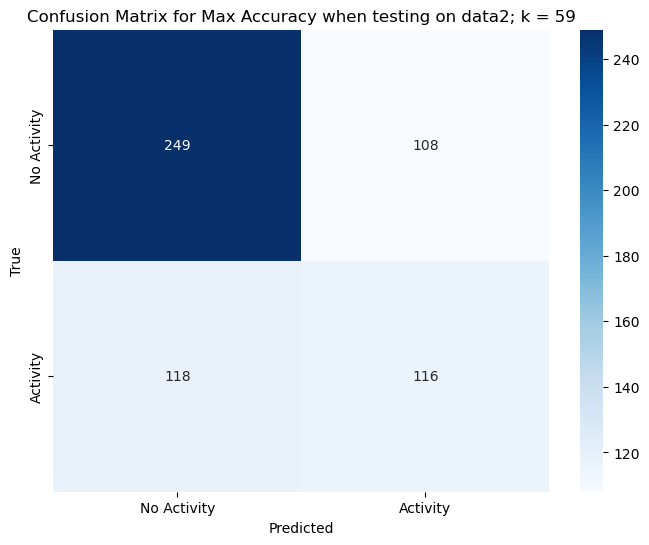

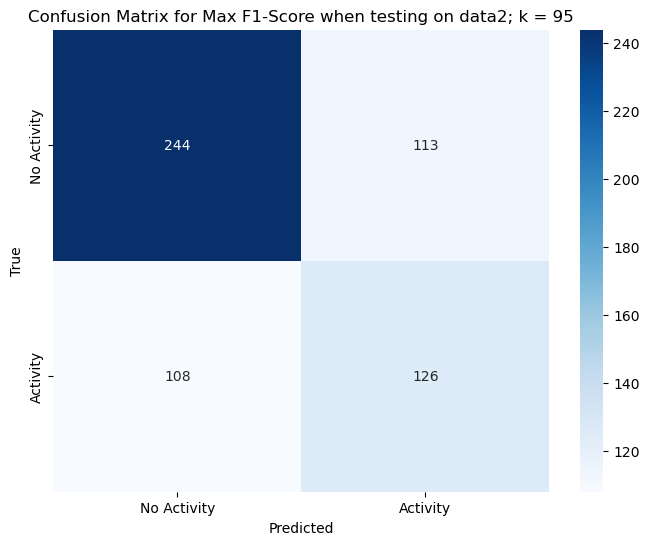

data2 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

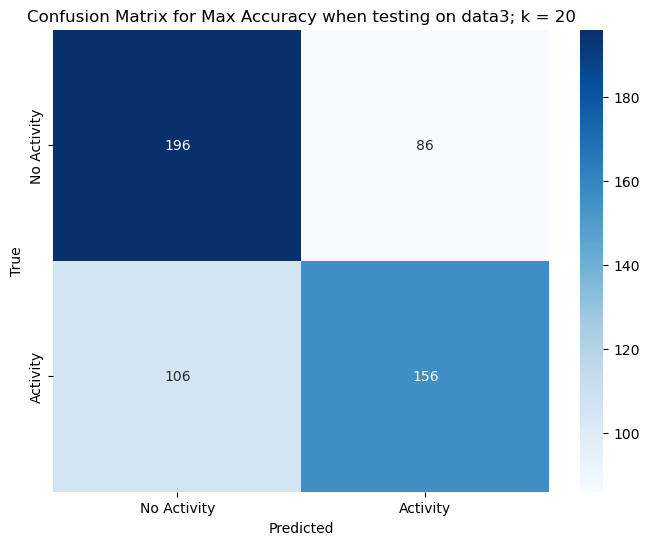

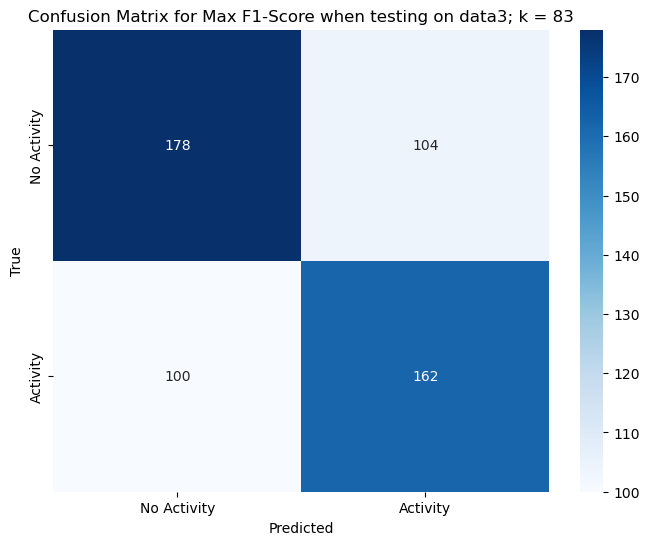

data3 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

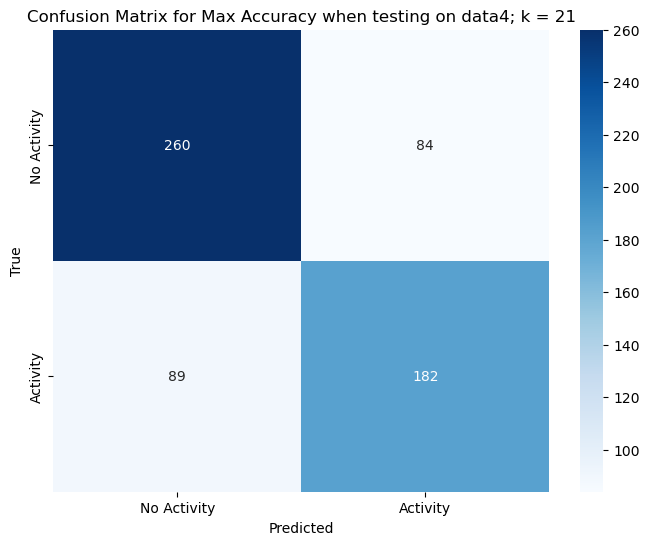

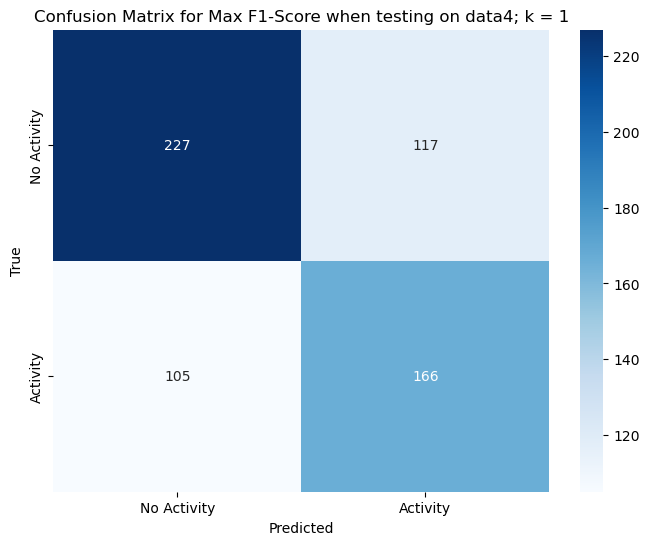

data4 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

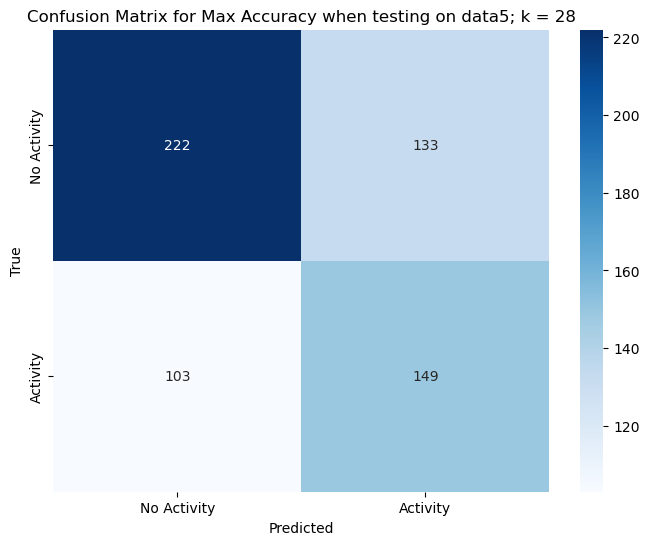

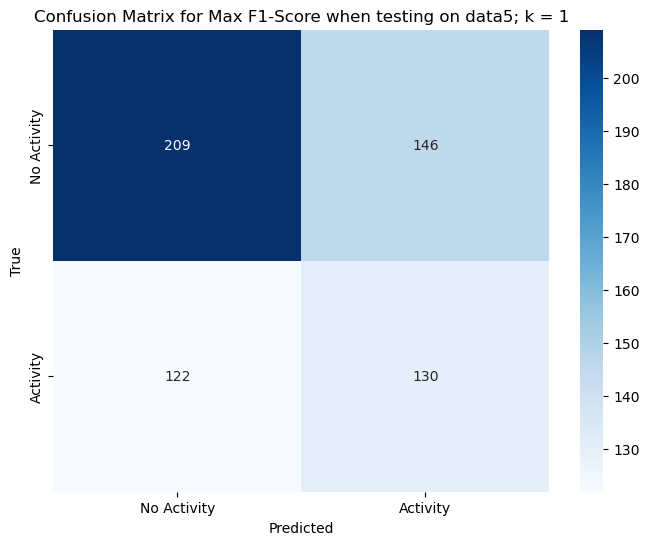

data5 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

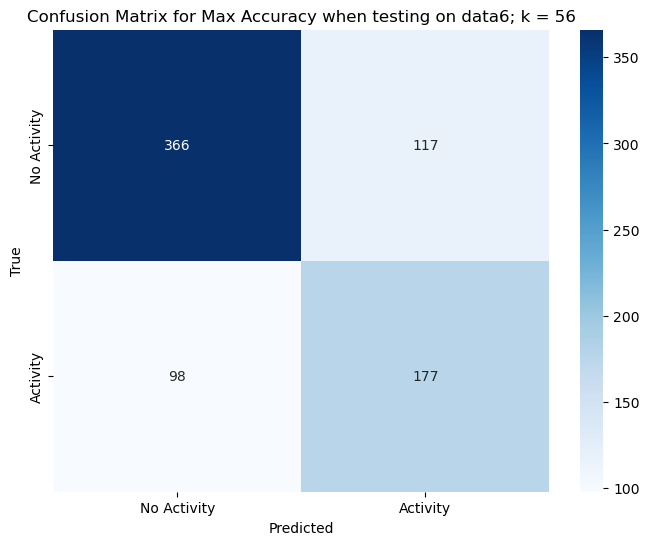

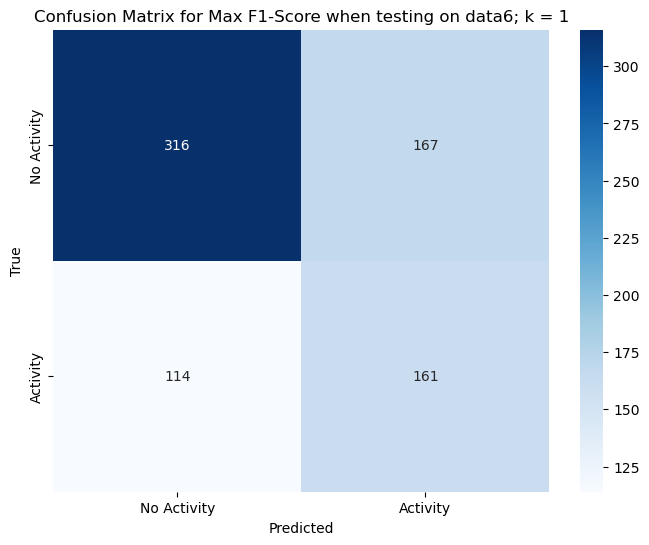

data6 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

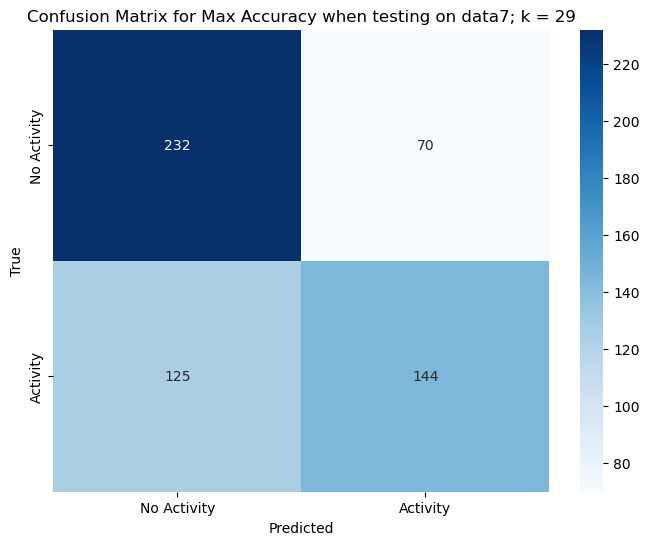

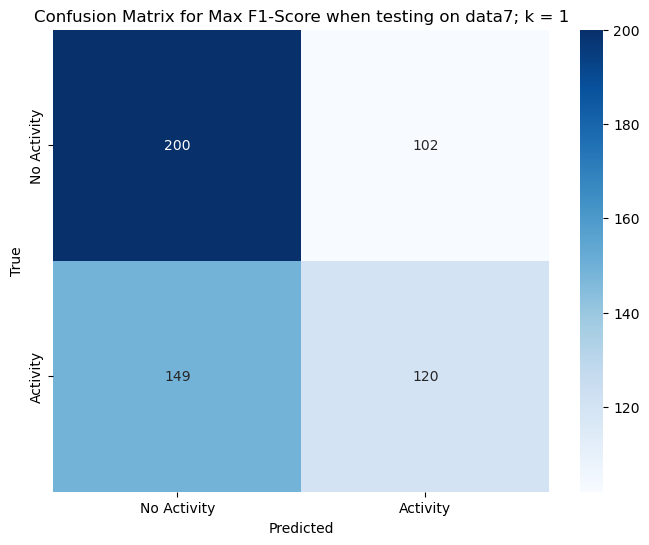

data7 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

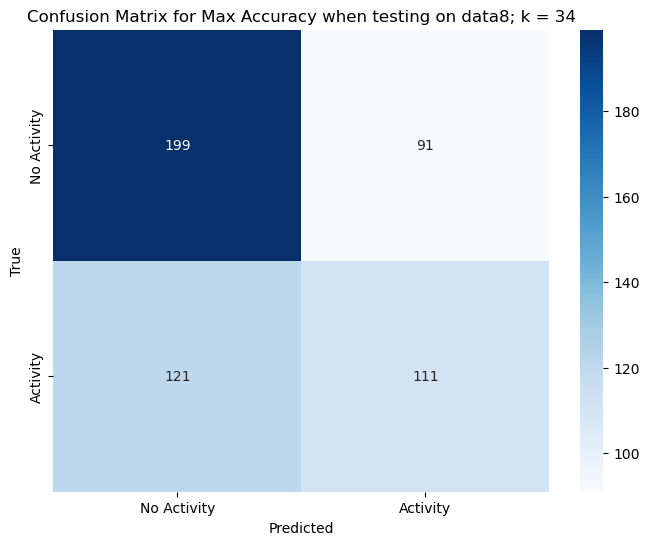

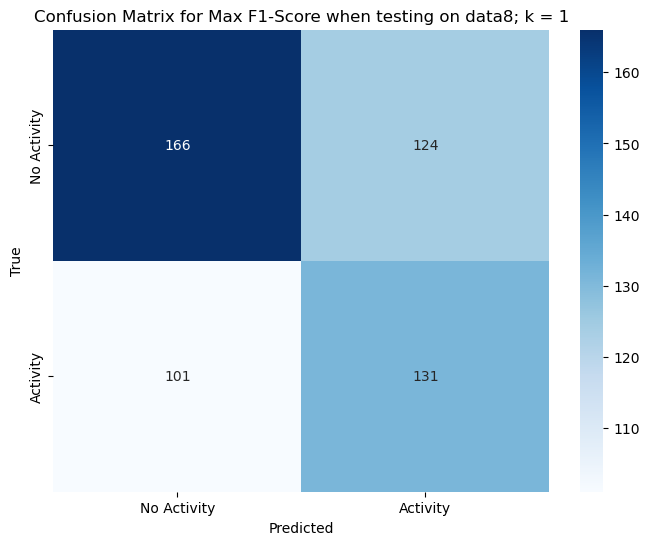

data8 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

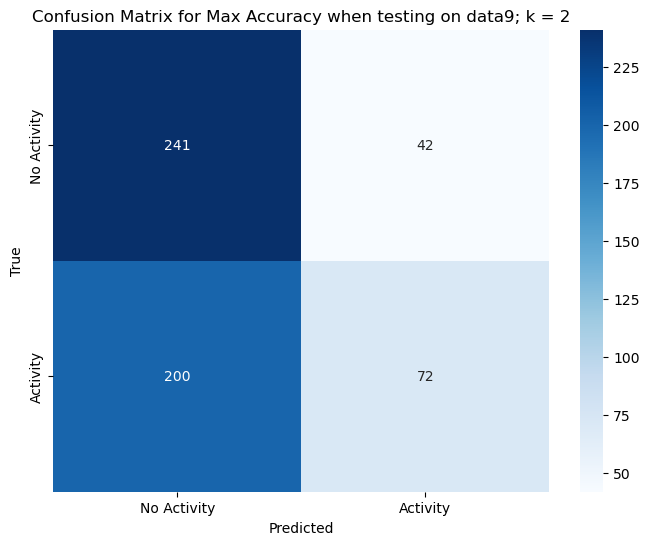

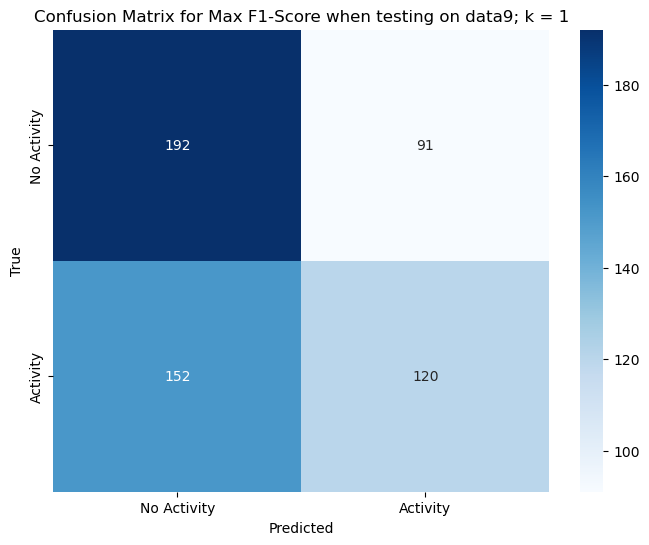

data9 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

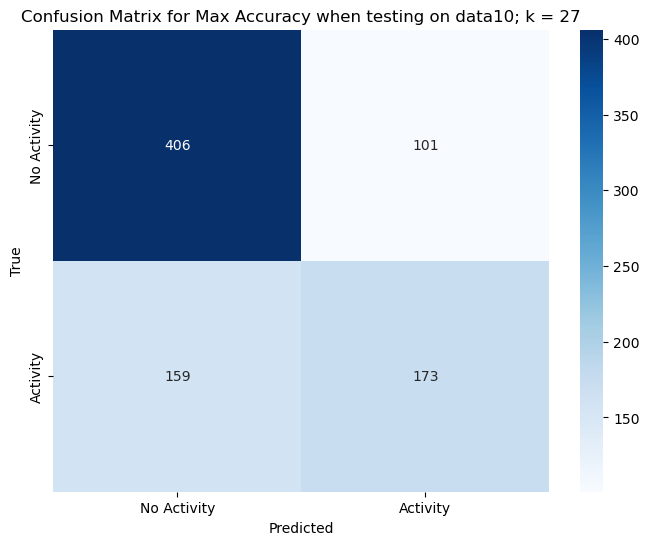

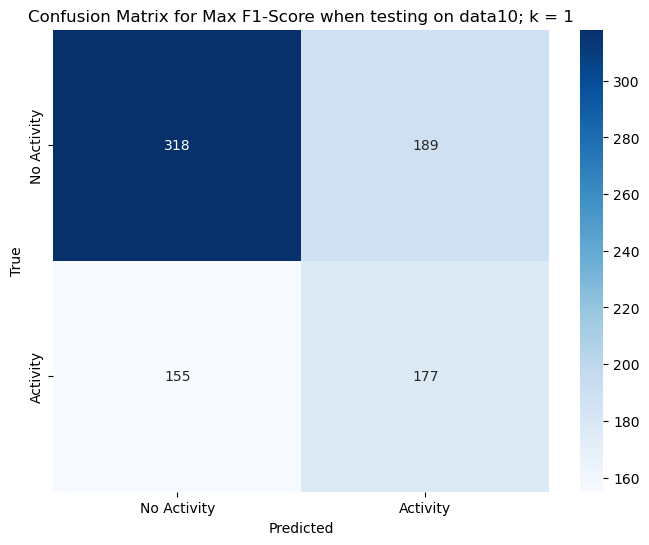

data10 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

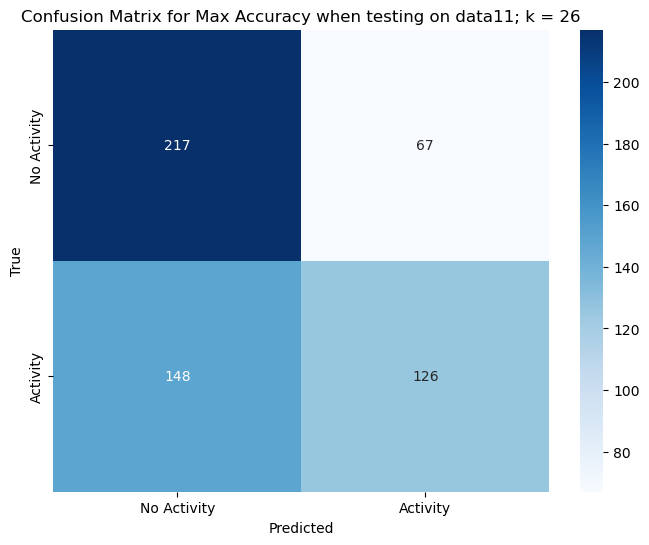

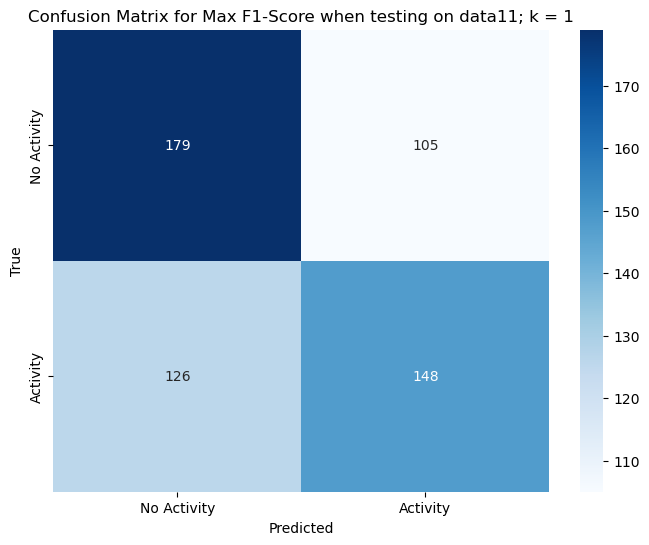

data11 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

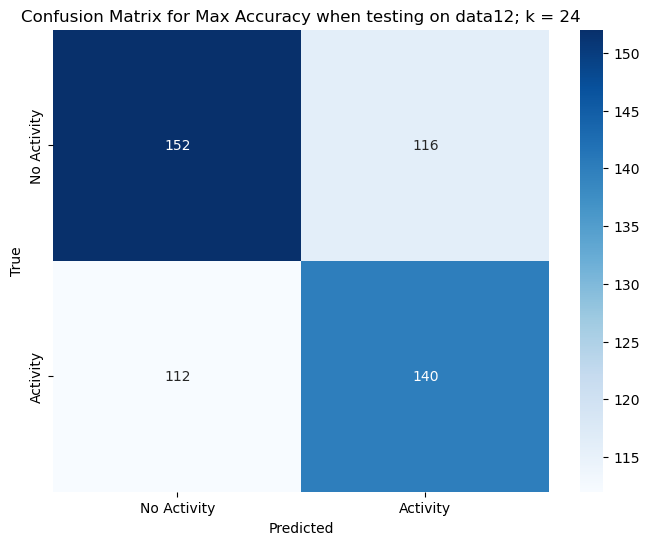

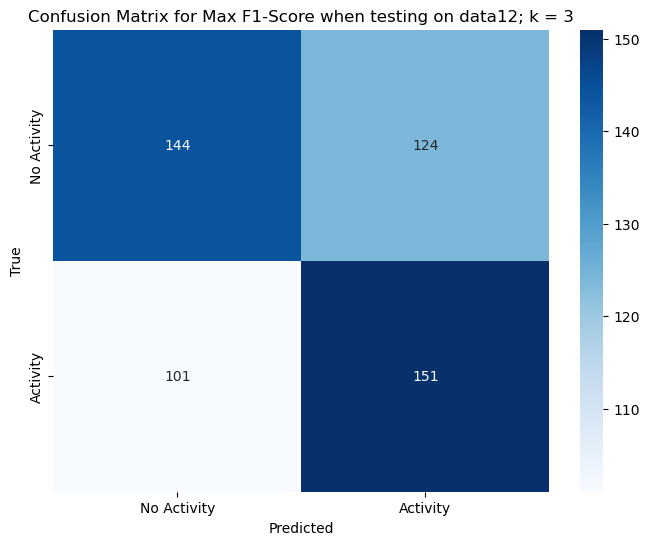

data12 has been tested on everyone


/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/lib/python3.12/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/home/j_choi9/miniconda3/envs/py3/l

In [ ]:
## specific_windowed_features.csv
## 0: no activity
## 1: stairs, soccer, cycling, walking

## Leave One Out -> split train test set -> find optimal k for accuracy and f1-score -> test left out individual

## specific_windowed_features.csv
## 0: no activity
## 1: stairs, soccer, cycling, walking

dataframes = {}
for i in range(15):
    name = f"data{i+1}"
    data = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i+1}/S{i+1}_E4/specific_windowed_features.csv")
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([1, 2, 7, 8, 9])]
    data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 1
    dataframes[name] = data

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])
for tester in dataframes:
    Features  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][Features].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    trainingFeatures = pd.DataFrame()
    trainingActivity = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            trainingFeatures = pd.concat([trainingFeatures, dataframes[trainer][Features]], ignore_index=True)
            trainingActivity = pd.concat([trainingActivity, dataframes[trainer]["activity"]], ignore_index=True)

    X_train, X_val, y_train, y_val = train_test_split(trainingFeatures, trainingActivity, test_size=0.2)

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)

    y_train = y_train.to_numpy().flatten()

    k = np.arange(1,100)
    accuracy = np.array([])
    f1score = np.array([])
    maxAccK = 0
    maxF1K = 0
    maxAcc = 0
    maxF1 = 0
    for i in k:
        knn = KNeighborsClassifier(i)
        knn.fit(X_train, y_train)
        acc = (accuracy_score(y_val, knn.predict(X_val)))
        f1 = f1_score(y_val, knn.predict(X_val))
        accuracy = np.append(accuracy, acc)
        f1score = np.append(f1score, f1)
        if acc > maxAcc:
            maxAccK = i
            maxAcc = acc
        if f1 > maxF1:
            maxF1K = i
            maxF1 = f1


    knn = KNeighborsClassifier(maxAccK)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {maxAccK}")
    plt.show()

    knn = KNeighborsClassifier(maxF1K)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["No Activity", "Activity"]

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)

    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {maxF1K}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))
    LOOCVf1_score = np.append(LOOCVf1_score, f1_score(testingActivity, y_pred))

    print(f"{tester} has been tested on everyone")

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()